
# RNN Dead Layer Fit Project
## MC2 Fixed DLF=1, Quantile Regression Loss on DLF Label


## Import general packages

In [1]:
#check env
import os
print (os.environ['CONDA_DEFAULT_ENV'])

/unix/legend/abi/ML_DL/MLenv


In [2]:
#General
import sys
import json
import yaml
import pandas as pd

#RNN imports
import numpy as np
import os
import argparse
import time
import math
import random
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
from torch.nn import init
import torch.nn.functional as F
import torch
import torch.utils.data as data_utils
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
import gzip
import pickle
import numpy as np
from torch.autograd import Variable
from scipy import sparse
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import torchsnooper #problem installing: !pip install torchsnooper --user #this worked for installing torchsnooper
import h5py
import re
from tqdm import tqdm
from torch.cuda.amp import autocast

torch.cuda.empty_cache()


DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# DEVICE = torch.device("cuda:0")
print(DEVICE)
torch.cuda.is_available()

/unix/legend/abi/ML_DL/MLenv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cuda:0


True

## Import dataset and RNN functions

In [3]:
from src.data import *
from src.RNN import *
from src.training import *
from src.misc import *

## Get relevant paths

In [4]:
# Data paths:
CodePath = os.path.dirname(os.path.abspath("__file__"))
MC_PATH = CodePath+"/data/V05268A_data/training_data_V05268A_5000randomFCCDs_randomDLFs/"
MC_PATH_FCCDonly = CodePath+"/data/V05268A_data/training_data_V05268A_5000randomFCCDs_DLF1/"

DATA_PATH = CodePath+"/data/V05268A_data/experimental_data_V05268A.h5"
MCBESTFIT_FOLDER = CodePath+"/data/V05268A_data/MCBestFit_data_V05268A_FCCD0.97mm/"

## Plot Training Data

no files:  4908


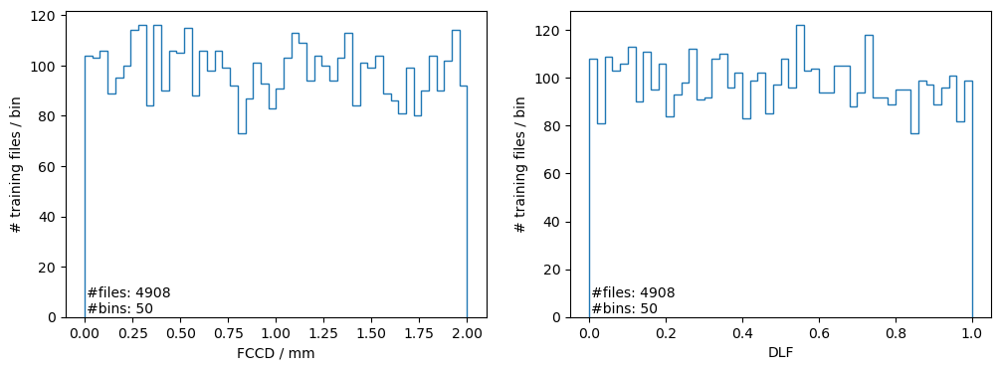

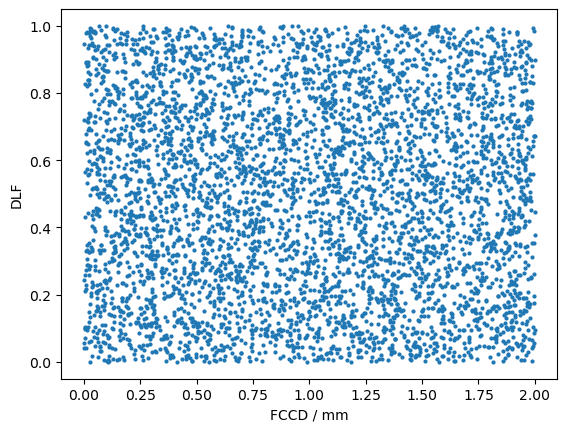

In [5]:
#Plot Training Data
plotTrainingData(MC_PATH)

no files:  4991


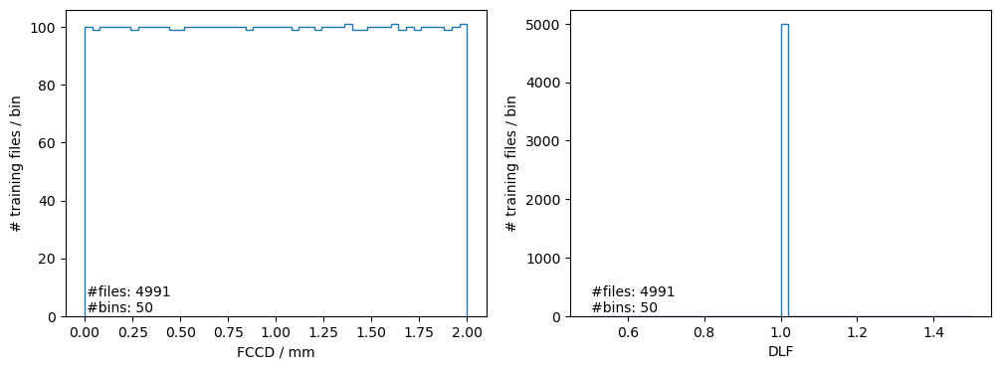

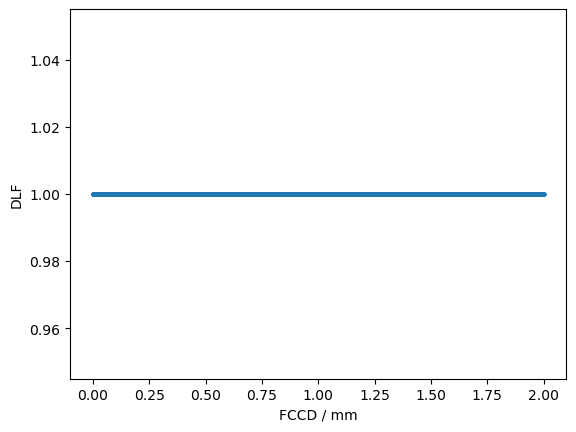

In [6]:
#Plot Training Data
plotTrainingData(MC_PATH_FCCDonly)

# -------------------------------------------------------
# WORKFLOW
# -------------------------------------------------------

# TRAINING 1: full dataset

In [7]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
RNN_ID = "RNN_MC2DLF1_maxE400_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"
# RNN_ID = "RNN_MC2DLF1_norm1_2scalers_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"
# RNN_ID = "RNN_MC2DLF1_norm1_ratioInput_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Training  (DO NOT RERUN UNLESS NECESSARY)

In [8]:
# #load dataset
# BATCH_SIZE = 4 
# # train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)
# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
#                 normaliseSpectraUnity = True, ratioSpectraRNNInput = True)


In [9]:
# #run training
# FCCD_accuracy_values, DLF_accuracy_values, loss_values = train_RNN(dataset, train_loader, test_loader, NUM_EPOCHS, LEARNING_RATE, saveRNN=True, 
#                                                                    plot_training_results = True, RNN_ID = RNN_ID, quantileRegressionDLF=True)


In [10]:
# #Training Results
# training_results(NUM_EPOCHS, loss_values, FCCD_accuracy_values, DLF_accuracy_values, save_plots = False, RNN_ID = RNN_ID)


## Testing

In [11]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, 
#                                                normaliseSpectraUnity = True, separate_scalers=True)
# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
#                                                normaliseSpectraUnity = True, ratioSpectraRNNInput = True)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:34<00:00, 142.79it/s]


(4908, 790)


In [12]:
# Load saved model
RNNclassifier_fulldataset = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_fulldataset.load_state_dict(torch.load(model_path))
RNNclassifier_fulldataset.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:12<00:00, 10.39it/s]


FCCD accuracies: 
total:  3000
TP:  1463
FP:  10
TN:  1520
FN:  7
accuracy:  0.9943333333333333
precision:  0.9932111337406653
recall:  0.9952380952380953

DLF accuracies: 
accuracy_DLF:  0.9863333333333333

roc auc FCCD:  0.9996158463385354

Total # misclassified trials FCCD:  17  / 3000
Total # misclassified trials DLF:  41  / 3000


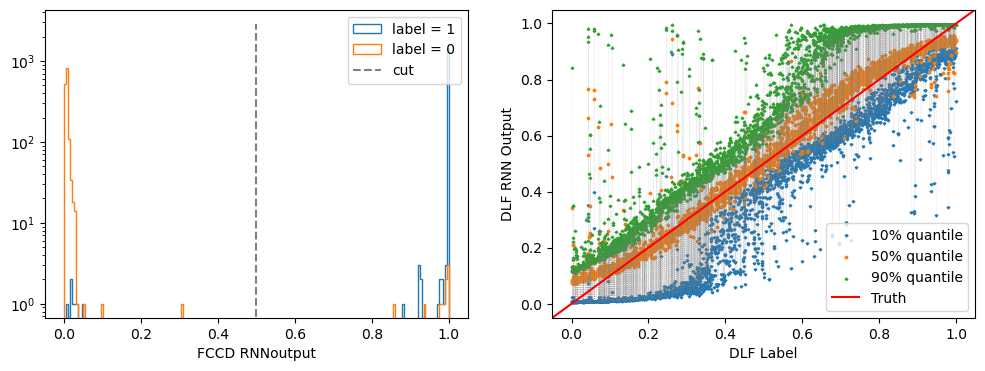

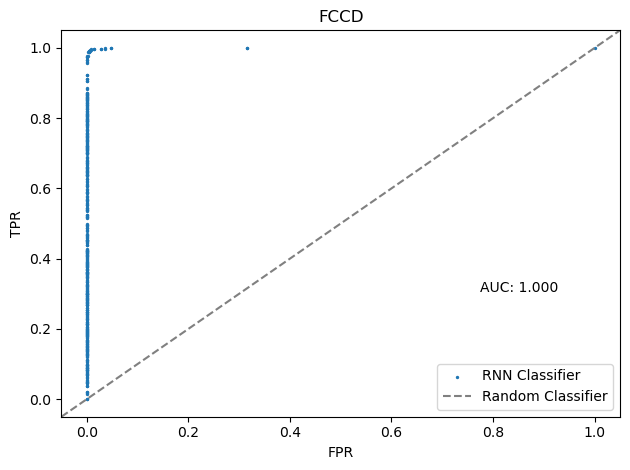

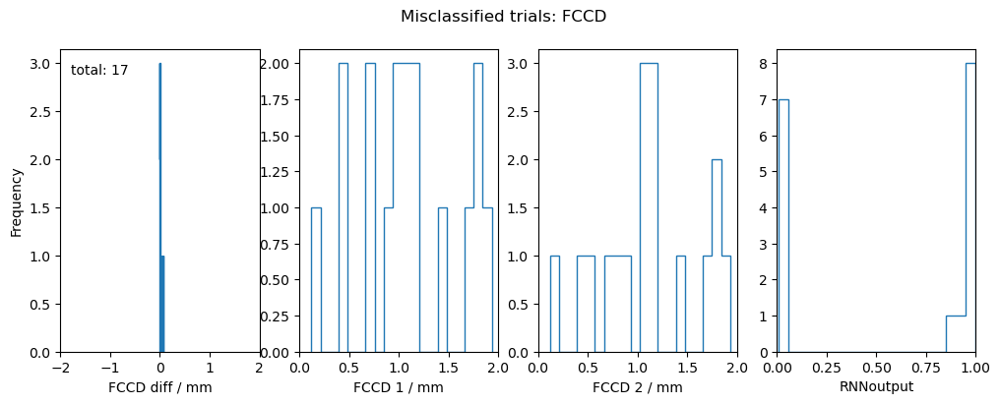

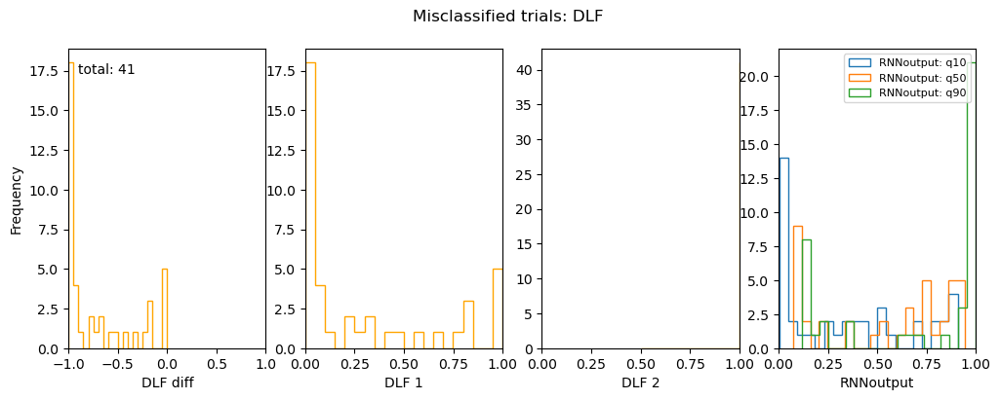

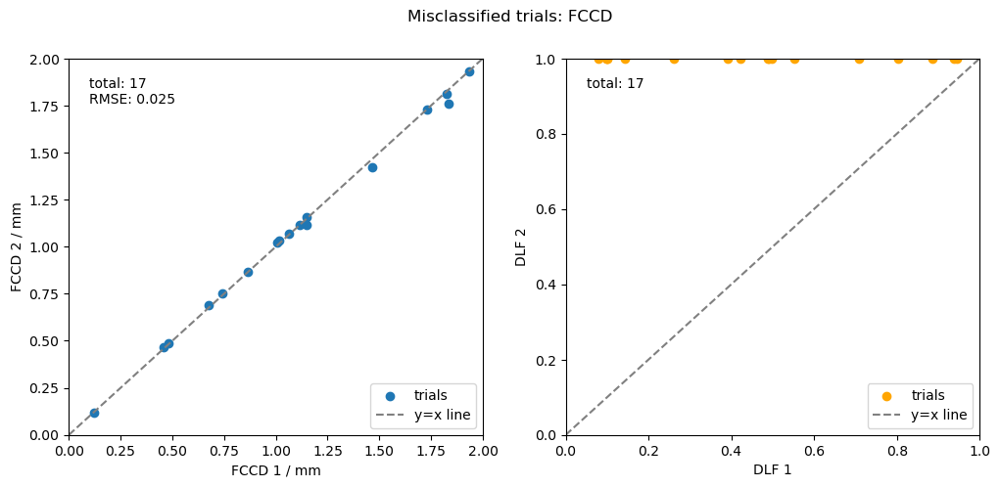

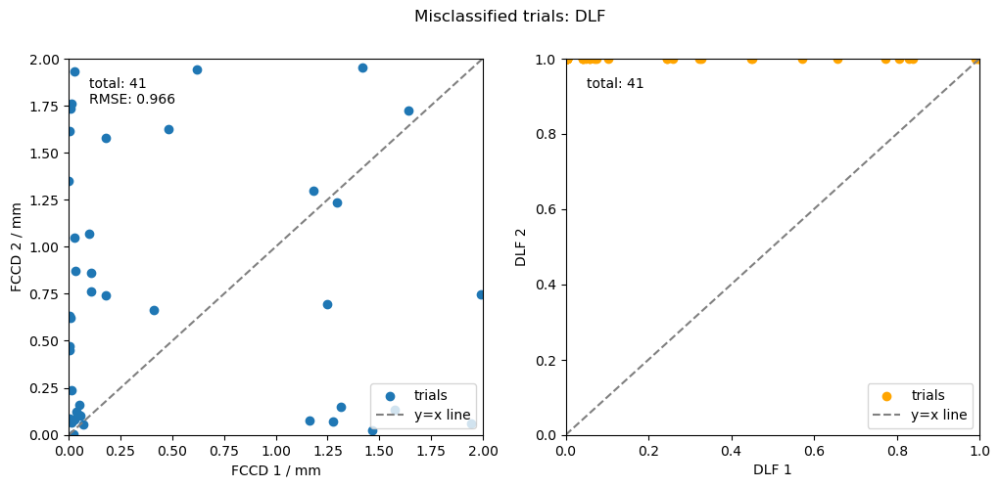

In [13]:
#testing
accuracies_fulldataset = test_RNN(RNNclassifier_fulldataset, test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

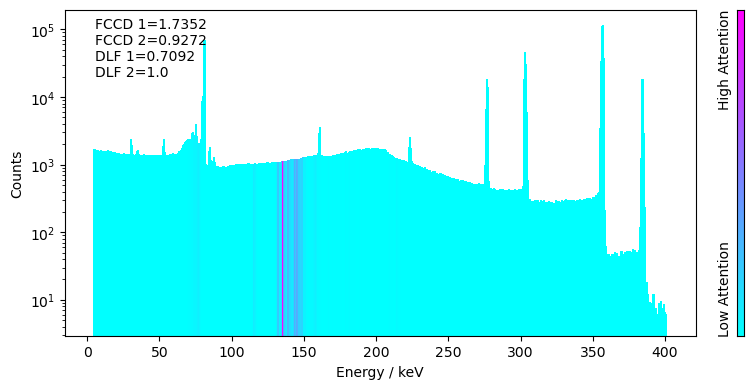

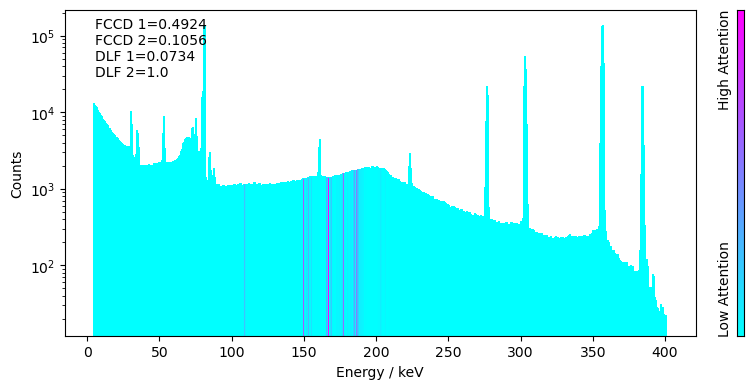

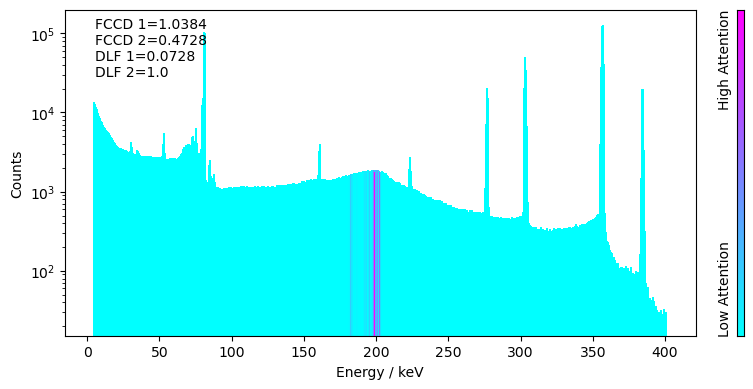

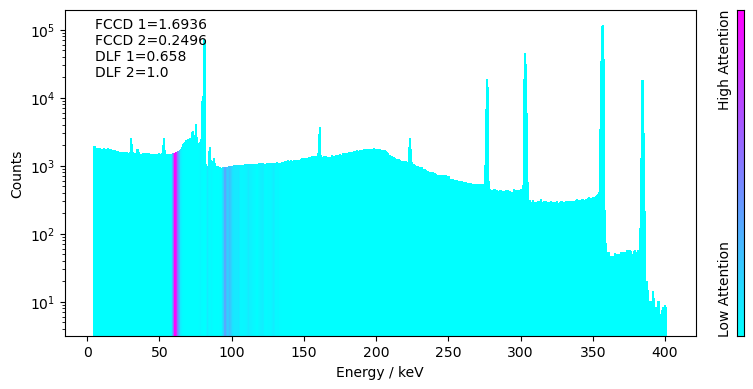

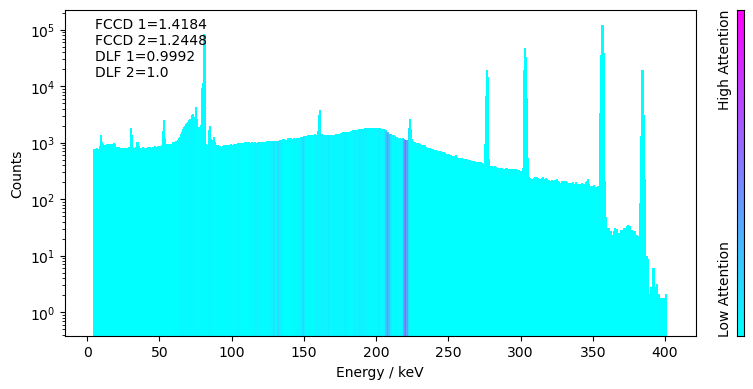

...

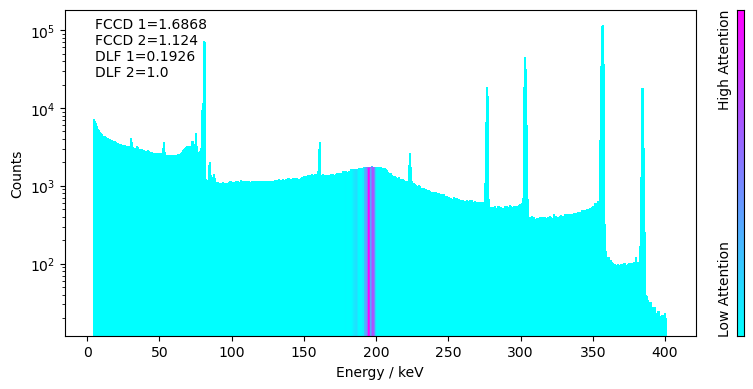

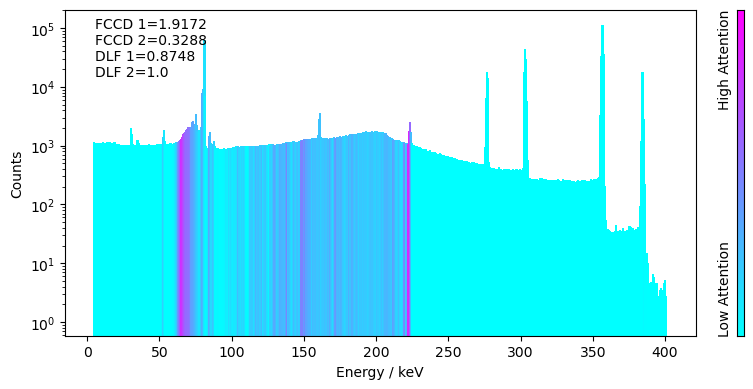

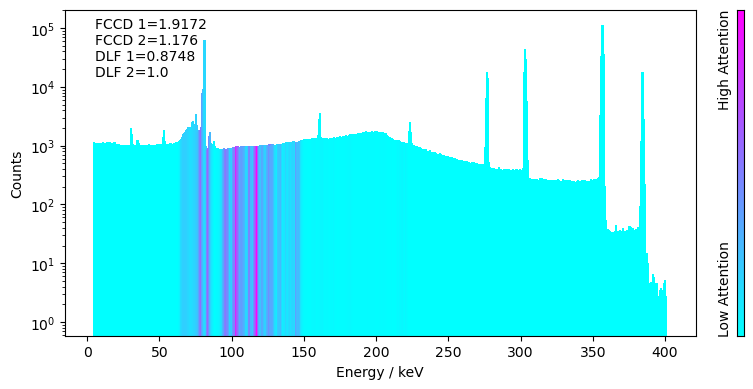

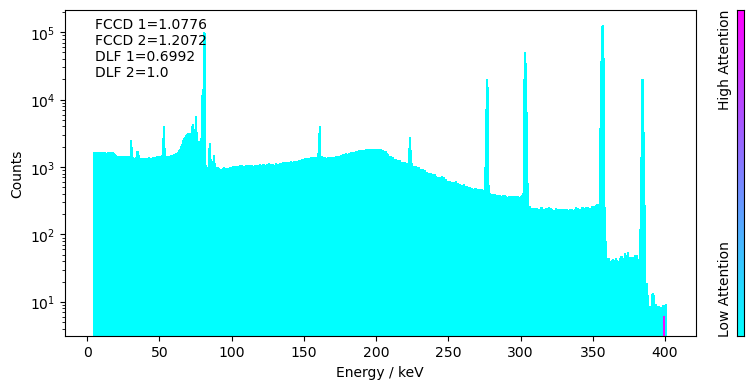

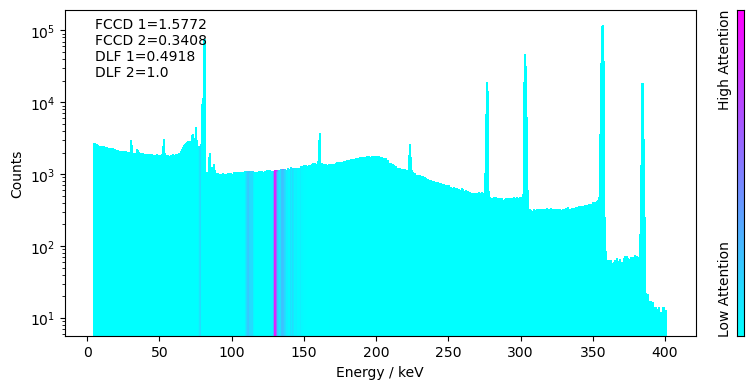

In [14]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:06<00:00, 11.33it/s]


saved average attention to csv file


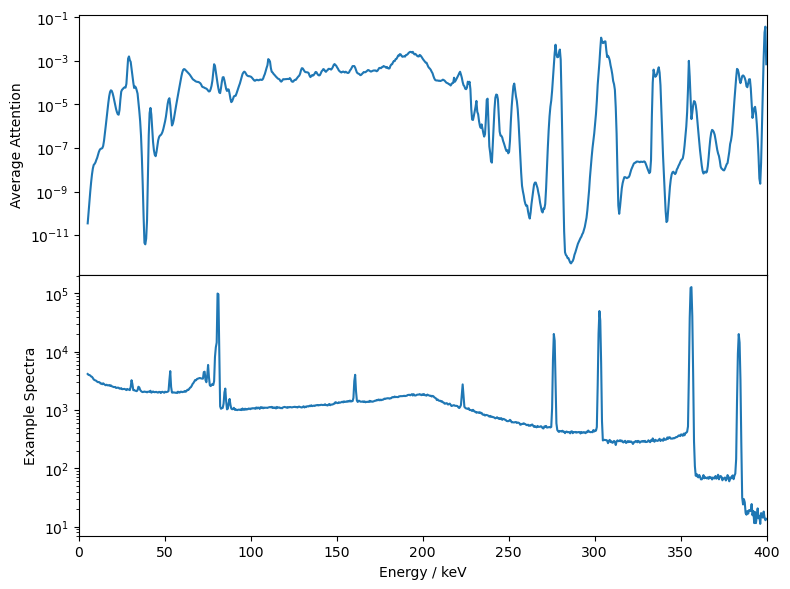

In [15]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, RNN_ID=RNN_ID, save_plots = True,
                                          quantileRegressionDLF=True, maxE=400)


# TRAINING 2: restircted dataset - Max FCCD diff = 0.5 mm
Only train on FCCDs with a max diff of 0.5 mm

In [16]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.5
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_maxE400_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxFCCDdiff=0.5mm

In [17]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:26<00:00, 186.78it/s]


(4908, 790)


In [18]:
# Load saved model
RNNclassifier_maxFCCDdiff0_5mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_5mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_5mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:04<00:00, 11.58it/s]


FCCD accuracies: 
total:  3000
TP:  1404
FP:  9
TN:  1507
FN:  80
accuracy:  0.9703333333333334
precision:  0.9936305732484076
recall:  0.9460916442048517

DLF accuracies: 
accuracy_DLF:  0.9853333333333333

roc auc FCCD:  0.9981593461300485

Total # misclassified trials FCCD:  89  / 3000
Total # misclassified trials DLF:  44  / 3000


{'accuracy_FCCD': 0.9703333333333334,
 'precision_FCCD': 0.9936305732484076,
 'recall_FCCD': 0.9460916442048517,
 'accuracy_DLF': 0.9853333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9981593461300485,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.04002226346714673,
  'RMSE_DLFmisclassified_FCCD': 0.2623348450150893,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 89,
  'NoMisclassifiedDLF': 44}}

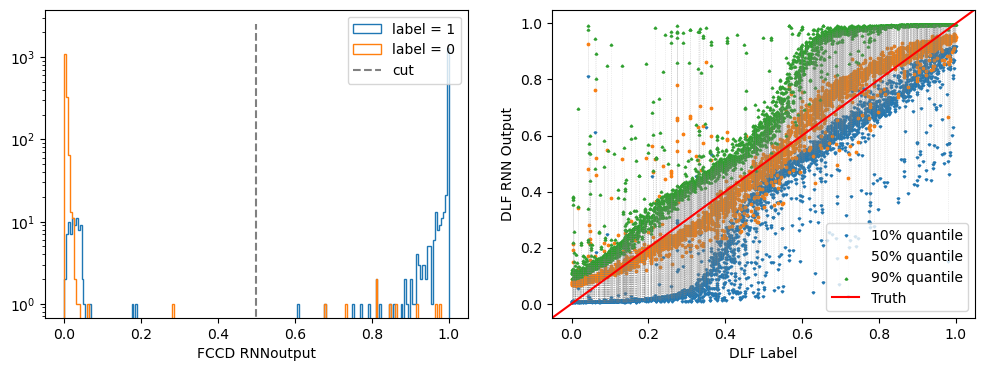

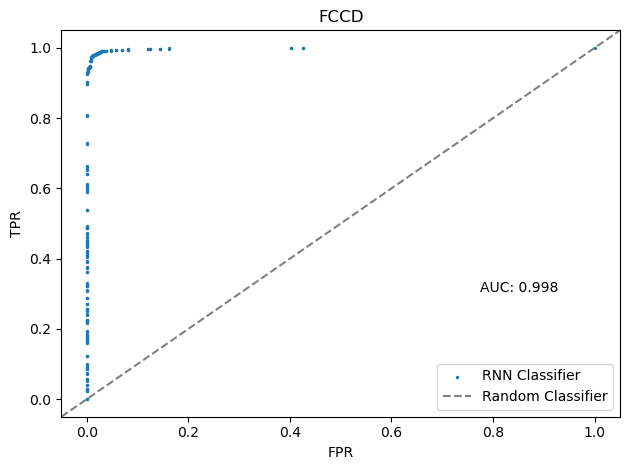

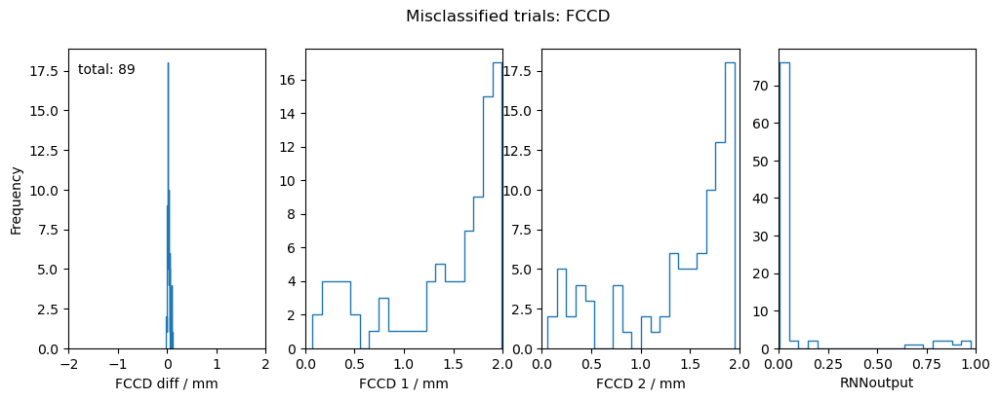

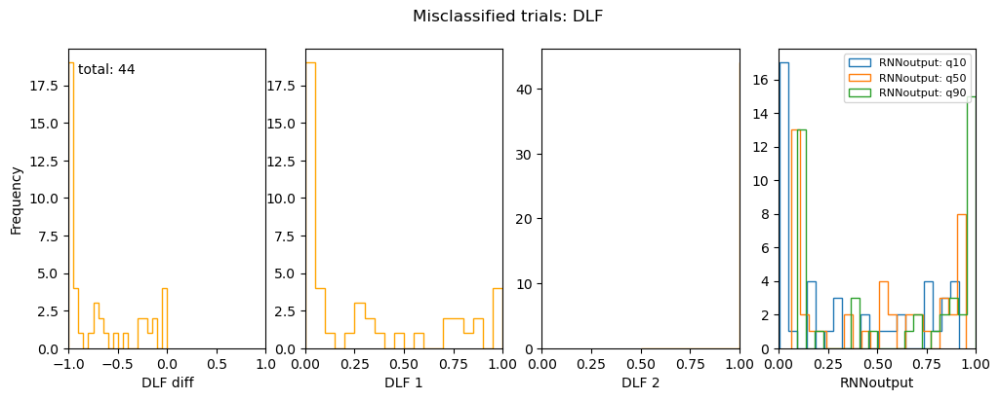

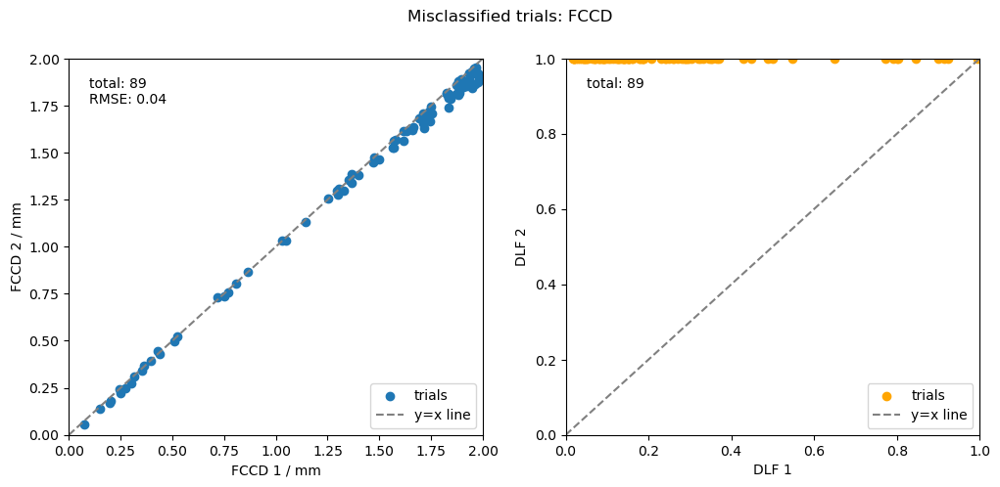

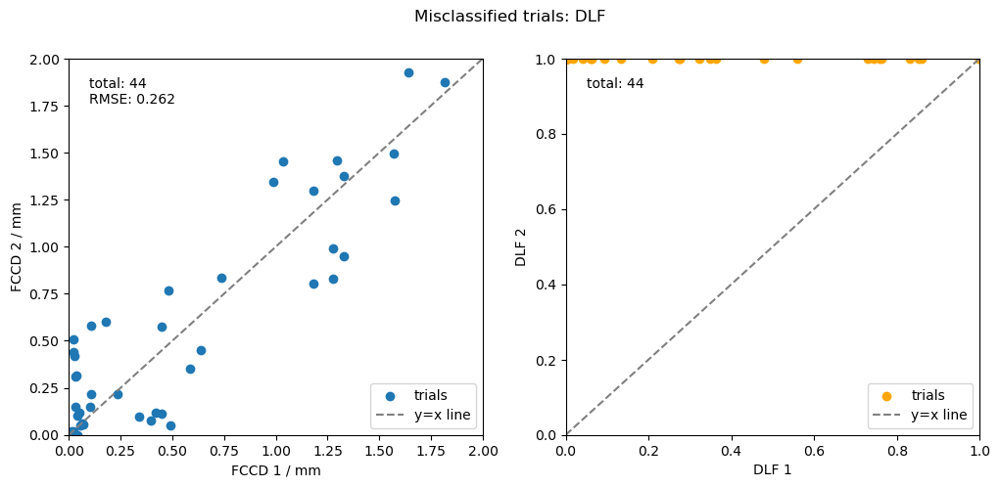

In [19]:
test_RNN(RNNclassifier_maxFCCDdiff0_5mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

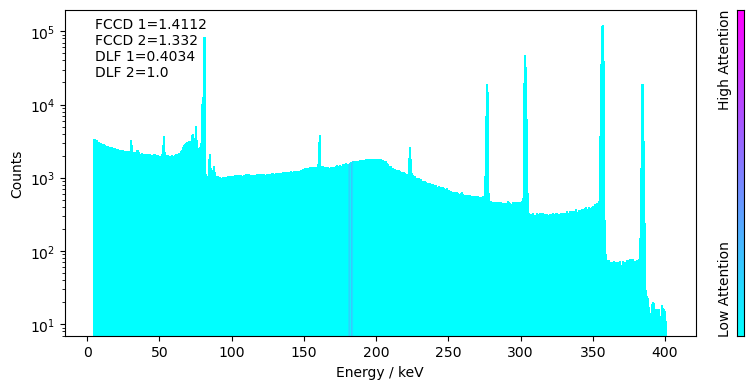

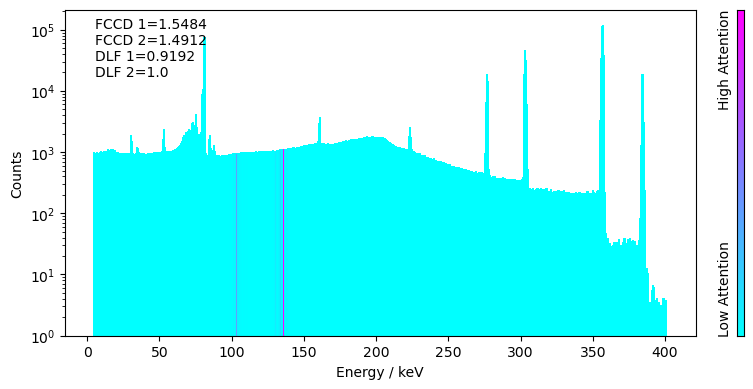

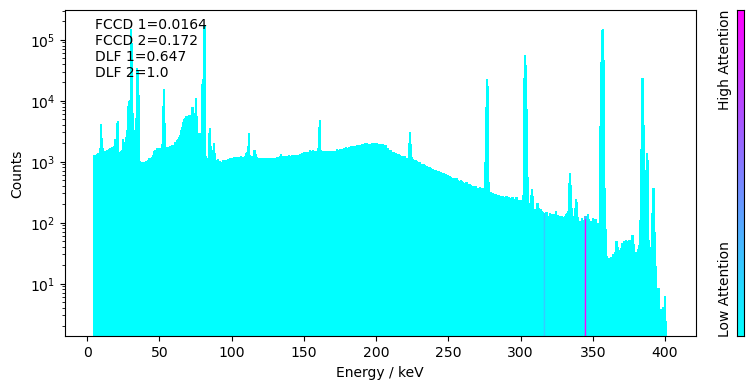

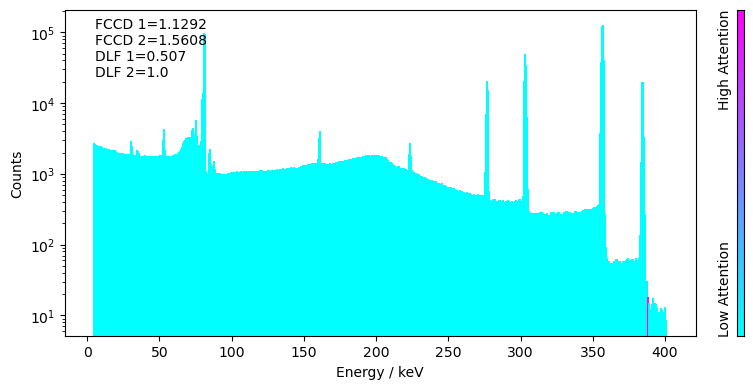

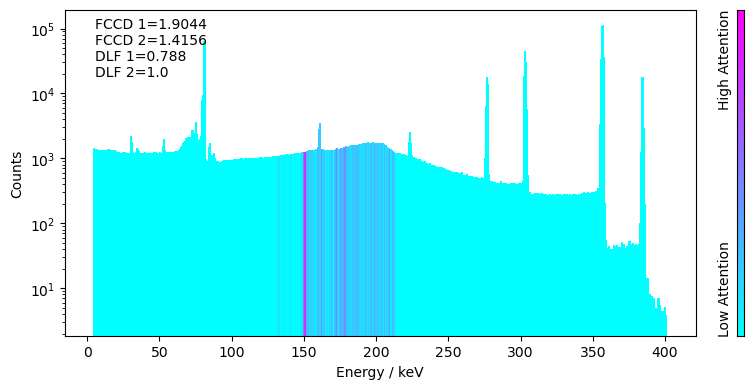

...

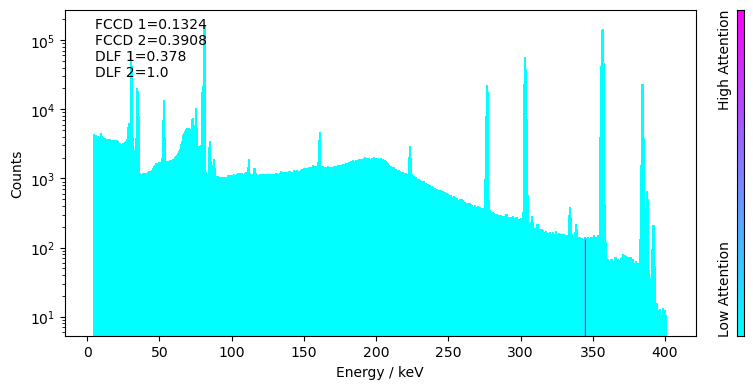

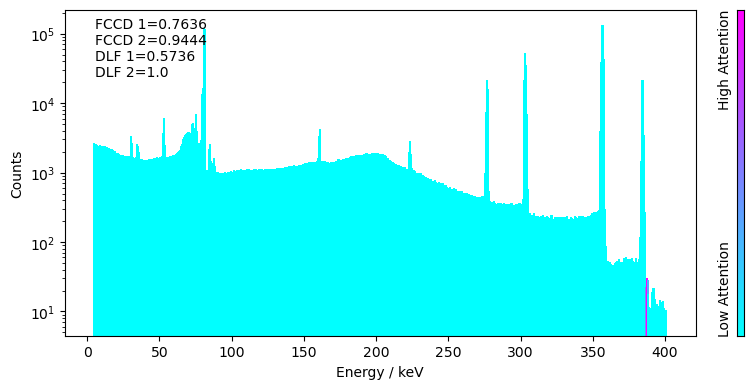

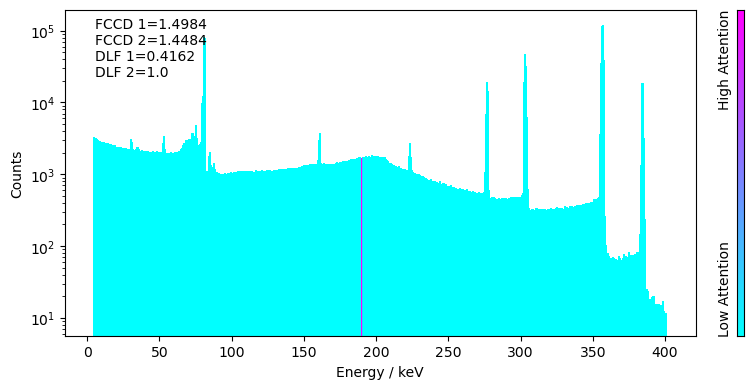

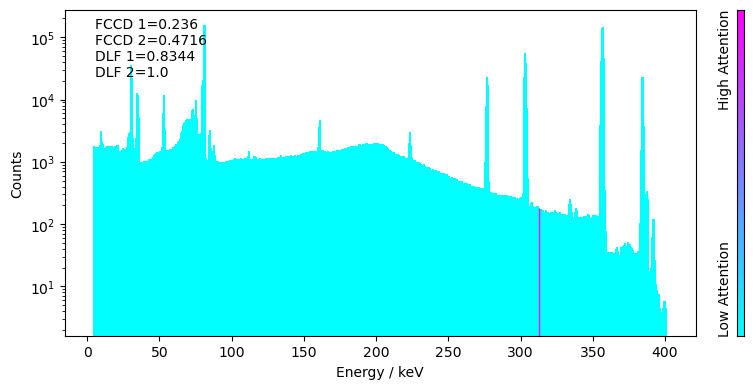

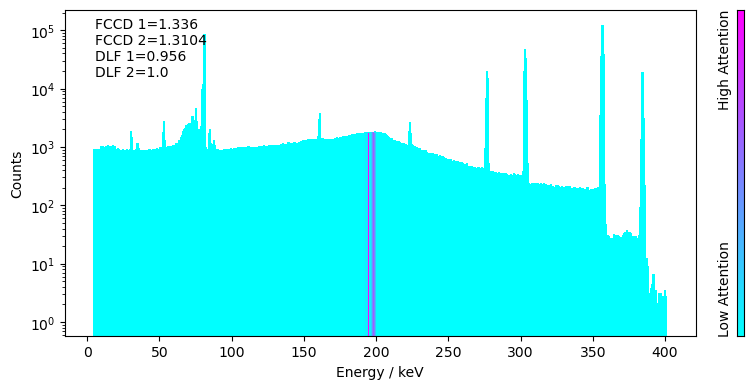

In [20]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.08it/s]


saved average attention to csv file


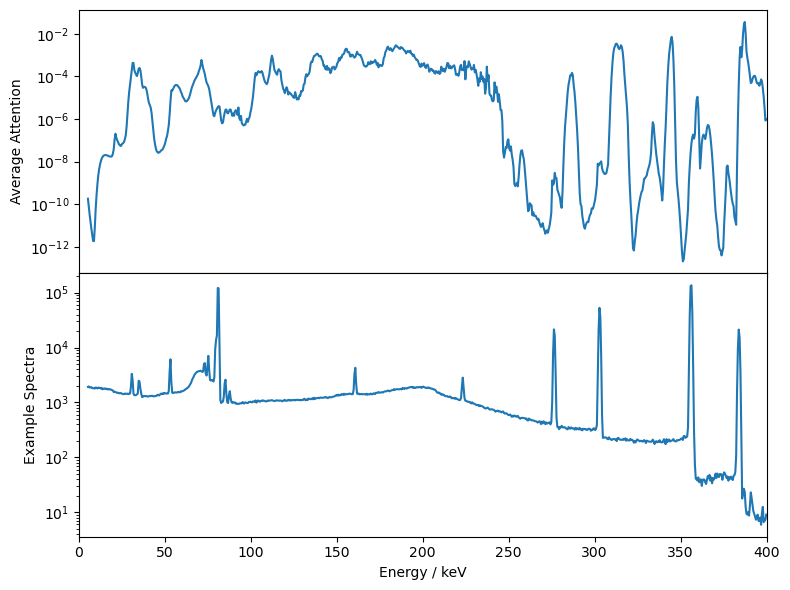

In [21]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True, maxE=400)


## Testing - on full dataset

In [22]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:26<00:00, 185.29it/s]


(4908, 790)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.38it/s]


FCCD accuracies: 
total:  3000
TP:  1441
FP:  8
TN:  1522
FN:  29
accuracy:  0.9876666666666667
precision:  0.9944789510006902
recall:  0.9802721088435374

DLF accuracies: 
accuracy_DLF:  0.9733333333333334

roc auc FCCD:  0.999338846649771

Total # misclassified trials FCCD:  37  / 3000
Total # misclassified trials DLF:  80  / 3000


{'accuracy_FCCD': 0.9876666666666667,
 'precision_FCCD': 0.9944789510006902,
 'recall_FCCD': 0.9802721088435374,
 'accuracy_DLF': 0.9733333333333334,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.999338846649771,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.03146910969291735,
  'RMSE_DLFmisclassified_FCCD': 1.196765285258559,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 37,
  'NoMisclassifiedDLF': 80}}

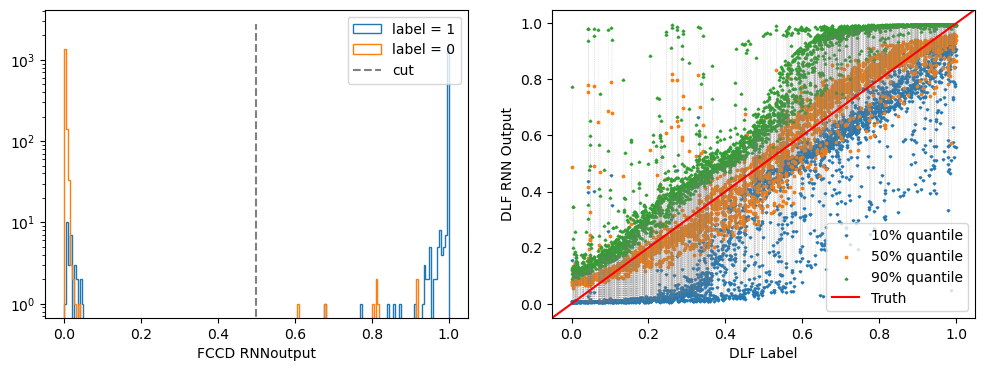

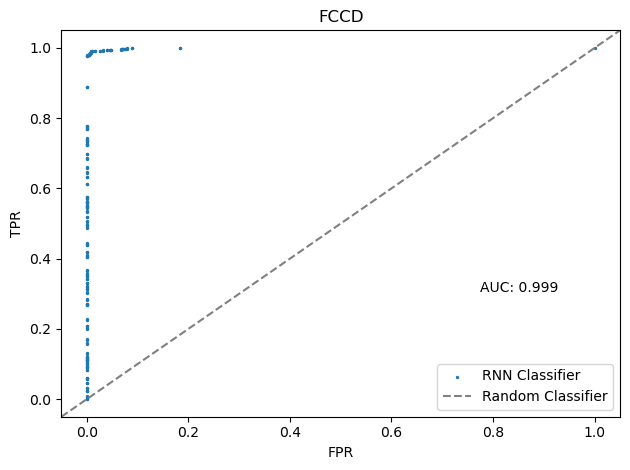

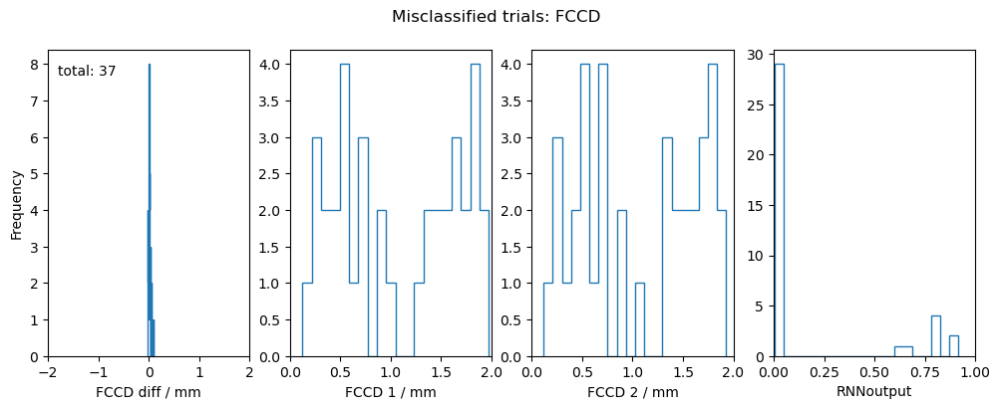

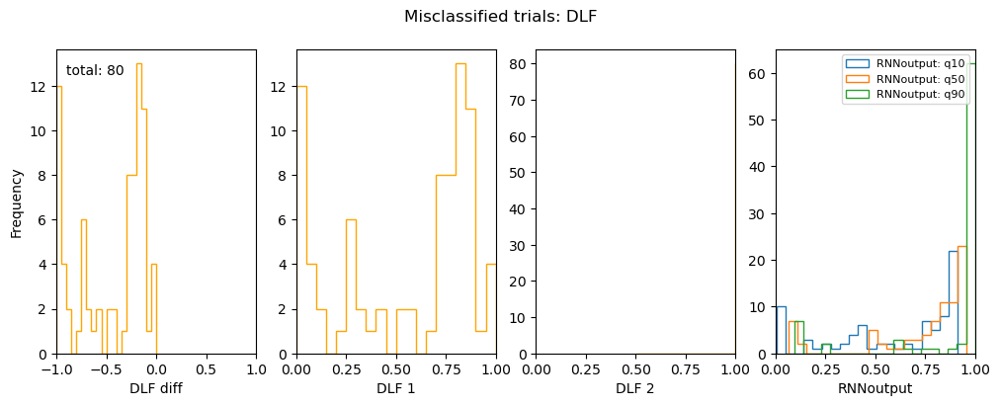

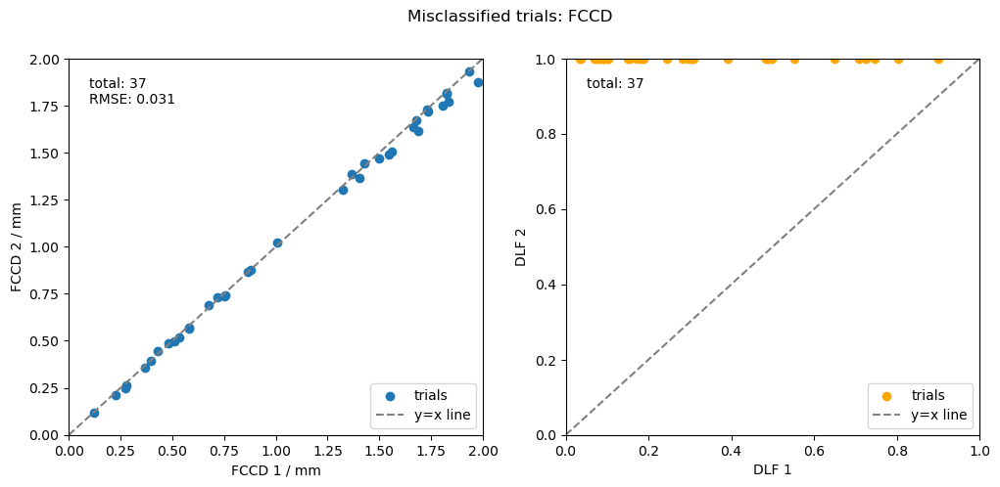

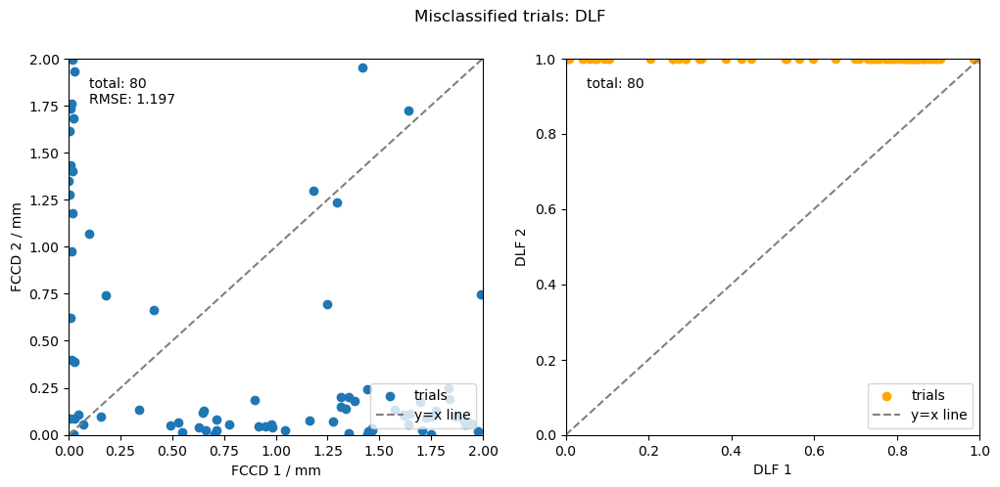

In [23]:
test_RNN(RNNclassifier_maxFCCDdiff0_5mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

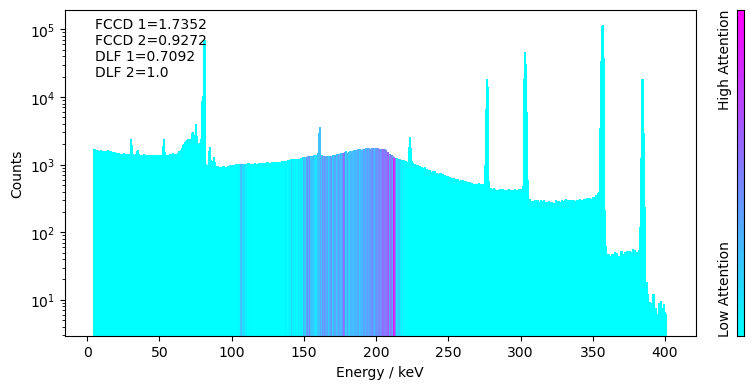

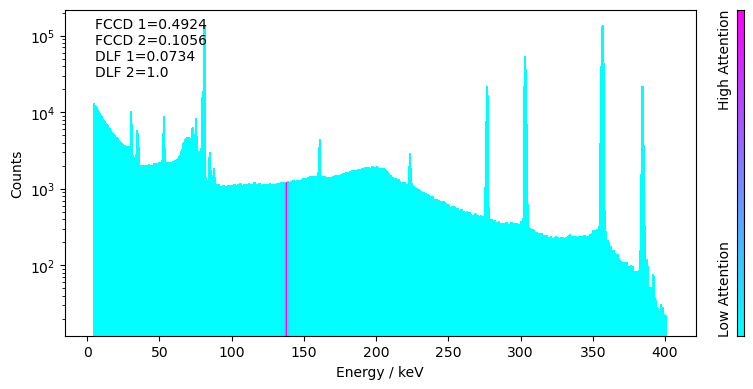

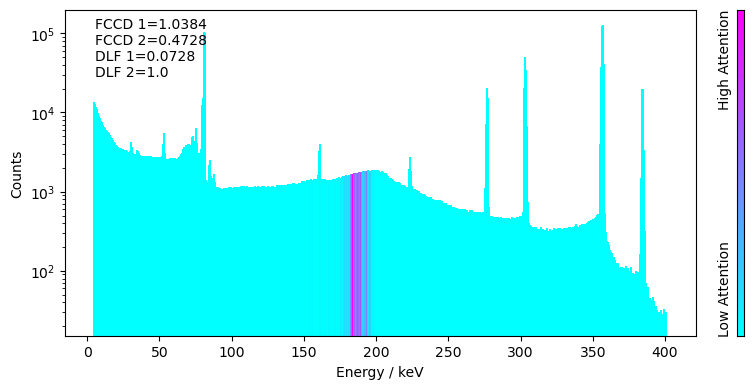

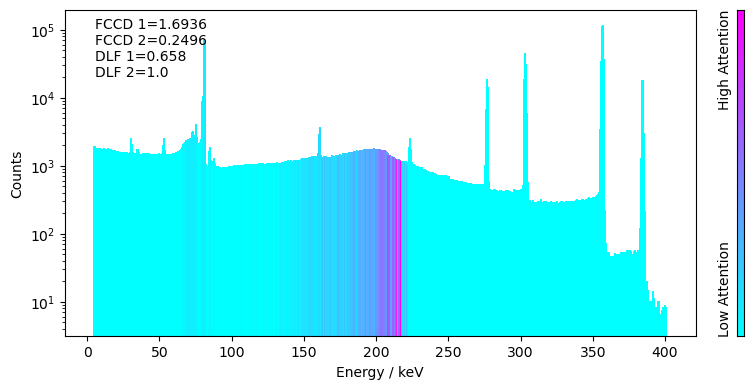

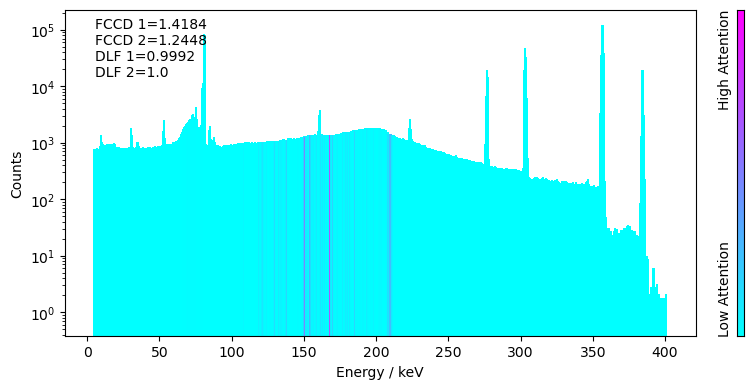

...

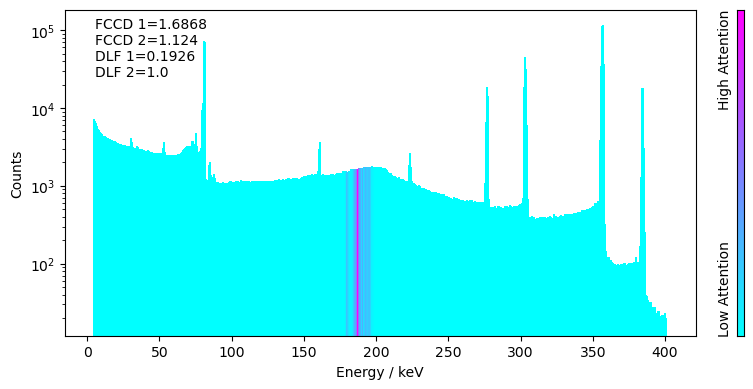

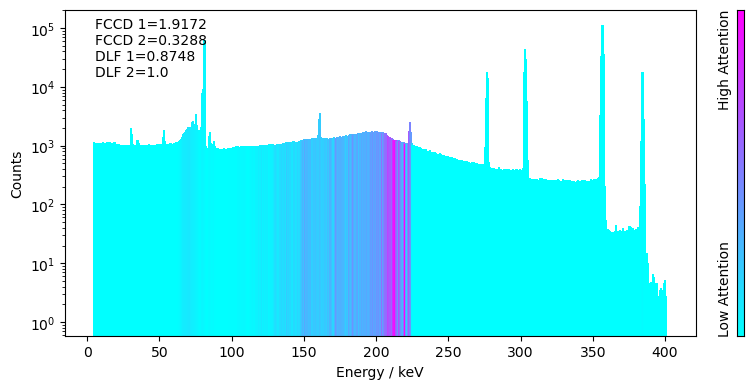

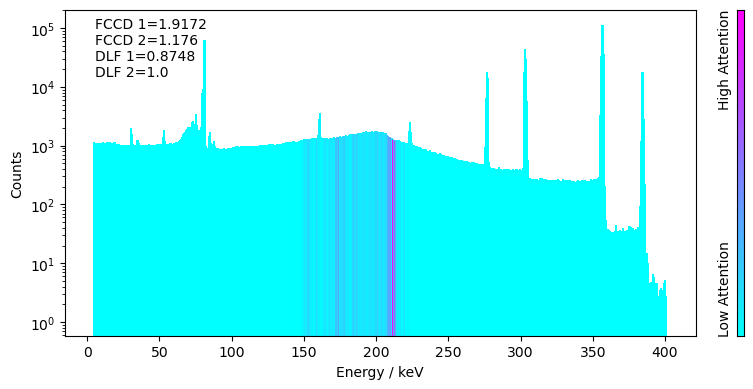

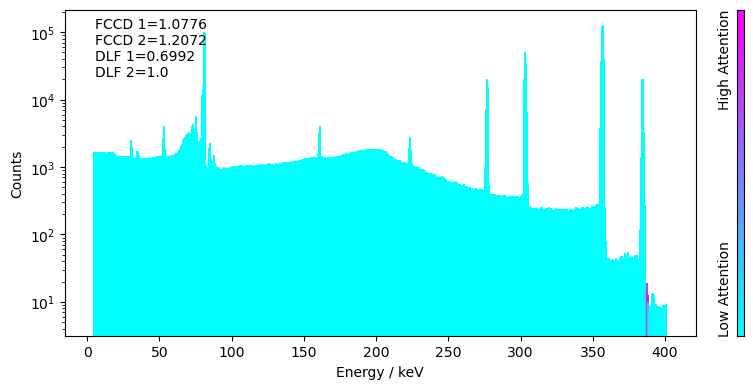

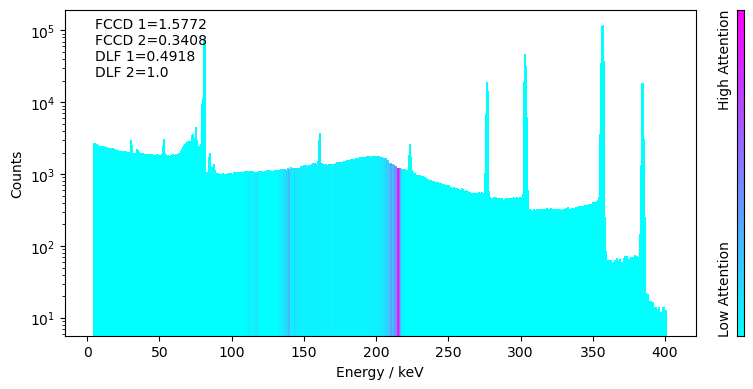

In [24]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:04<00:00, 11.62it/s]


saved average attention to csv file


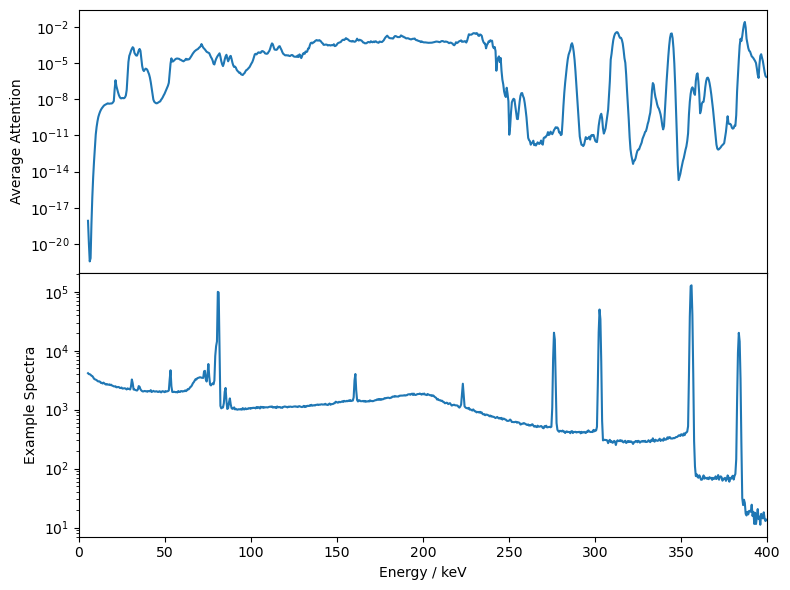

In [25]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True, maxE=400)


# TRAINING 3: restircted dataset - Max FCCD diff = 0.25 mm

In [26]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.25
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_maxE400_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxFCCDdiff=0.25mm

In [27]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:23<00:00, 210.95it/s]


(4908, 790)


In [28]:
# Load saved model
RNNclassifier_maxFCCDdiff0_25mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_25mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_25mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.97it/s]


FCCD accuracies: 
total:  3000
TP:  1461
FP:  24
TN:  1485
FN:  30
accuracy:  0.982
precision:  0.9838383838383838
recall:  0.9798792756539235

DLF accuracies: 
accuracy_DLF:  0.98

roc auc FCCD:  0.9981132654108882

Total # misclassified trials FCCD:  54  / 3000
Total # misclassified trials DLF:  60  / 3000


{'accuracy_FCCD': 0.982,
 'precision_FCCD': 0.9838383838383838,
 'recall_FCCD': 0.9798792756539235,
 'accuracy_DLF': 0.98,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9981132654108882,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.03247636177397453,
  'RMSE_DLFmisclassified_FCCD': 0.12449077074225222,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 54,
  'NoMisclassifiedDLF': 60}}

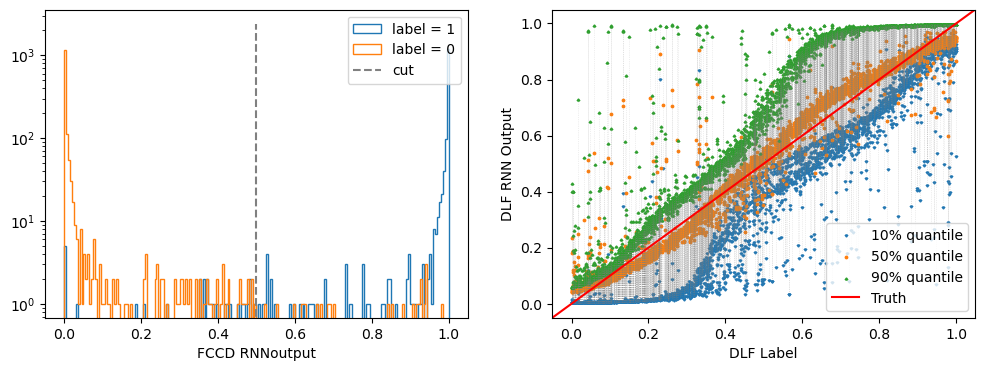

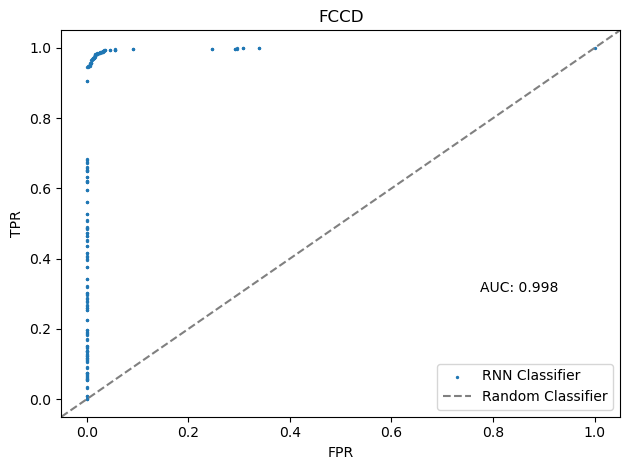

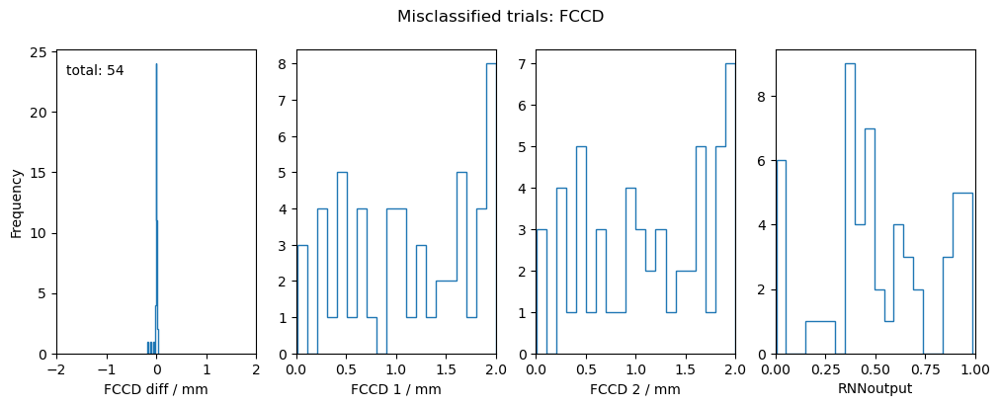

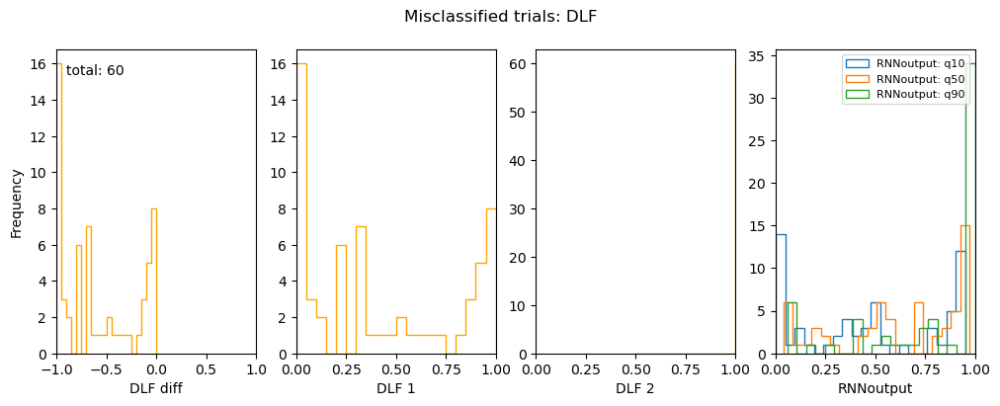

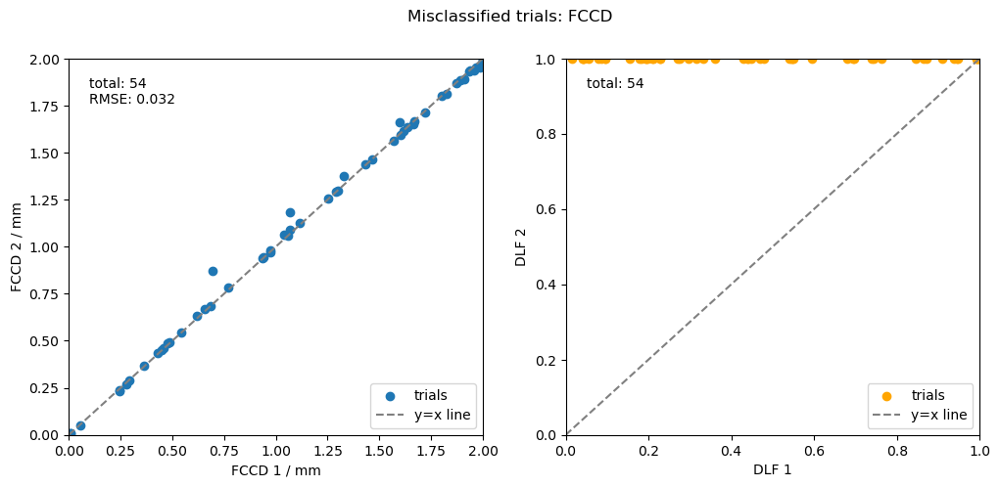

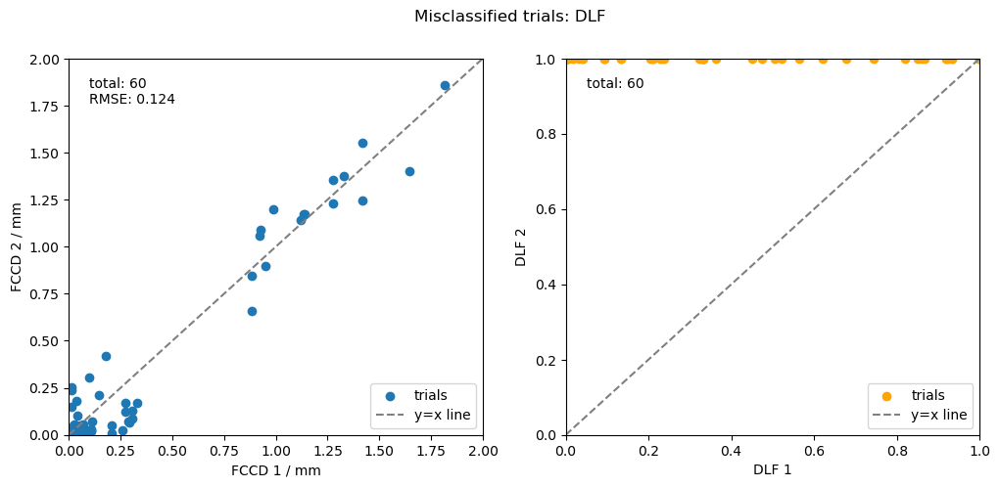

In [29]:
test_RNN(RNNclassifier_maxFCCDdiff0_25mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

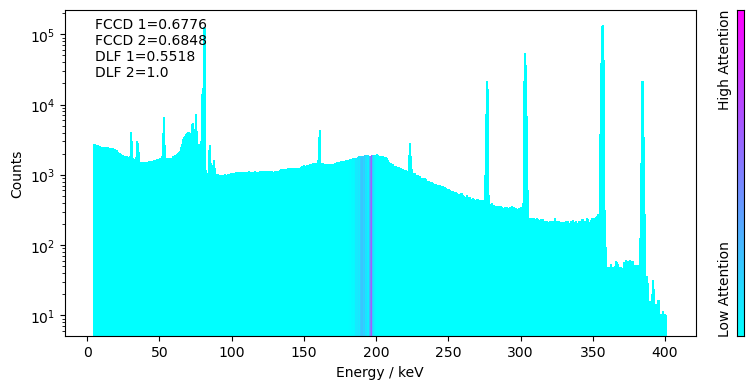

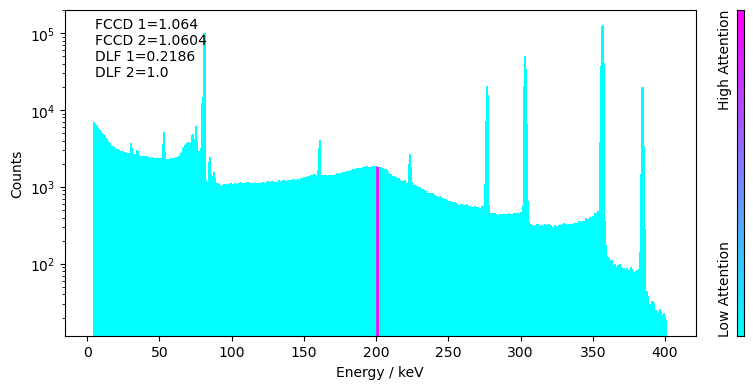

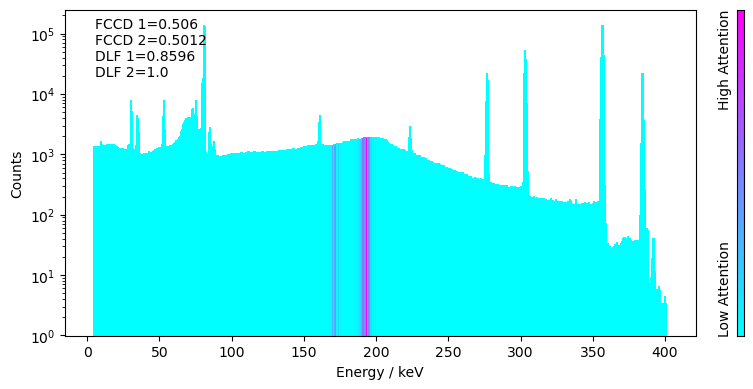

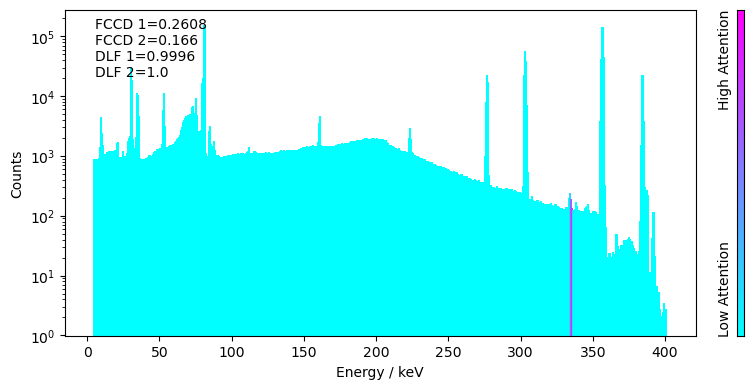

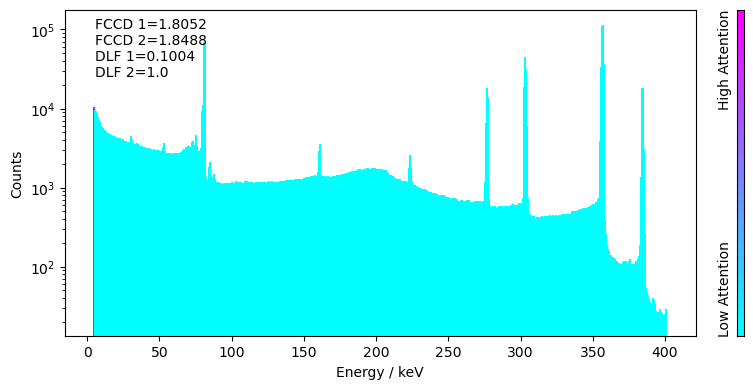

...

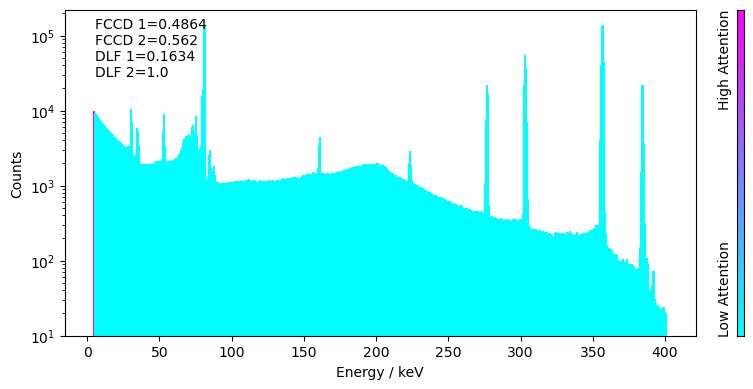

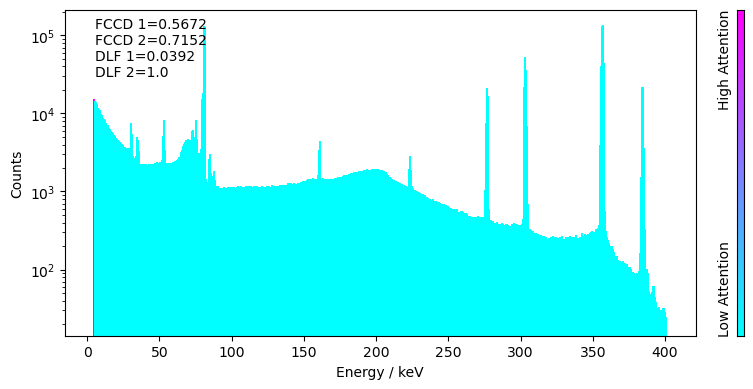

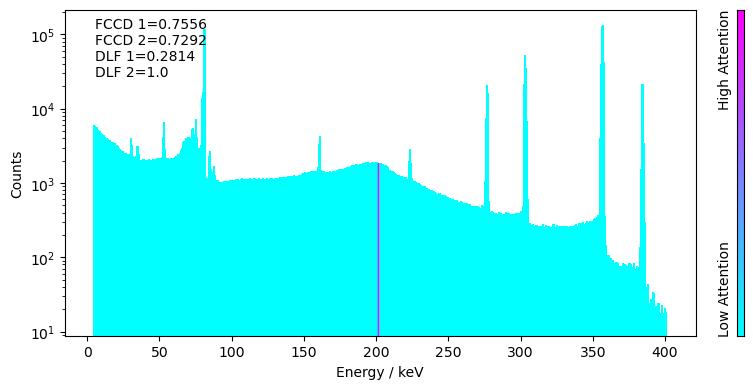

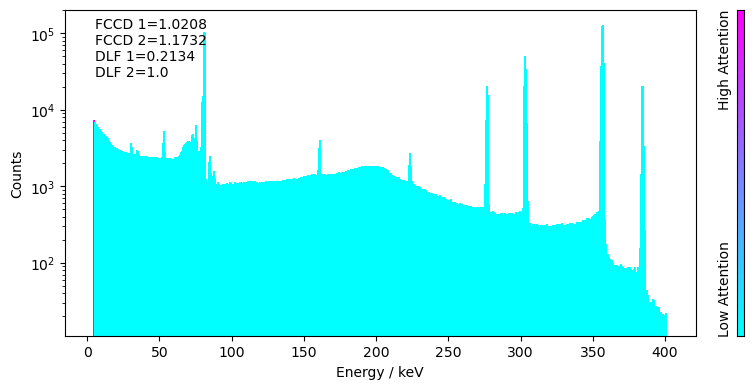

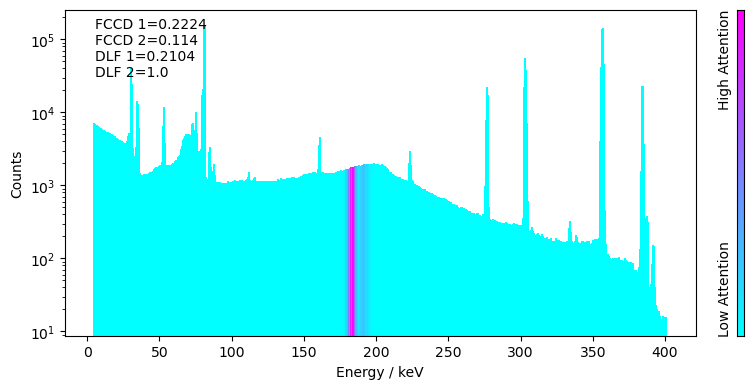

In [30]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, maxE=400)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.05it/s]


saved average attention to csv file


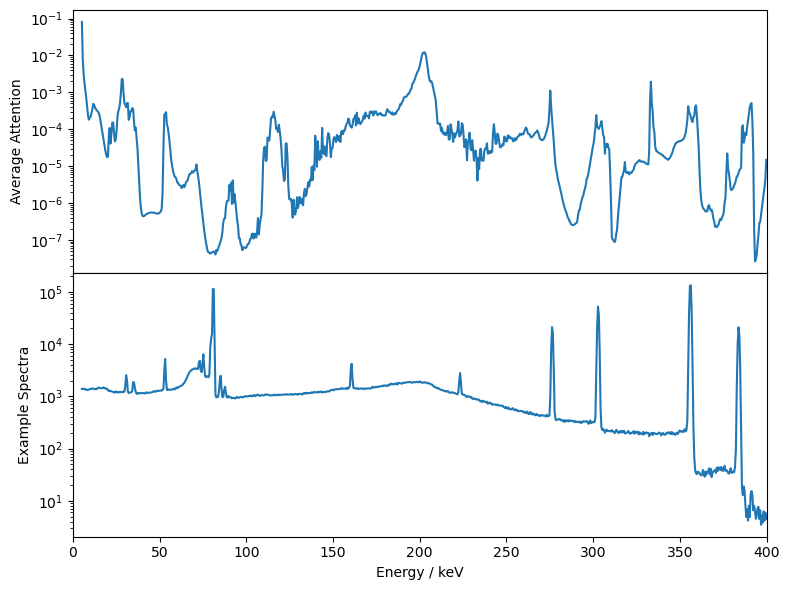

In [31]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True, maxE=400)

## Testing - on full dataset

In [32]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:23<00:00, 204.76it/s]


(4908, 790)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.45it/s]


FCCD accuracies: 
total:  3000
TP:  1466
FP:  350
TN:  1180
FN:  4
accuracy:  0.882
precision:  0.8072687224669604
recall:  0.9972789115646259

DLF accuracies: 
accuracy_DLF:  0.9133333333333333

roc auc FCCD:  0.9482306255835669

Total # misclassified trials FCCD:  354  / 3000
Total # misclassified trials DLF:  260  / 3000


{'accuracy_FCCD': 0.882,
 'precision_FCCD': 0.8072687224669604,
 'recall_FCCD': 0.9972789115646259,
 'accuracy_DLF': 0.9133333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9482306255835669,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.0497001280699438,
  'RMSE_DLFmisclassified_FCCD': 1.1728077413429048,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 354,
  'NoMisclassifiedDLF': 260}}

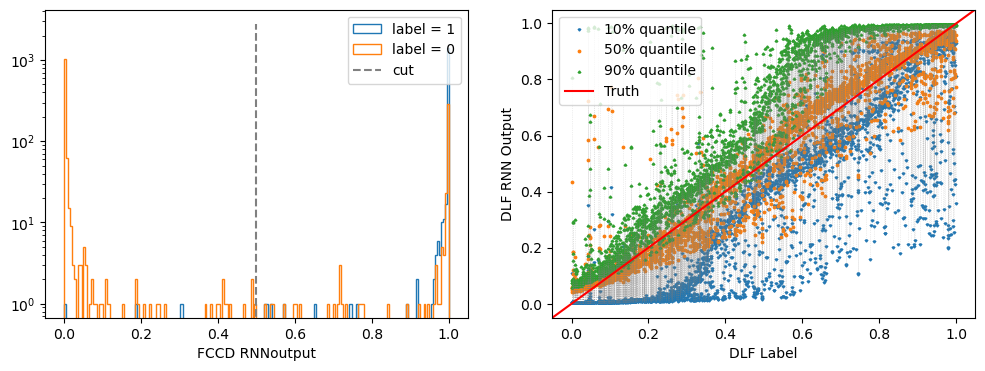

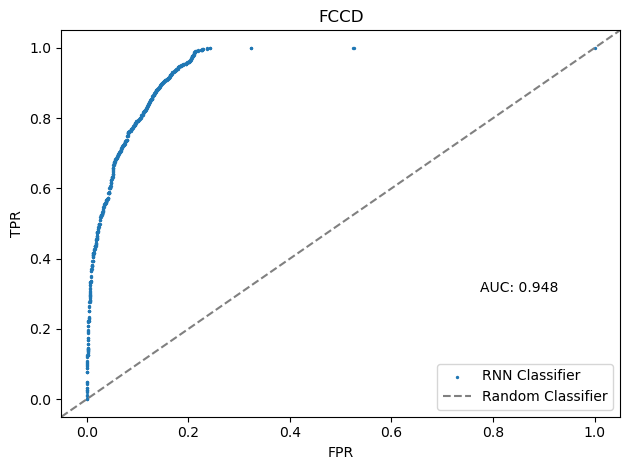

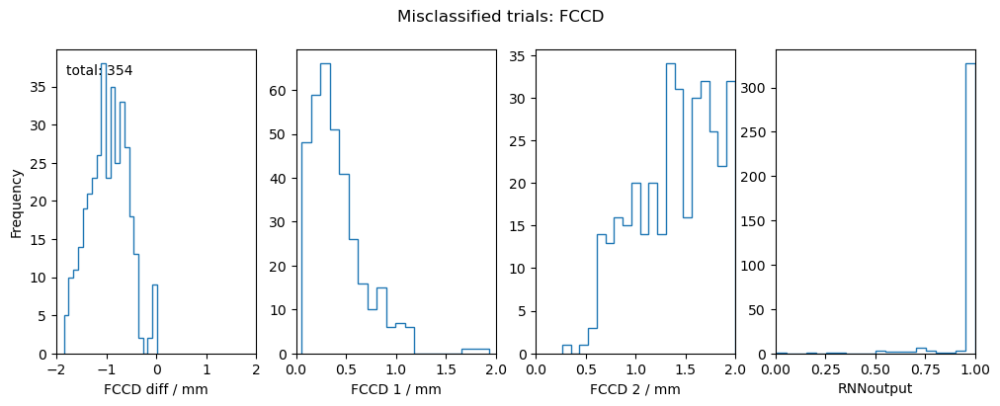

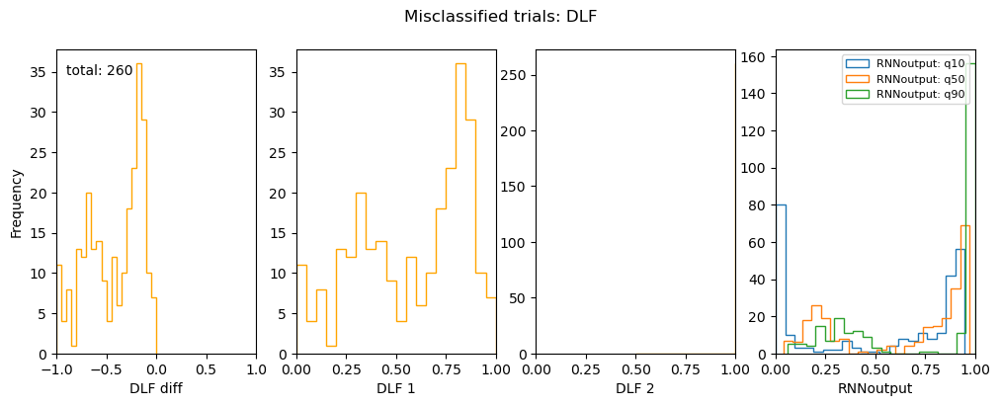

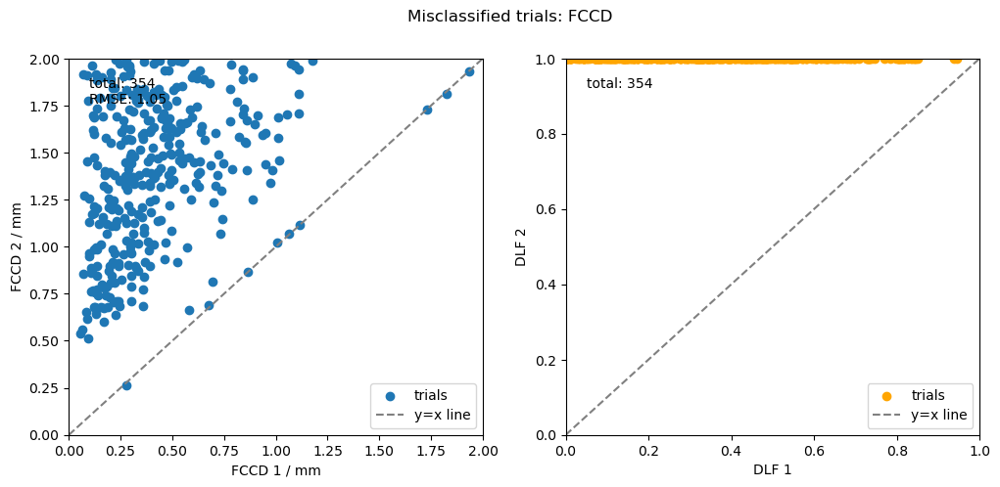

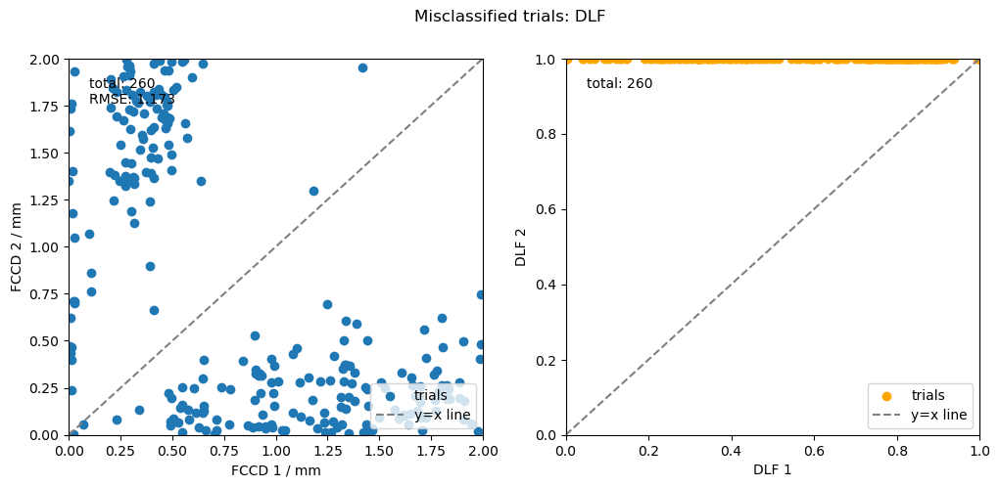

In [33]:
test_RNN(RNNclassifier_maxFCCDdiff0_25mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

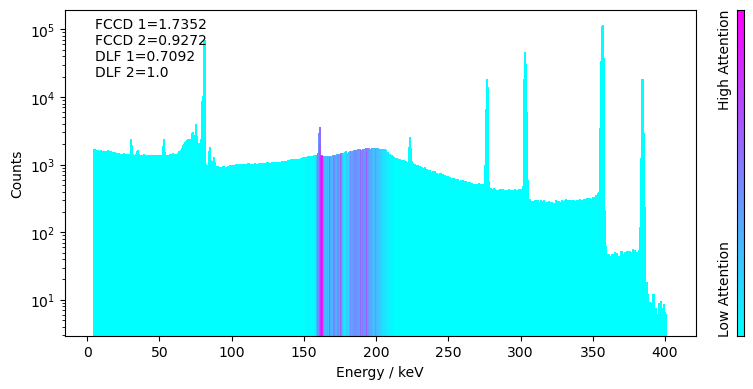

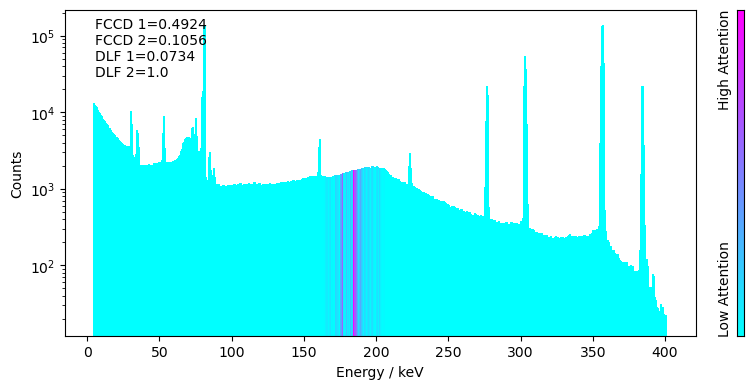

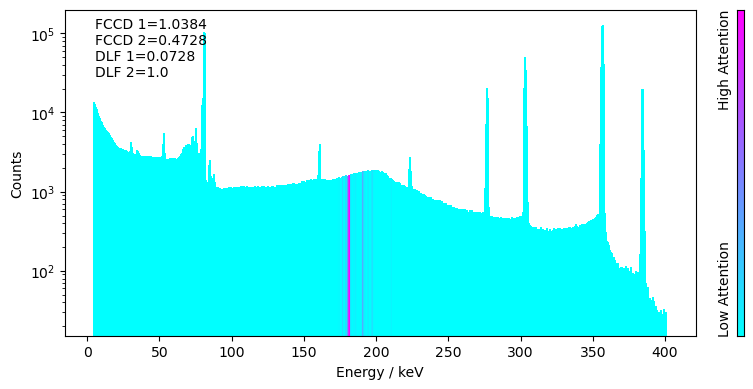

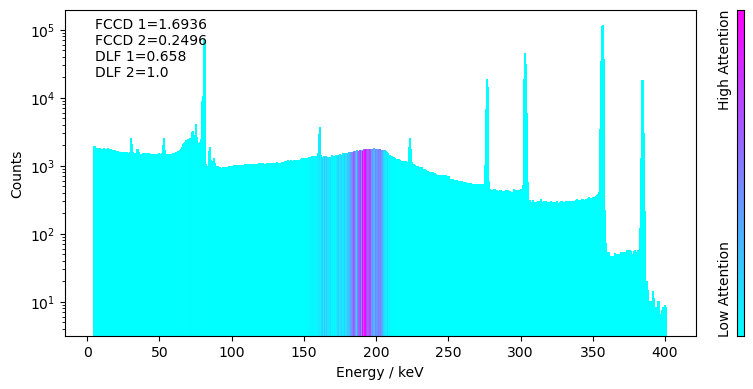

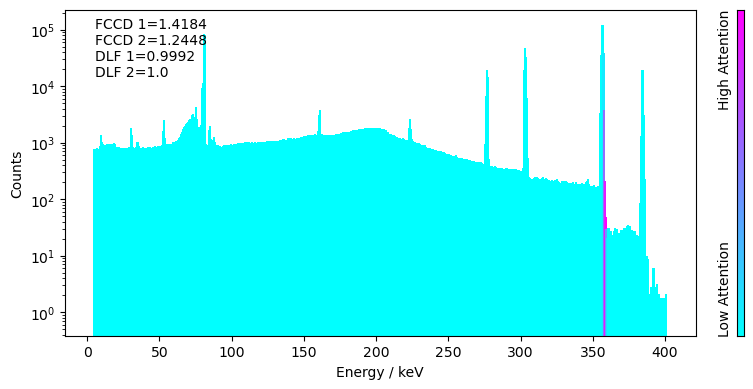

...

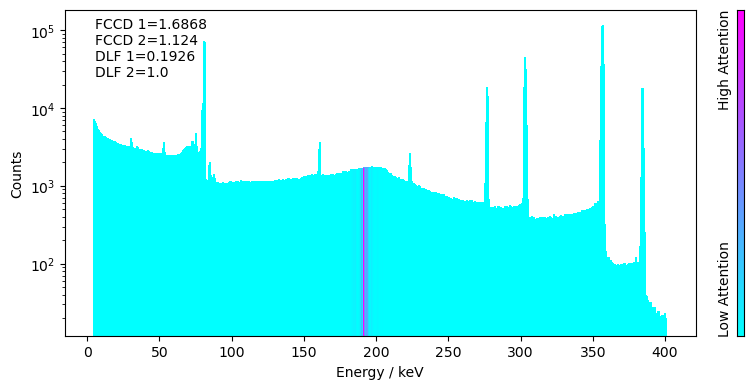

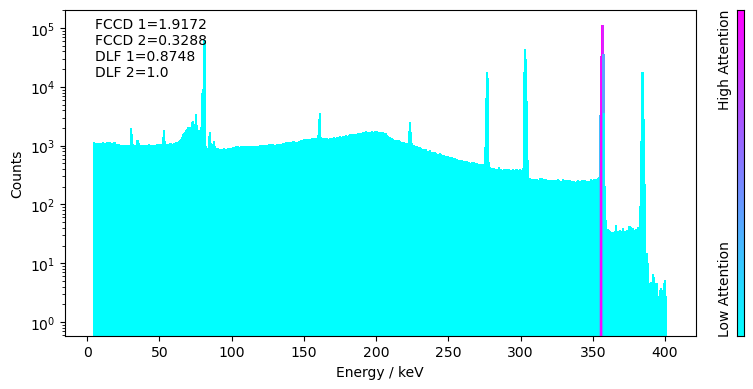

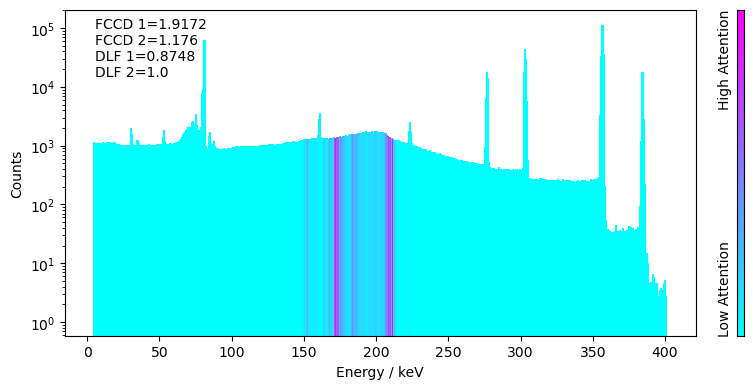

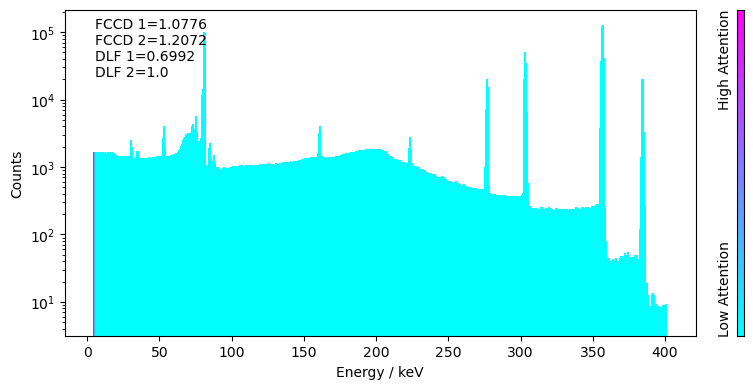

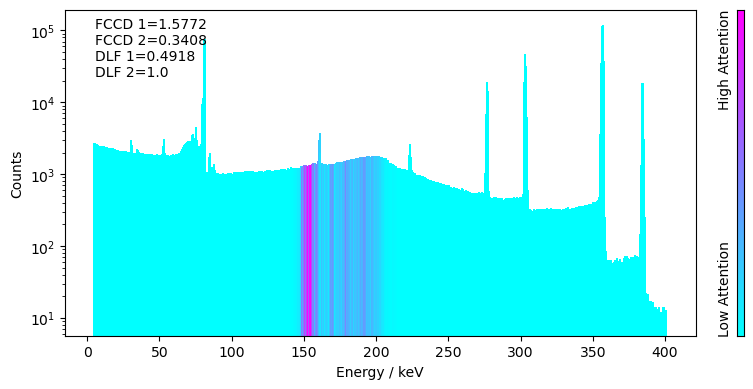

In [34]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.48it/s]


saved average attention to csv file


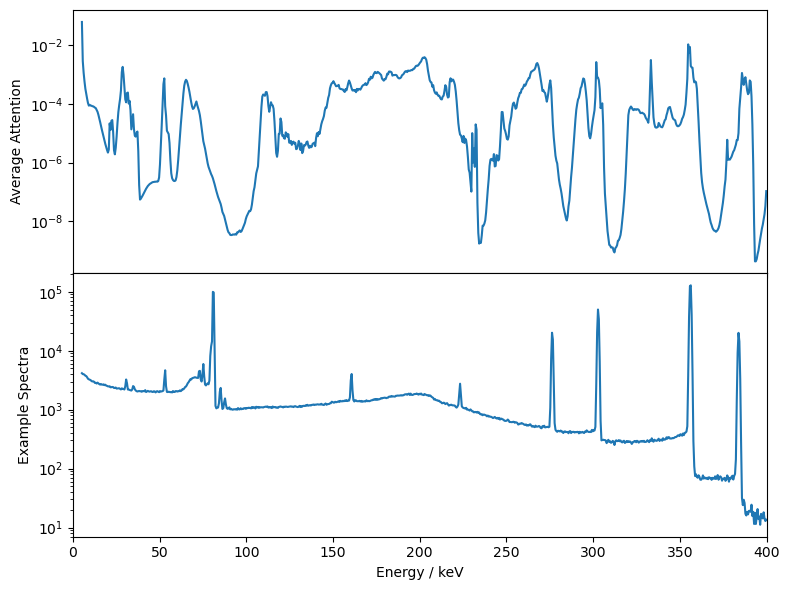

In [35]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True, maxE=400)

# TRAINING 4: restircted dataset - Max FCCD diff = 0.1 mm

In [36]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.1
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_maxE400_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff = 0.1 mm

In [37]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)


100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:25<00:00, 193.04it/s]

(4908, 790)


In [38]:
# Load saved model
RNNclassifier_maxFCCDdiff0_1mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_1mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_1mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.39it/s]


FCCD accuracies: 
total:  3000
TP:  1502
FP:  138
TN:  1337
FN:  23
accuracy:  0.9463333333333334
precision:  0.9158536585365854
recall:  0.9849180327868853

DLF accuracies: 
accuracy_DLF:  0.987

roc auc FCCD:  0.9939071964434566

Total # misclassified trials FCCD:  161  / 3000
Total # misclassified trials DLF:  39  / 3000


{'accuracy_FCCD': 0.9463333333333334,
 'precision_FCCD': 0.9158536585365854,
 'recall_FCCD': 0.9849180327868853,
 'accuracy_DLF': 0.987,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9939071964434566,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.025050805518842253,
  'RMSE_DLFmisclassified_FCCD': 0.05219262154356442,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 161,
  'NoMisclassifiedDLF': 39}}

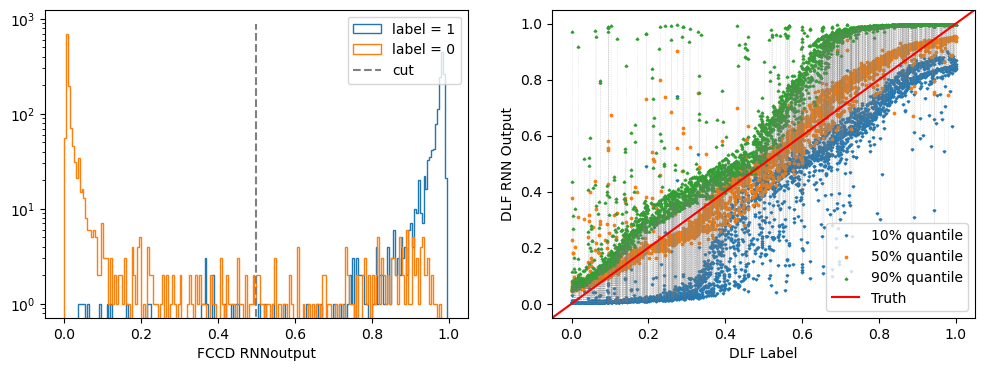

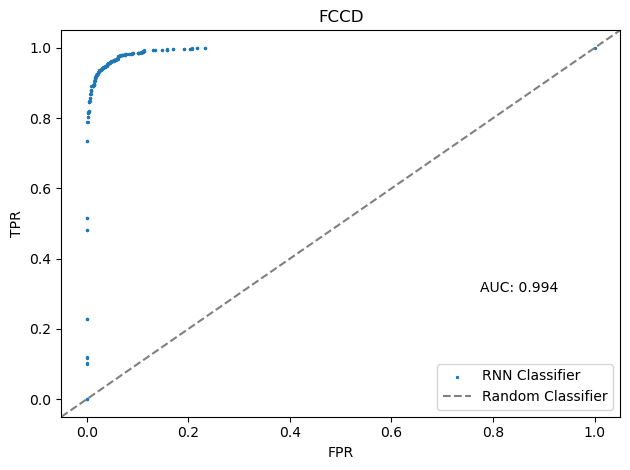

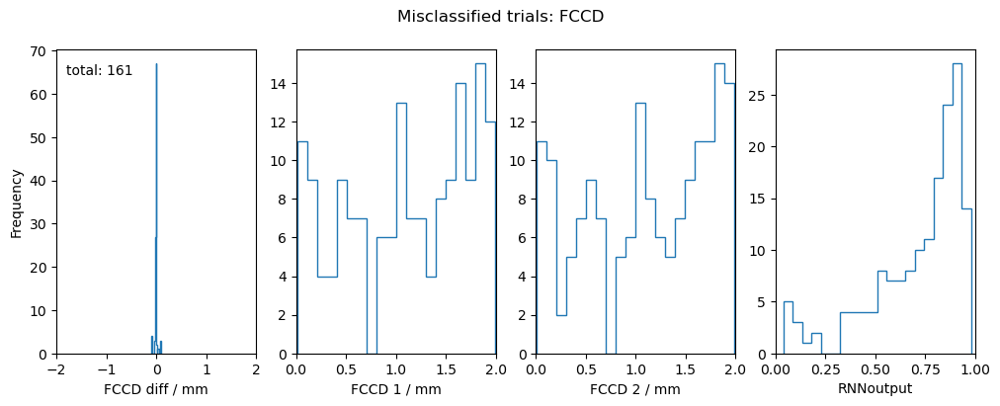

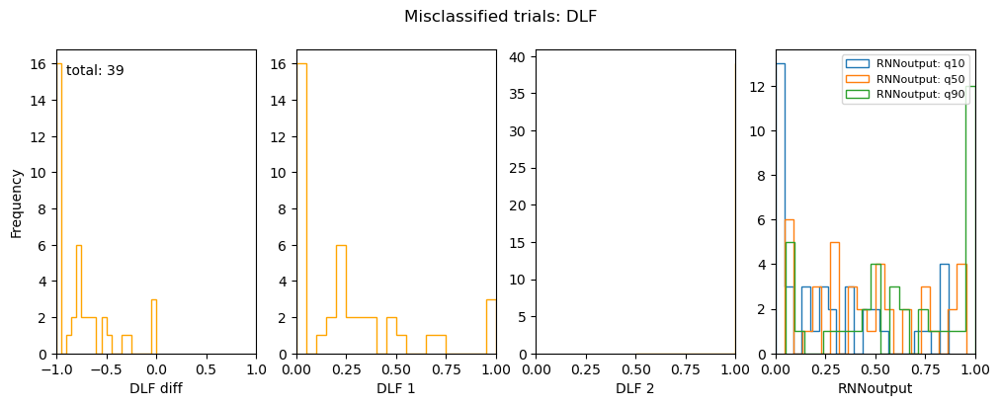

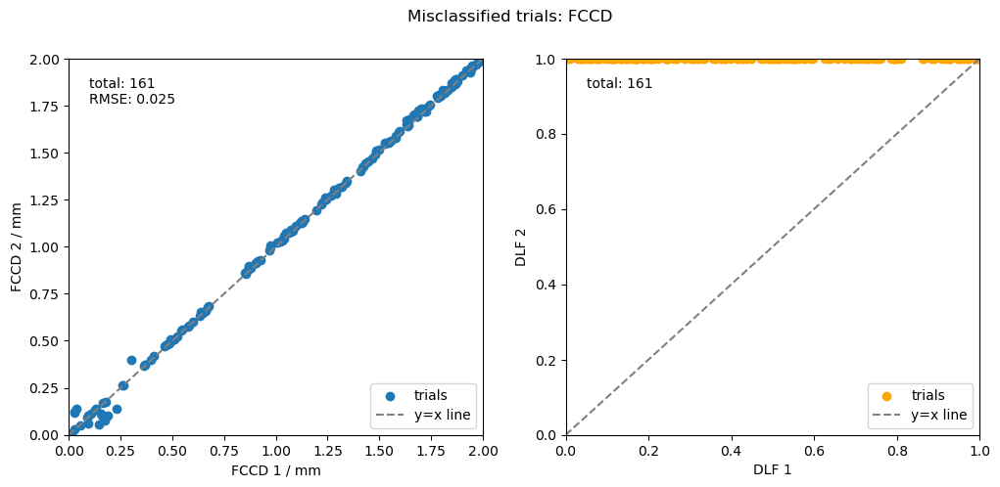

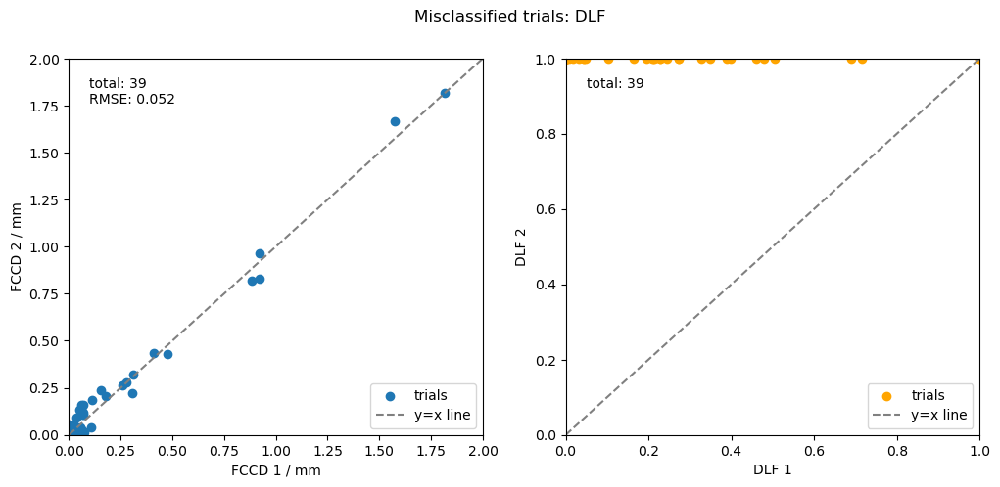

In [39]:
test_RNN(RNNclassifier_maxFCCDdiff0_1mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

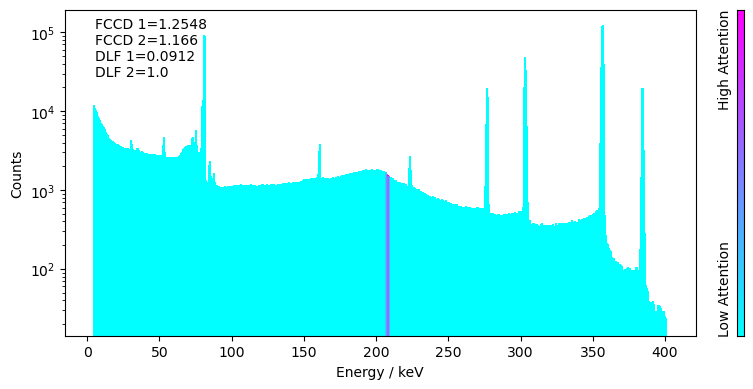

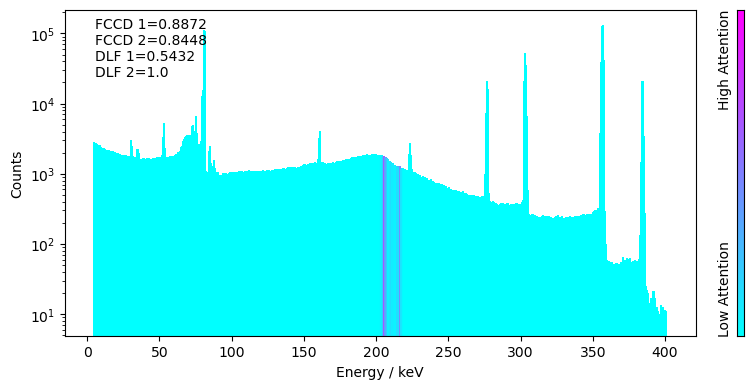

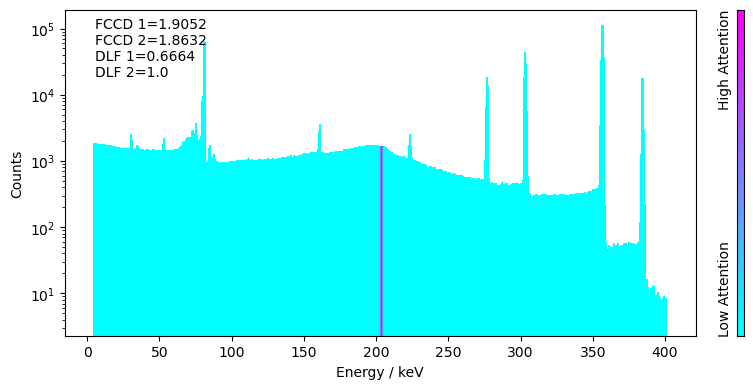

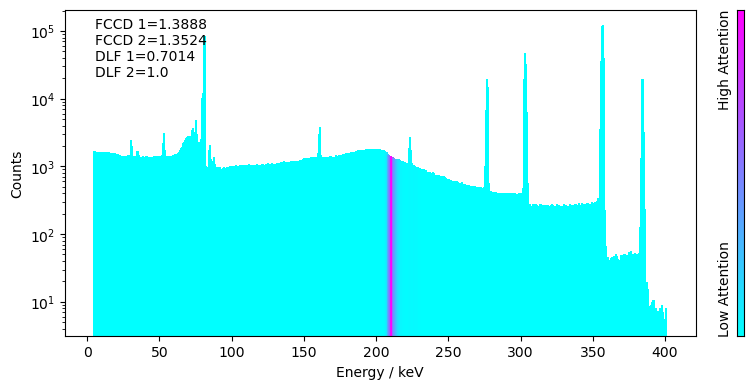

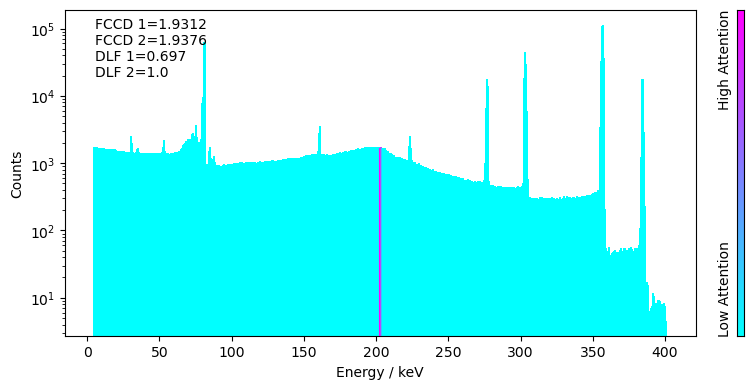

...

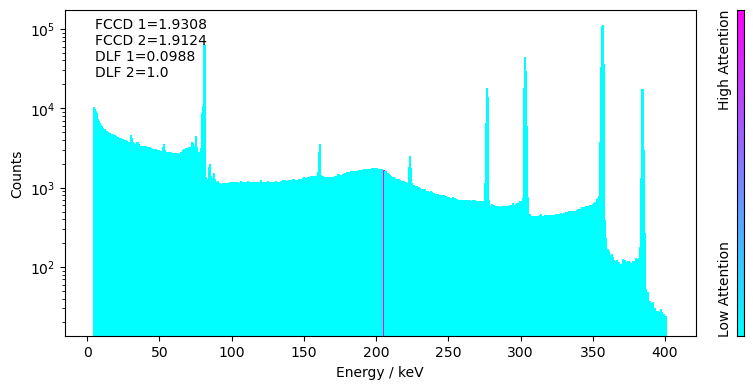

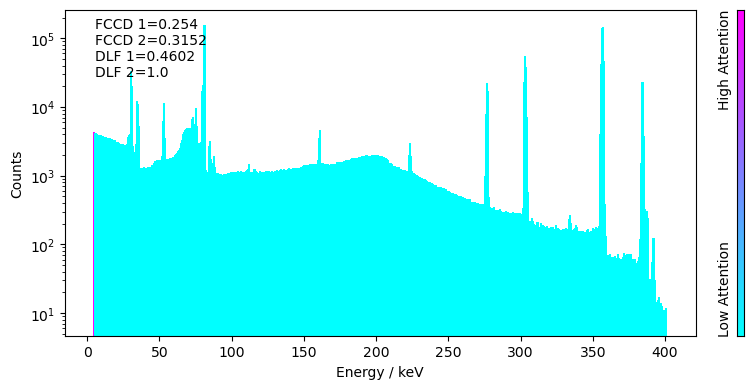

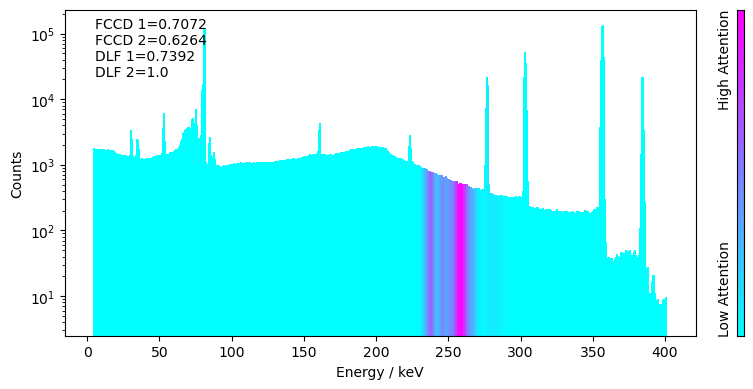

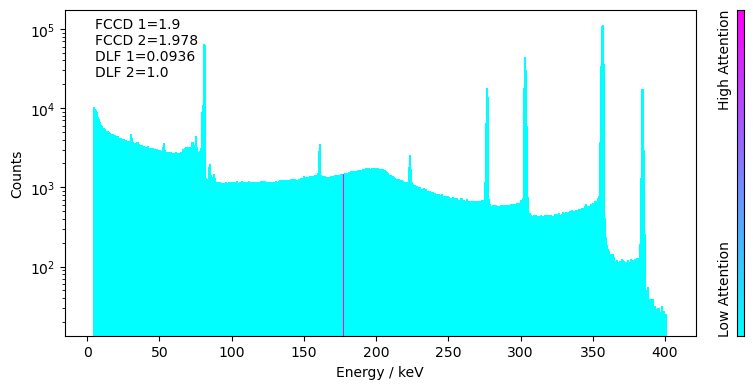

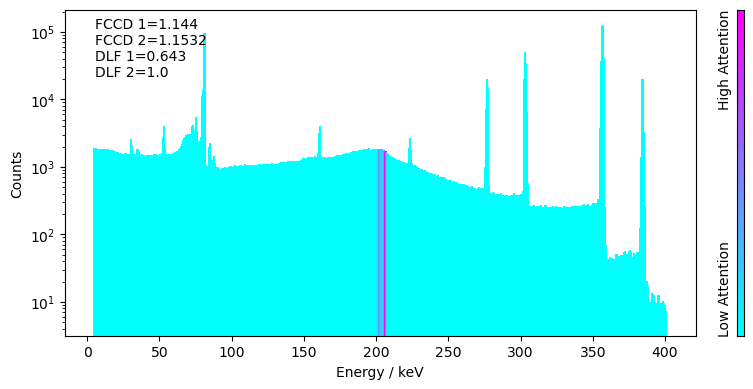

In [40]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, maxE=400)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.44it/s]


saved average attention to csv file


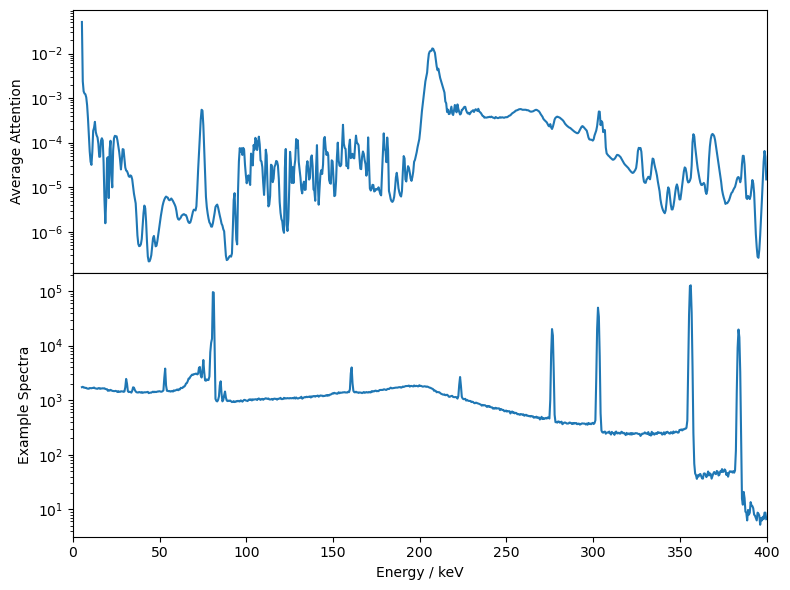

In [41]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True, maxE=400)

## Testing on full dataset

In [42]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 203.49it/s]


(4908, 790)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:04<00:00, 11.67it/s]


FCCD accuracies: 
total:  3000
TP:  1329
FP:  789
TN:  741
FN:  141
accuracy:  0.69
precision:  0.6274787535410765
recall:  0.9040816326530612

DLF accuracies: 
accuracy_DLF:  0.904

roc auc FCCD:  0.7371679783024321

Total # misclassified trials FCCD:  930  / 3000
Total # misclassified trials DLF:  288  / 3000


{'accuracy_FCCD': 0.69,
 'precision_FCCD': 0.6274787535410765,
 'recall_FCCD': 0.9040816326530612,
 'accuracy_DLF': 0.904,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.7371679783024321,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.0775836810955524,
  'RMSE_DLFmisclassified_FCCD': 1.127959683085644,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 930,
  'NoMisclassifiedDLF': 288}}

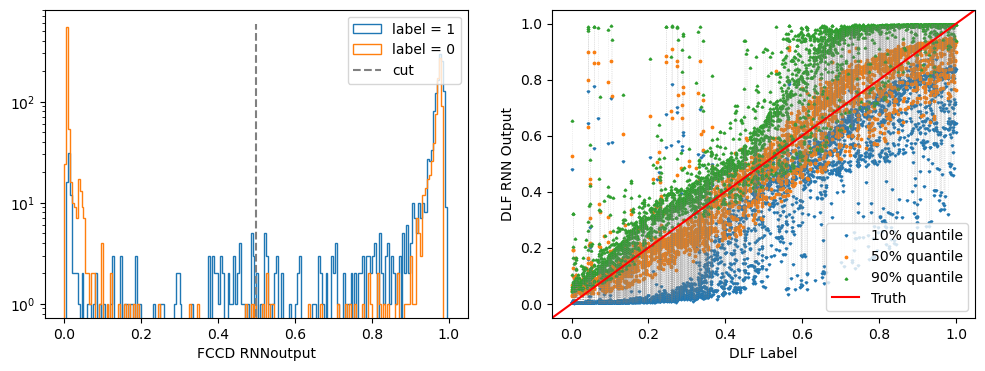

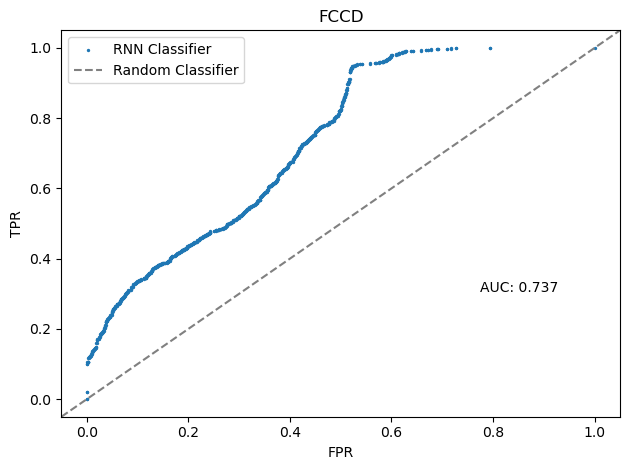

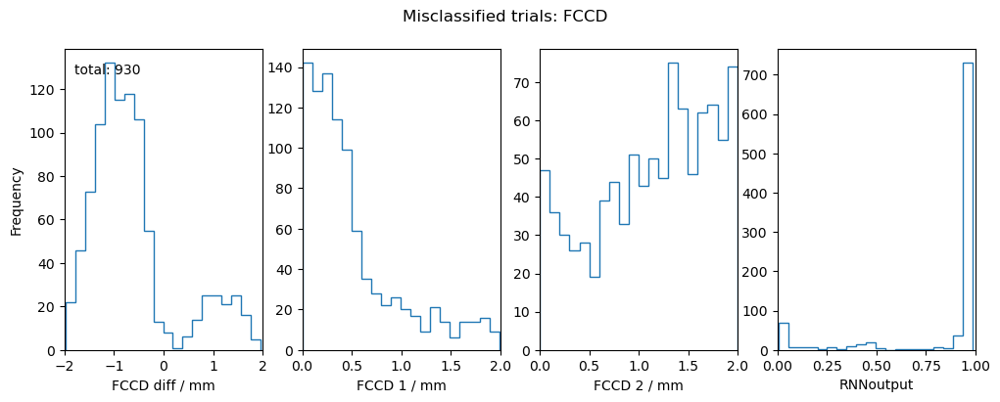

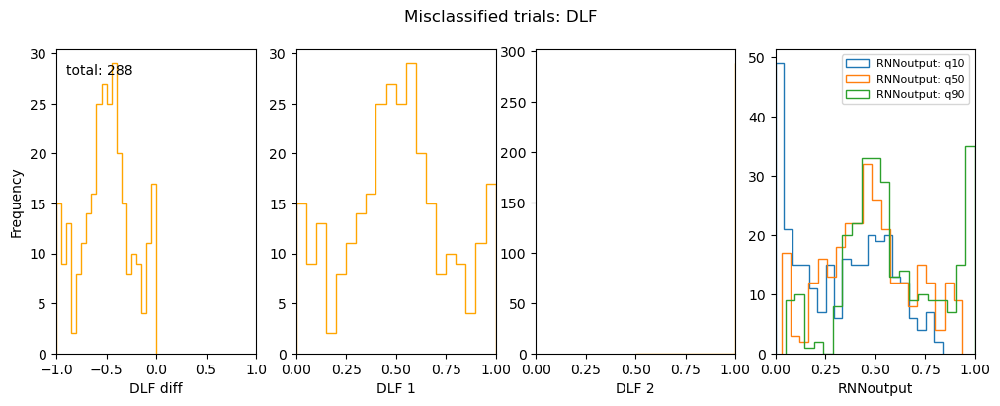

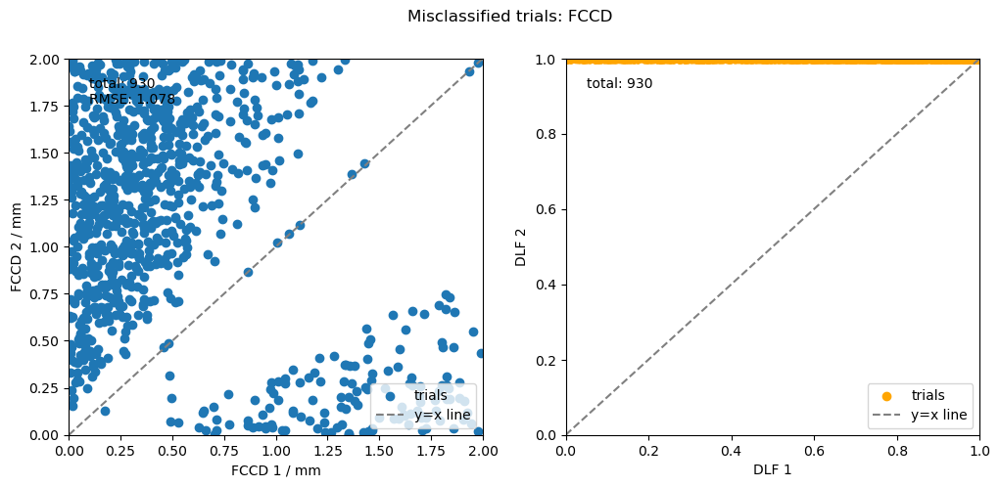

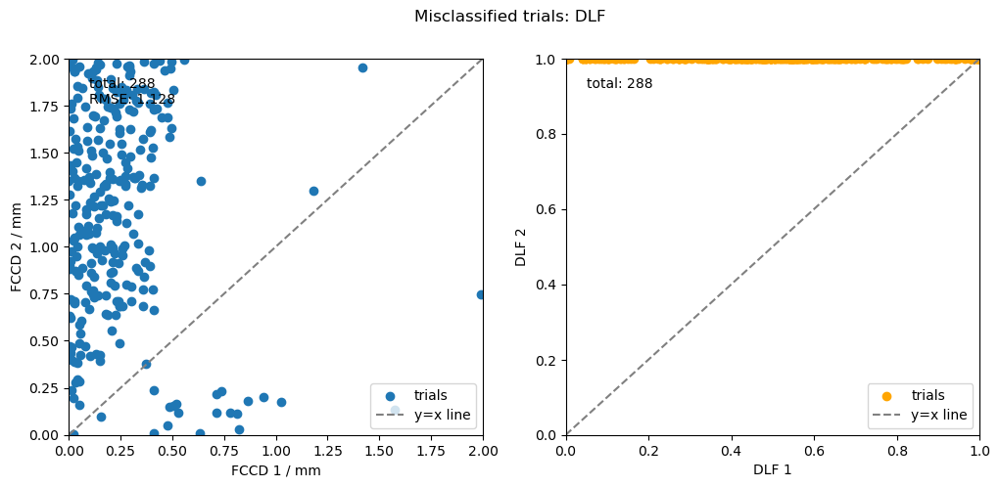

In [43]:
test_RNN(RNNclassifier_maxFCCDdiff0_1mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

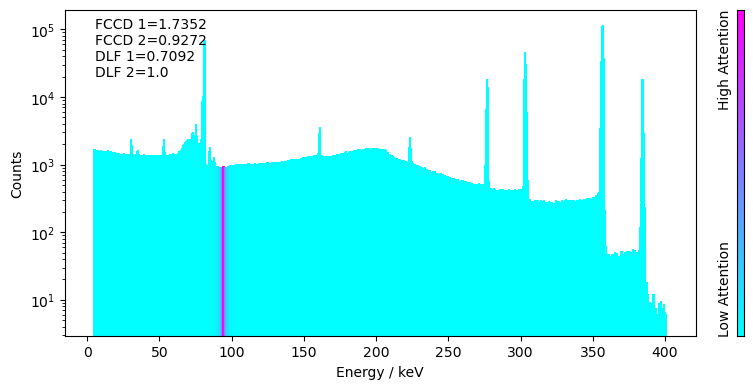

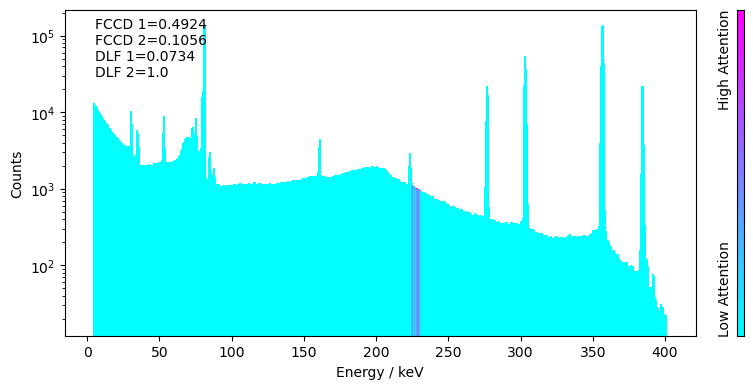

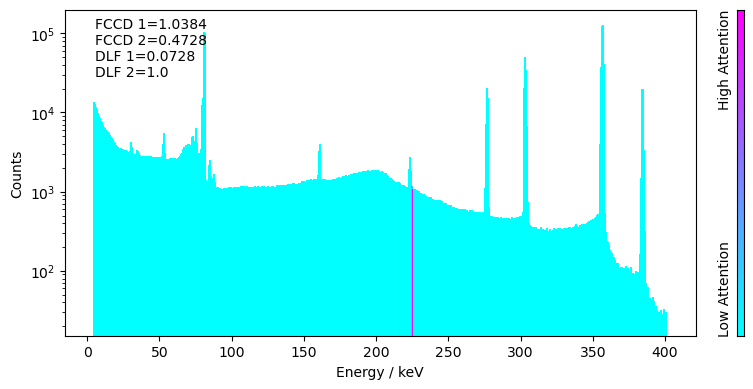

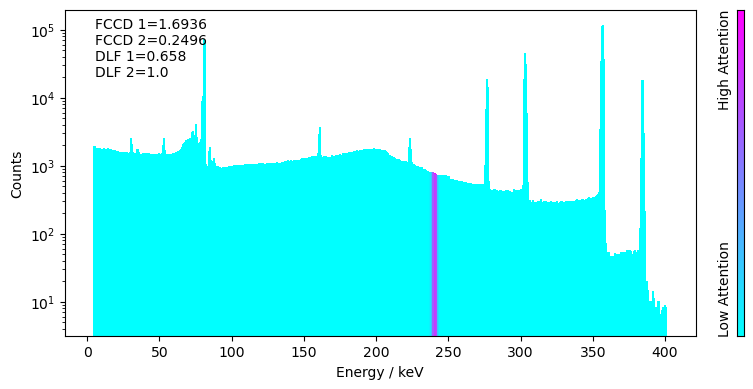

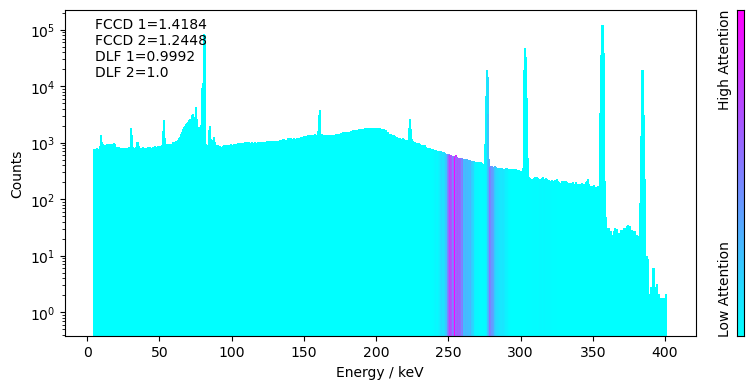

...

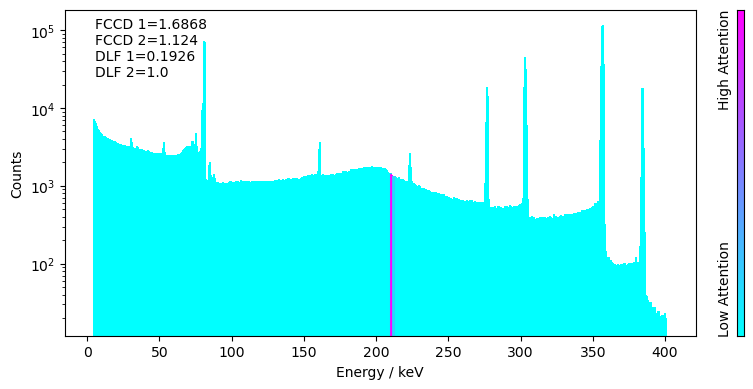

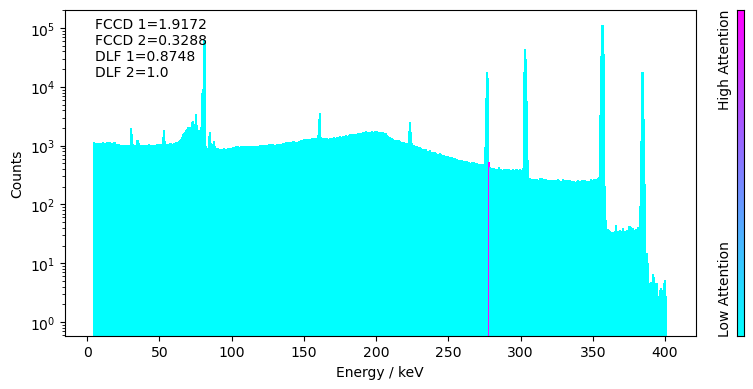

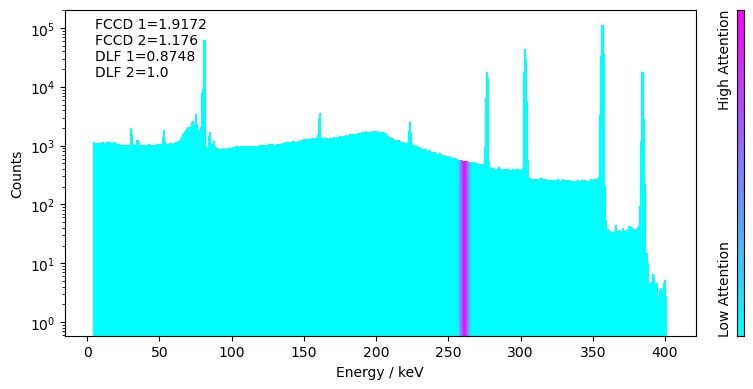

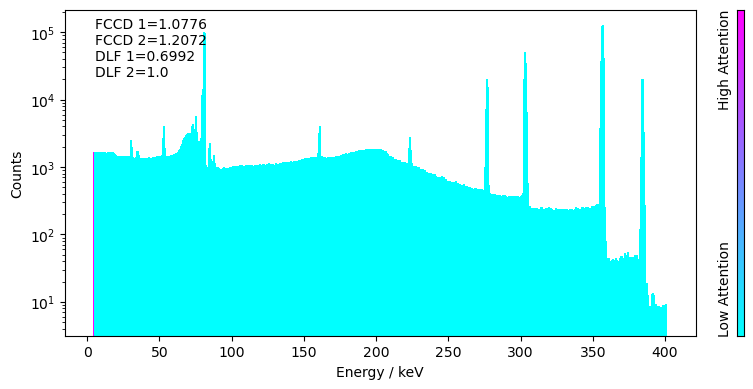

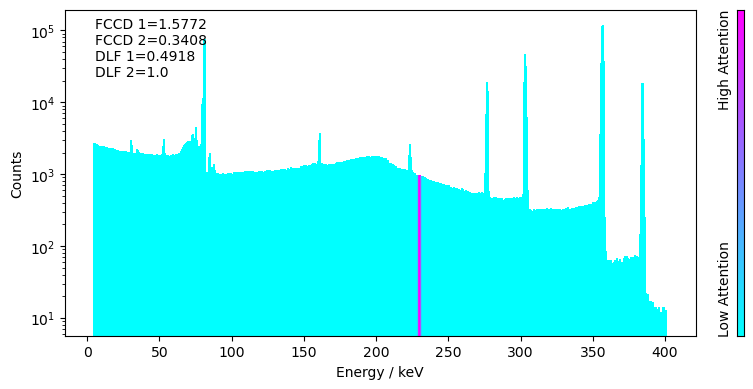

In [44]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.52it/s]


saved average attention to csv file


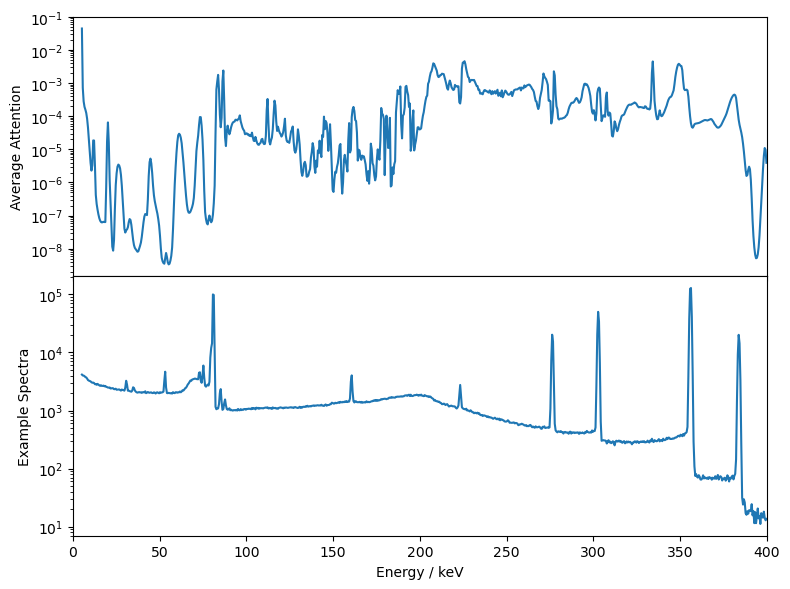

In [45]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True, maxE=400)

# TRAINING 5: restircted dataset - Max FCCD diff = 0.05 mm

In [46]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.05
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_maxE400_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff =0.05 mm

In [47]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:25<00:00, 192.00it/s]


(4908, 790)


In [48]:
# Load saved model
RNNclassifier_maxFCCDdiff0_05mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_05mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_05mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:06<00:00, 11.34it/s]


FCCD accuracies: 
total:  3000
TP:  1352
FP:  45
TN:  1456
FN:  147
accuracy:  0.936
precision:  0.9677881173944166
recall:  0.9019346230820547

DLF accuracies: 
accuracy_DLF:  0.9736666666666667

roc auc FCCD:  0.9884951059978249

Total # misclassified trials FCCD:  192  / 3000
Total # misclassified trials DLF:  79  / 3000


{'accuracy_FCCD': 0.936,
 'precision_FCCD': 0.9677881173944166,
 'recall_FCCD': 0.9019346230820547,
 'accuracy_DLF': 0.9736666666666667,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9884951059978249,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.006491597132704191,
  'RMSE_DLFmisclassified_FCCD': 0.026327172275046936,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 192,
  'NoMisclassifiedDLF': 79}}

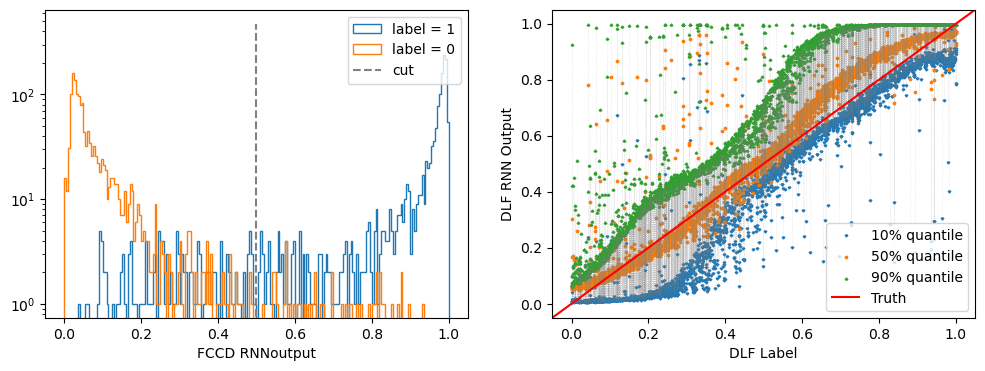

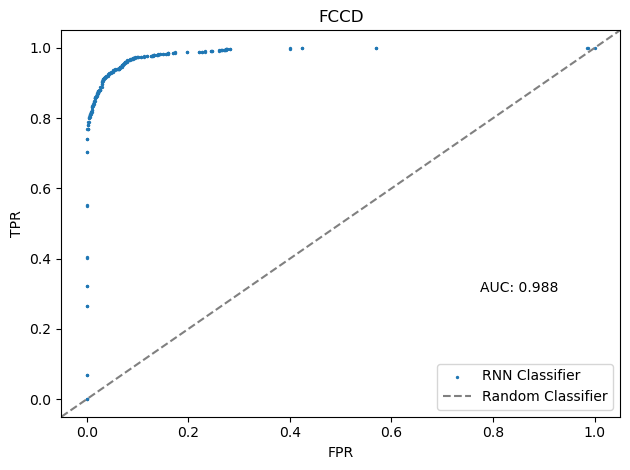

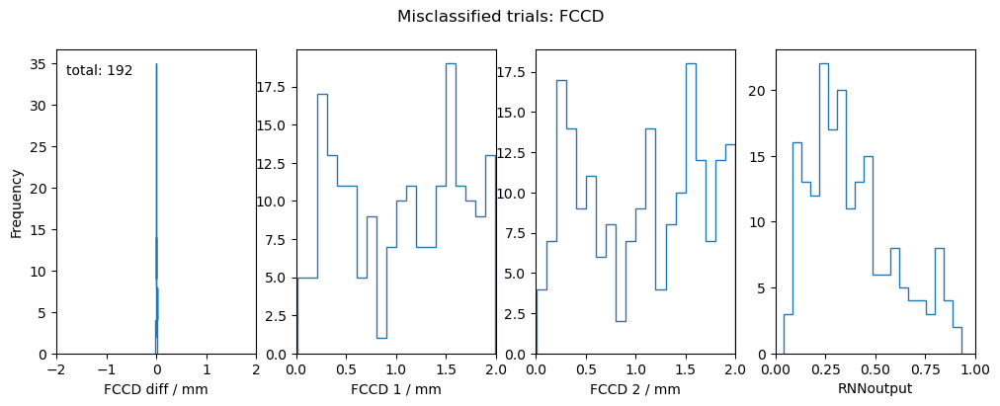

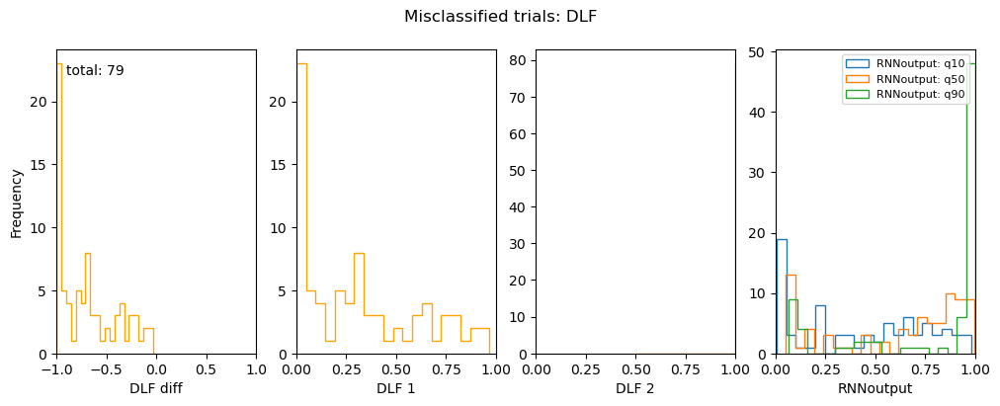

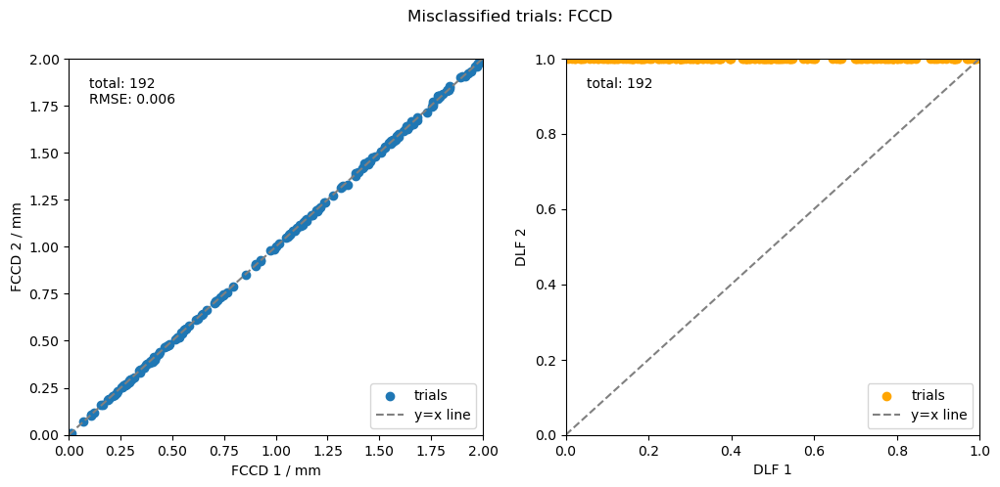

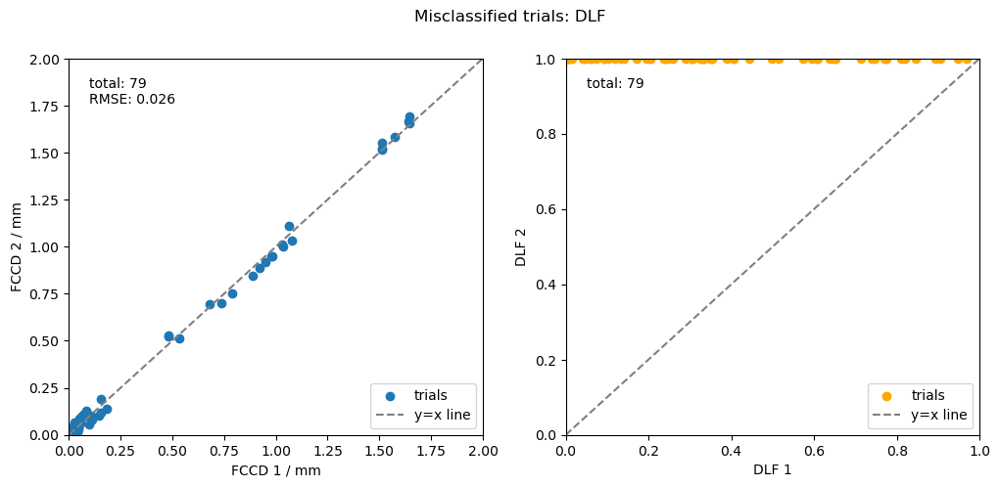

In [49]:
test_RNN(RNNclassifier_maxFCCDdiff0_05mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

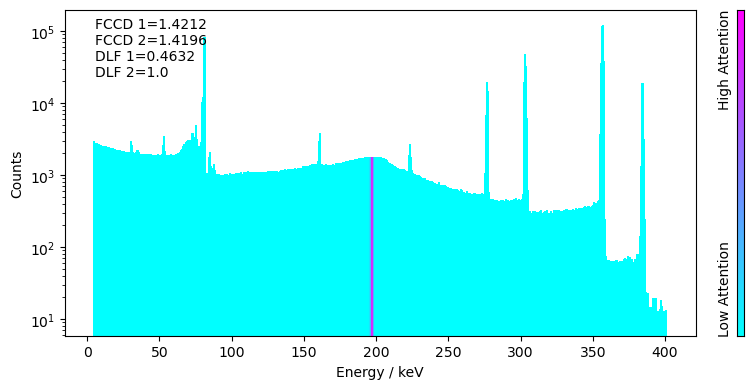

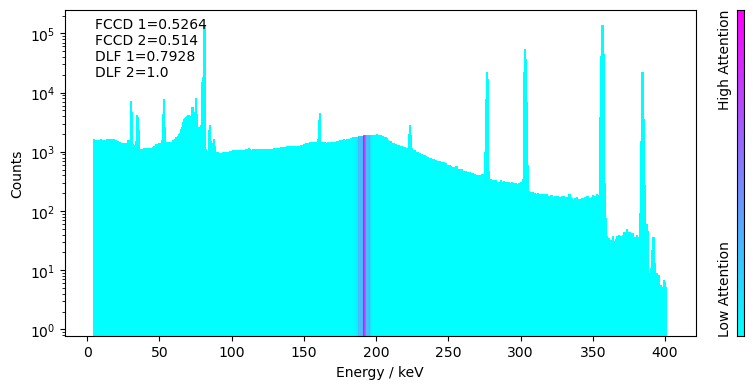

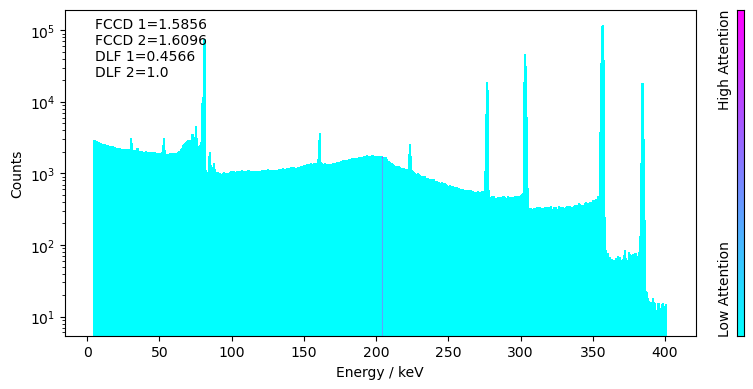

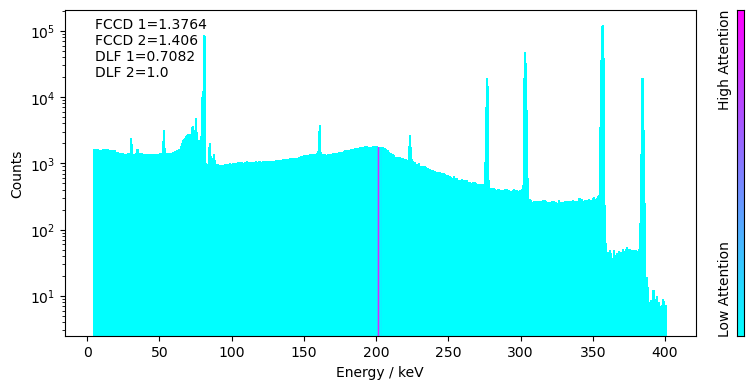

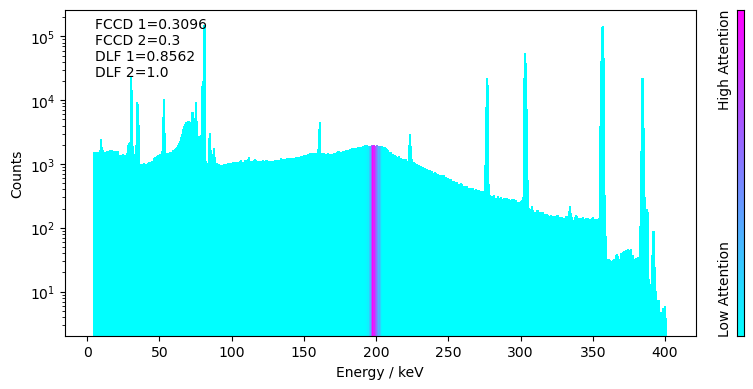

...

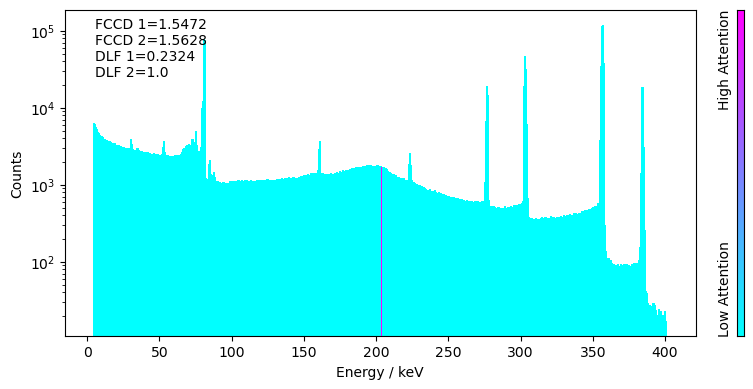

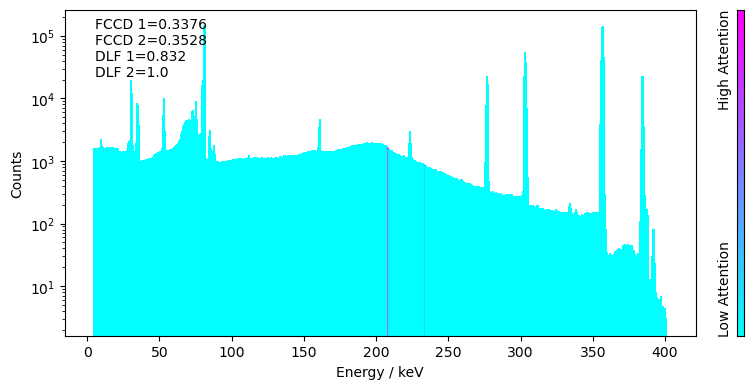

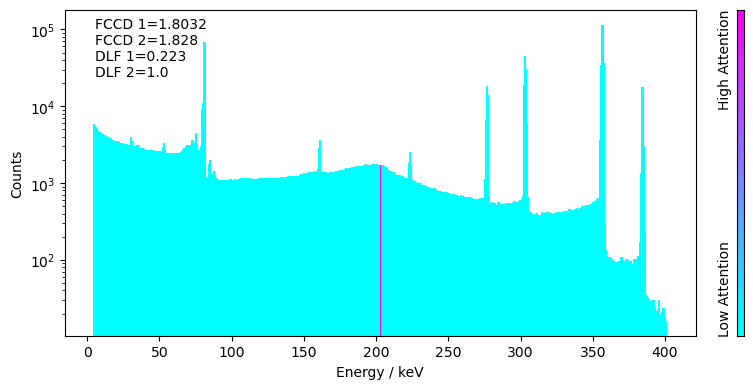

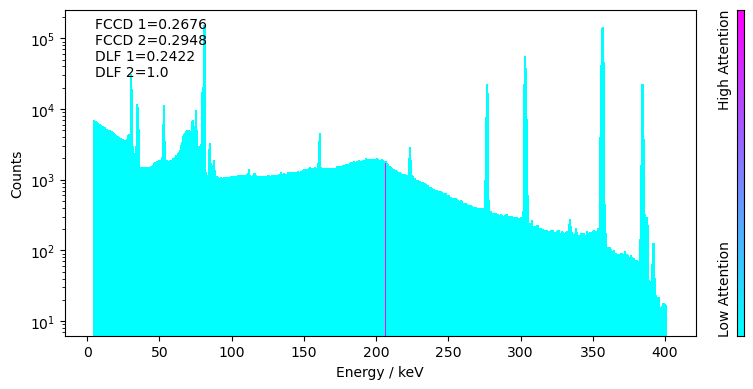

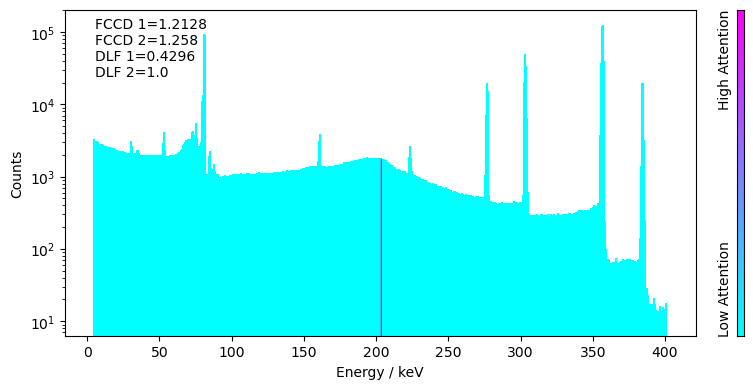

In [50]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, maxE=400)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.10it/s]


saved average attention to csv file


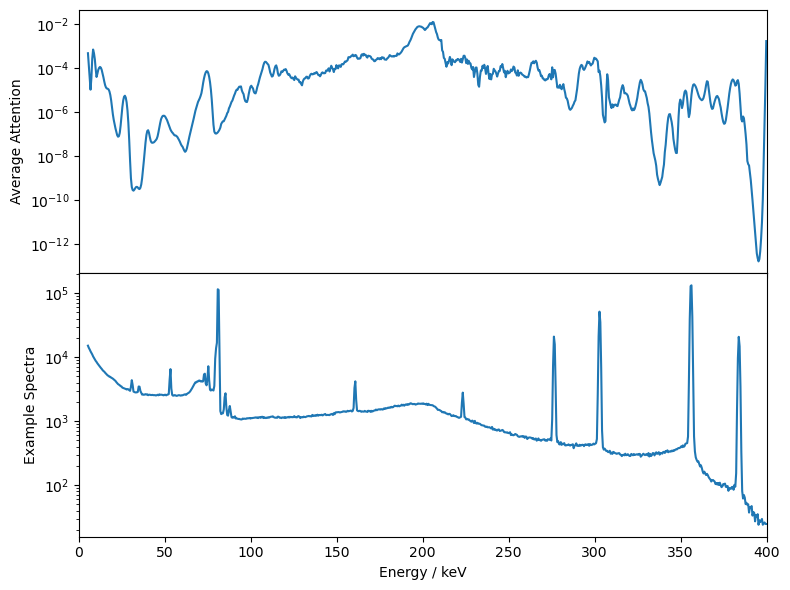

In [51]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True, maxE=400)

## Testing - on full dataset

In [52]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:28<00:00, 169.65it/s]


(4908, 790)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.39it/s]


FCCD accuracies: 
total:  3000
TP:  1461
FP:  811
TN:  719
FN:  9
accuracy:  0.7266666666666667
precision:  0.6430457746478874
recall:  0.9938775510204082

DLF accuracies: 
accuracy_DLF:  0.8426666666666667

roc auc FCCD:  0.748764839269041

Total # misclassified trials FCCD:  820  / 3000
Total # misclassified trials DLF:  472  / 3000


{'accuracy_FCCD': 0.7266666666666667,
 'precision_FCCD': 0.6430457746478874,
 'recall_FCCD': 0.9938775510204082,
 'accuracy_DLF': 0.8426666666666667,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.748764839269041,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.035110920602821,
  'RMSE_DLFmisclassified_FCCD': 1.017093866974572,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 820,
  'NoMisclassifiedDLF': 472}}

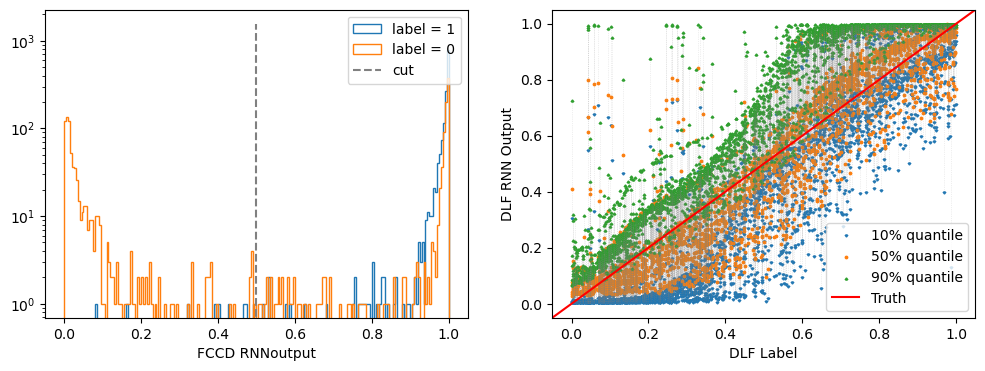

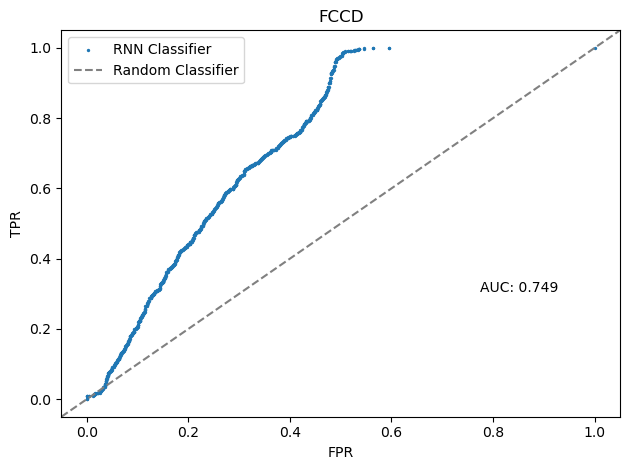

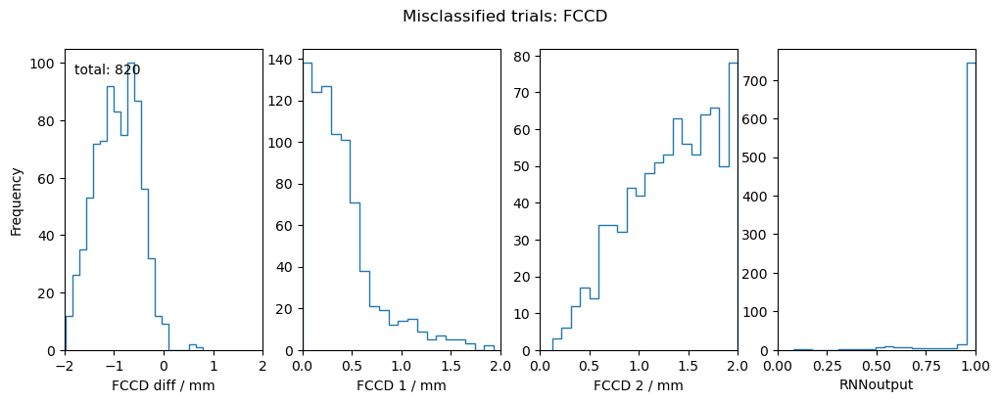

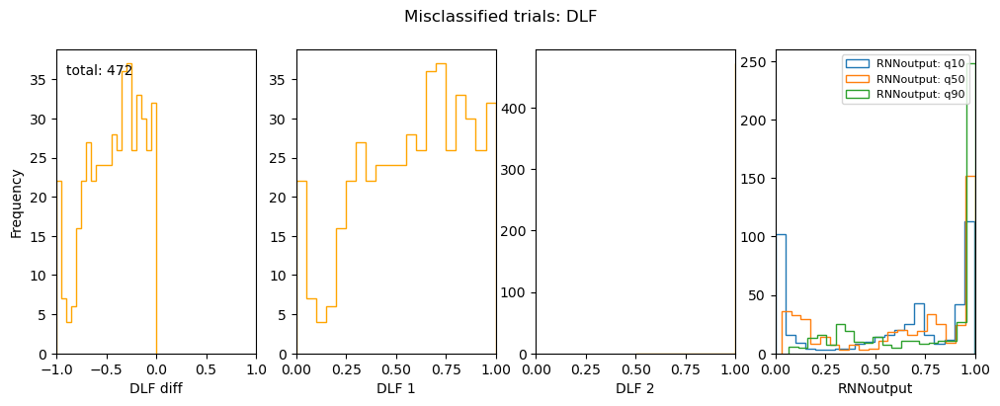

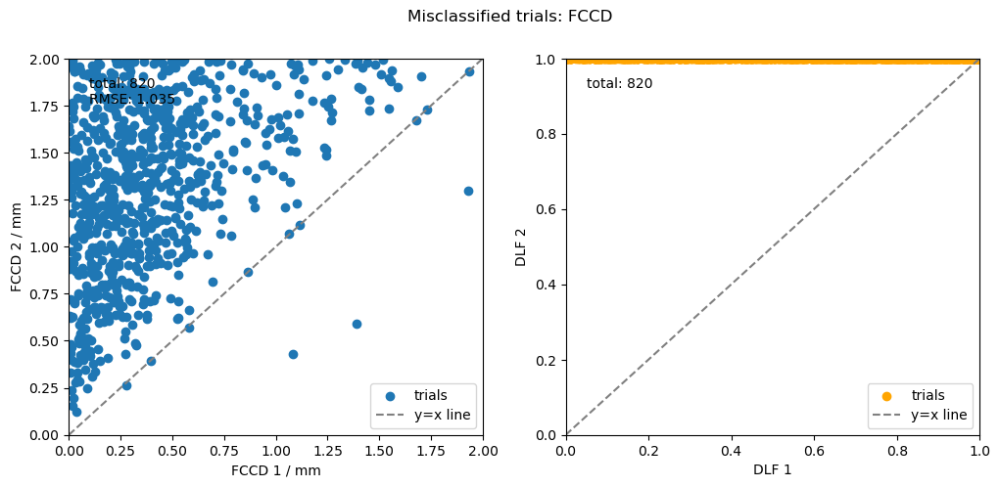

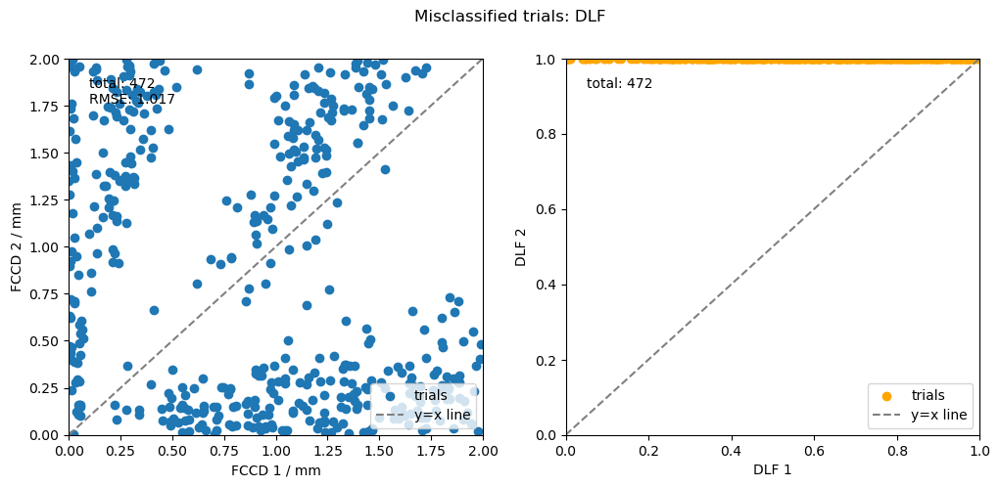

In [53]:
test_RNN(RNNclassifier_maxFCCDdiff0_05mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

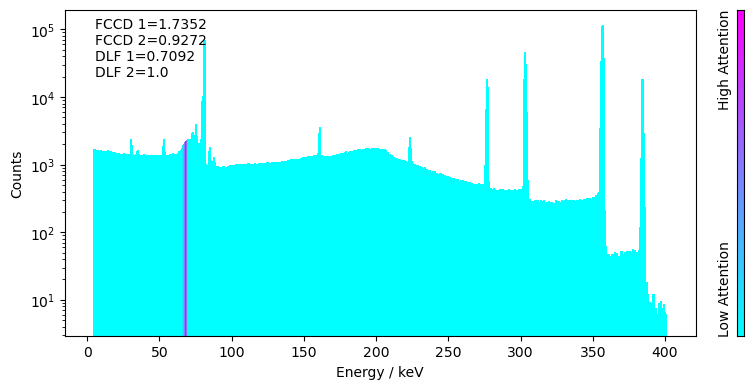

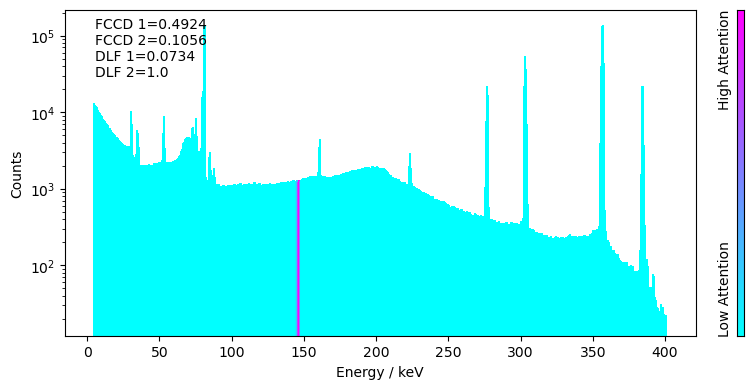

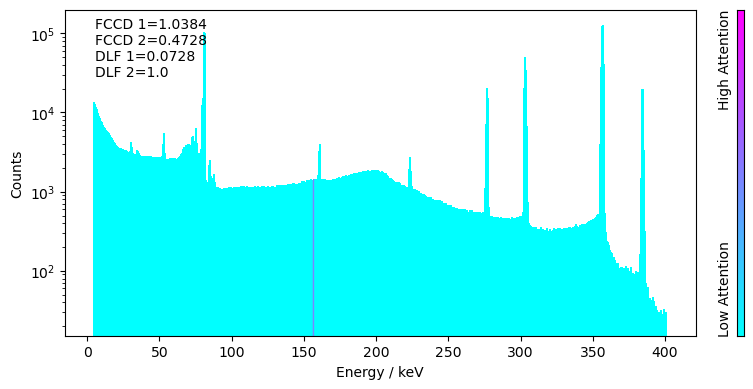

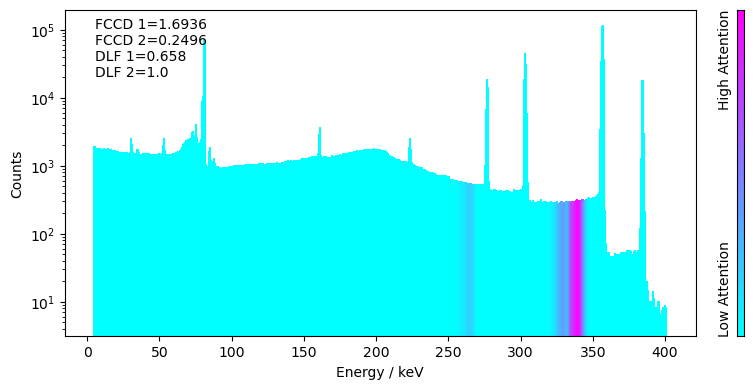

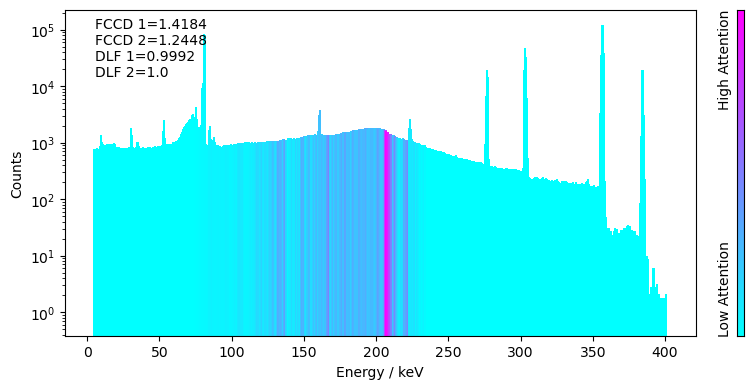

...

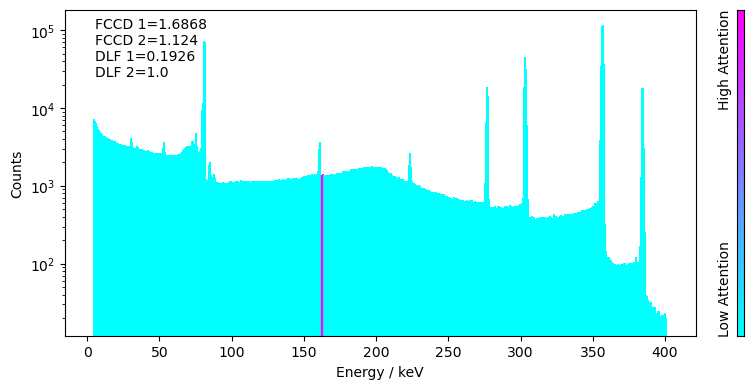

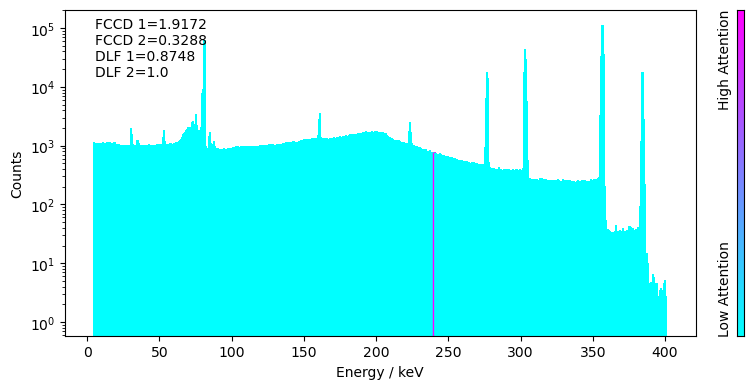

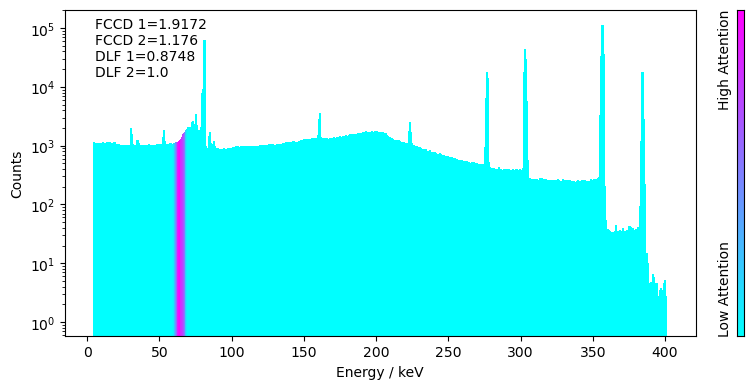

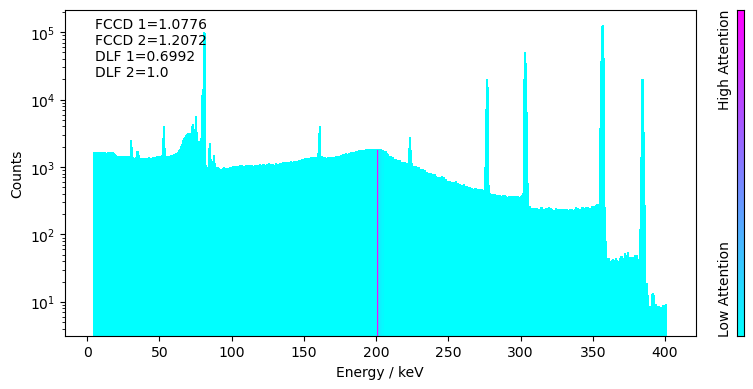

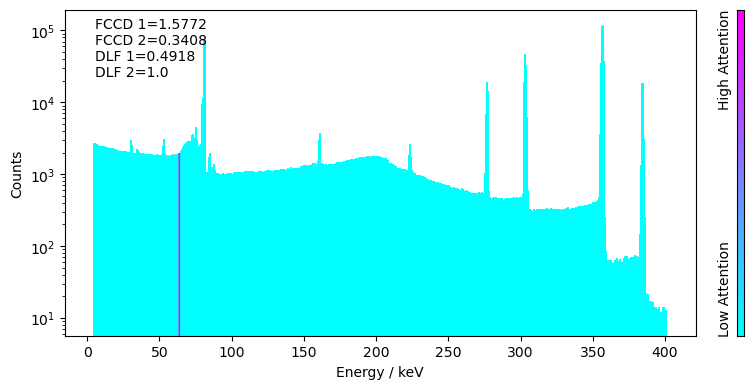

In [54]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.46it/s]


saved average attention to csv file


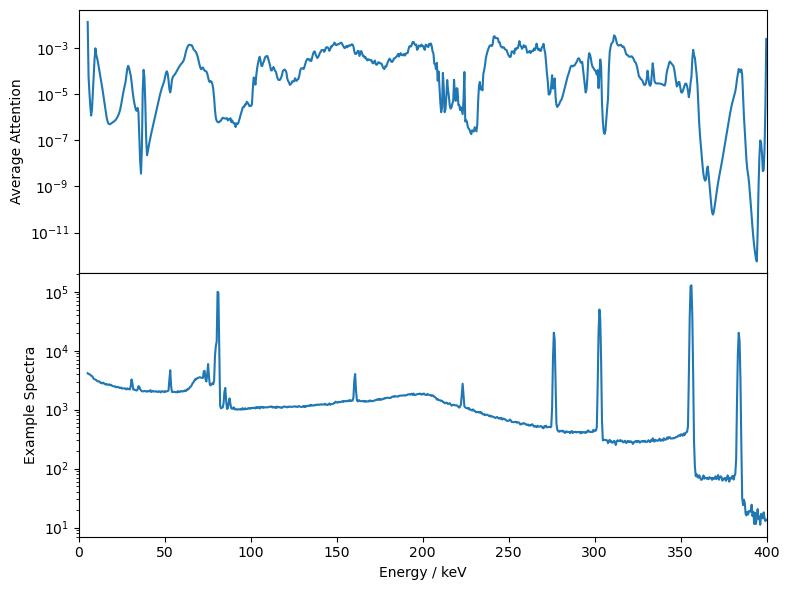

In [55]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True, maxE=400)

# TRAINING 6: restircted dataset - Max FCCD diff = 0.01 mm

In [56]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.01
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_maxE400_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff =0.01 mm

In [57]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:23<00:00, 212.88it/s]

(4908, 790)


In [58]:
# Load saved model
RNNclassifier_maxFCCDdiff0_01mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_01mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_01mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:05<00:00, 11.45it/s]


FCCD accuracies: 
total:  3000
TP:  1332
FP:  410
TN:  997
FN:  261
accuracy:  0.7763333333333333
precision:  0.764638346727899
recall:  0.8361581920903954

DLF accuracies: 
accuracy_DLF:  0.9816666666666667

roc auc FCCD:  0.858841832448376

Total # misclassified trials FCCD:  671  / 3000
Total # misclassified trials DLF:  55  / 3000


{'accuracy_FCCD': 0.7763333333333333,
 'precision_FCCD': 0.764638346727899,
 'recall_FCCD': 0.8361581920903954,
 'accuracy_DLF': 0.9816666666666667,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.858841832448376,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.004259566247867285,
  'RMSE_DLFmisclassified_FCCD': 0.005090597393055339,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 671,
  'NoMisclassifiedDLF': 55}}

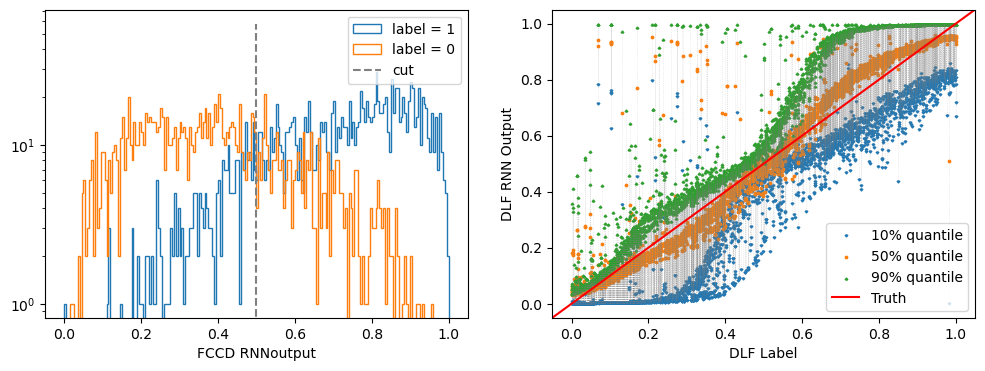

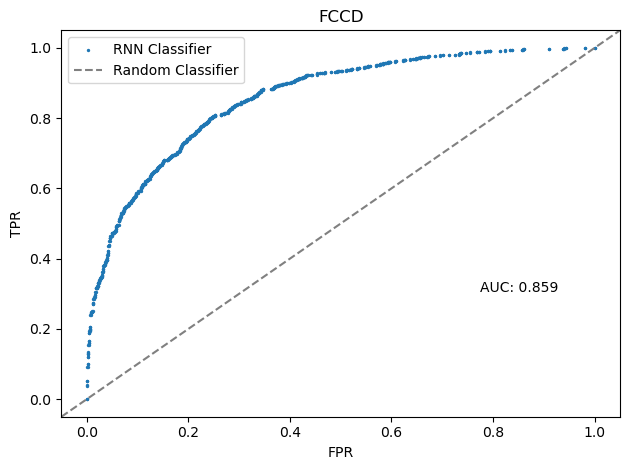

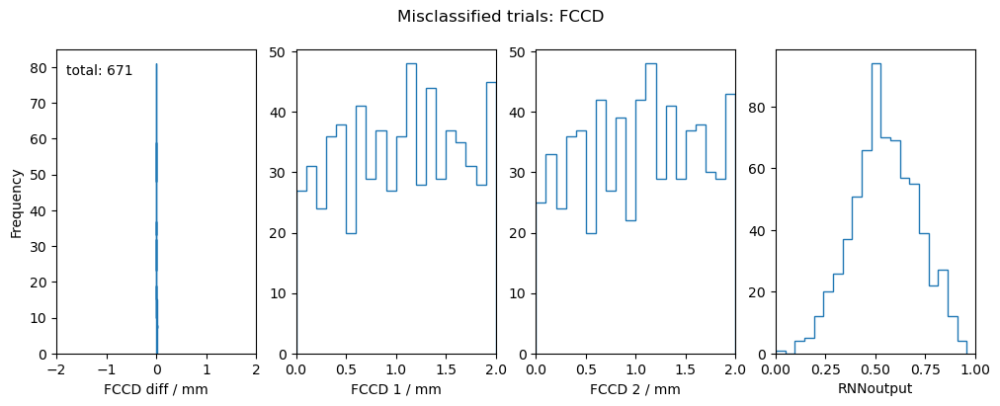

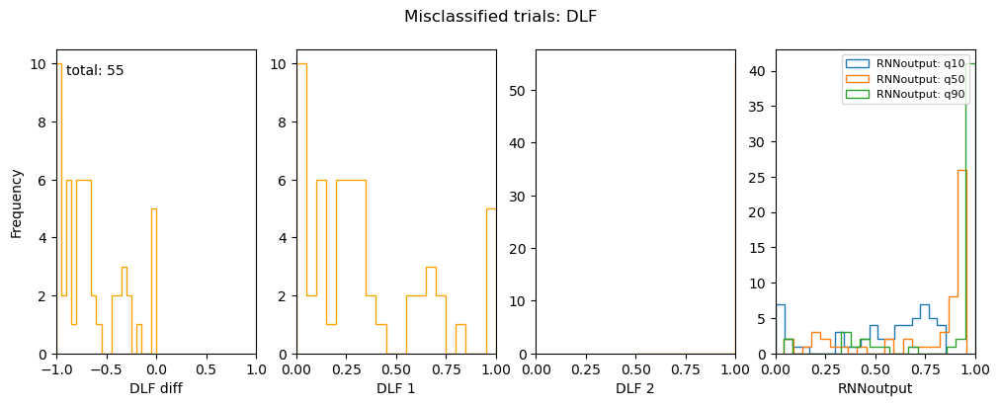

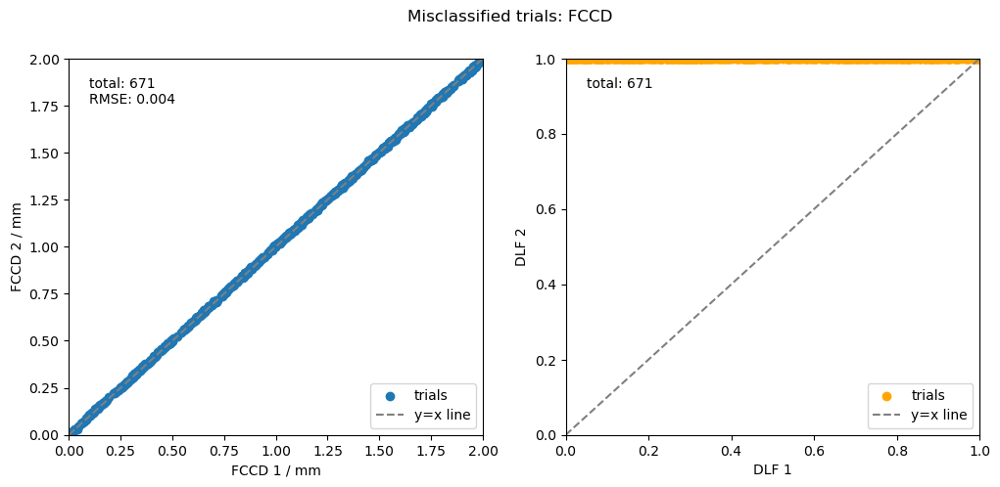

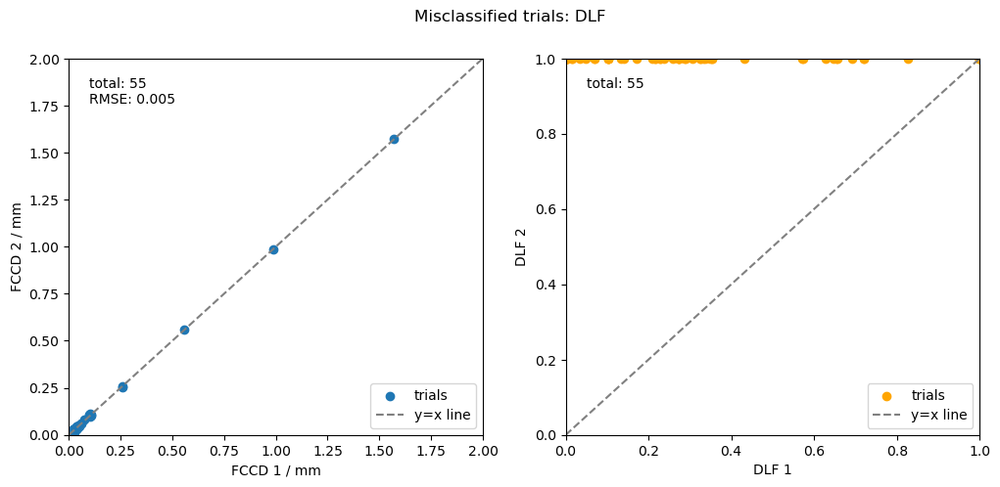

In [59]:
test_RNN(RNNclassifier_maxFCCDdiff0_01mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

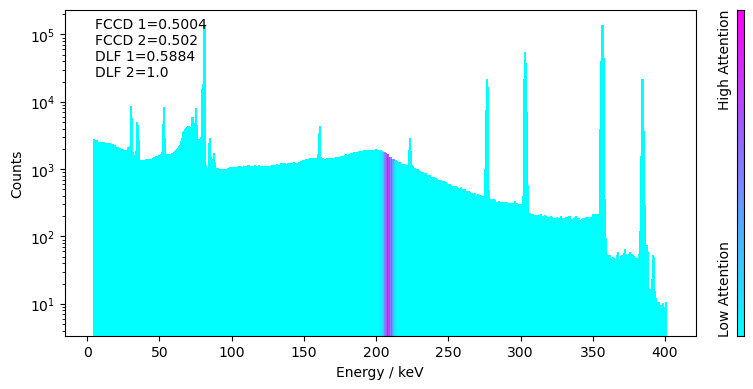

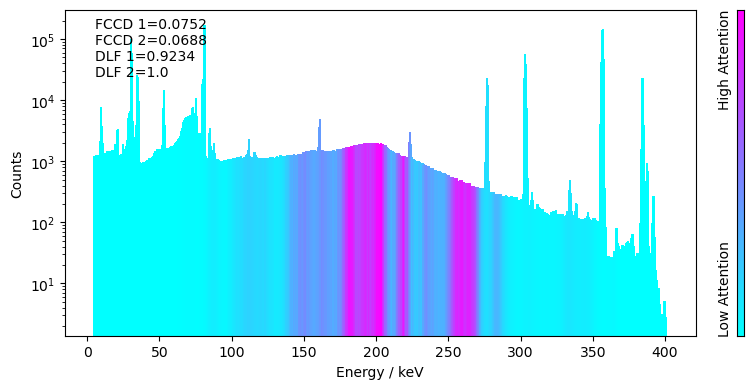

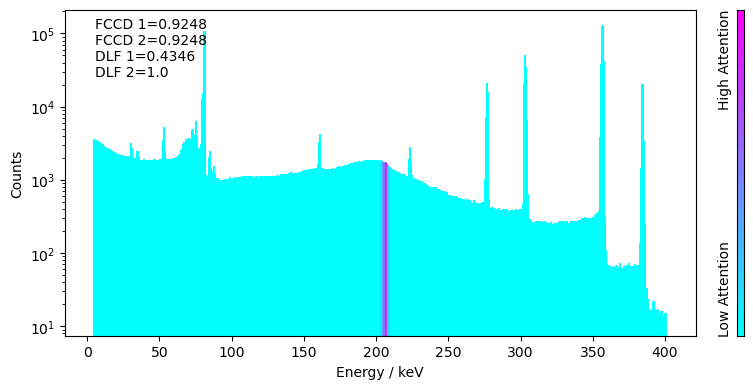

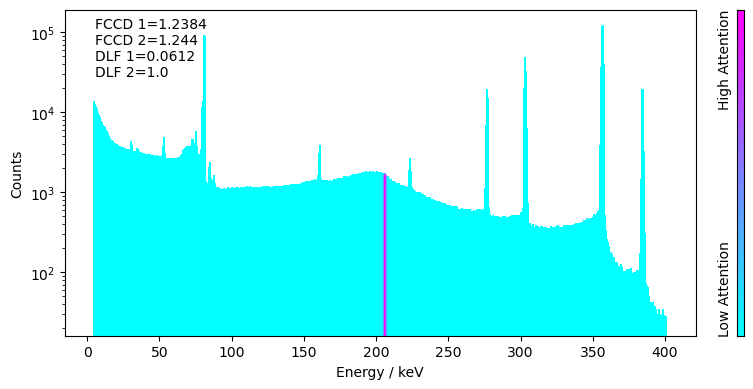

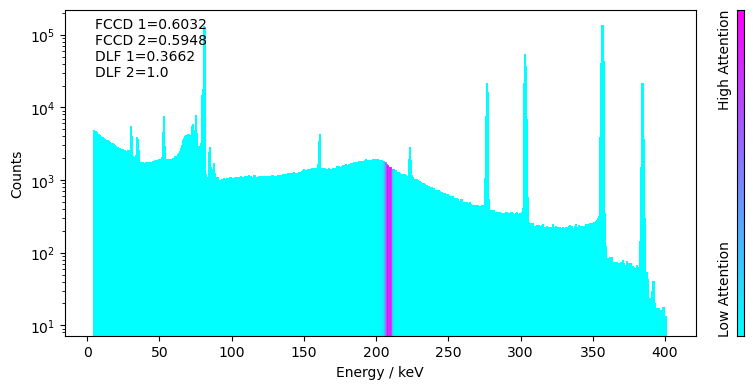

...

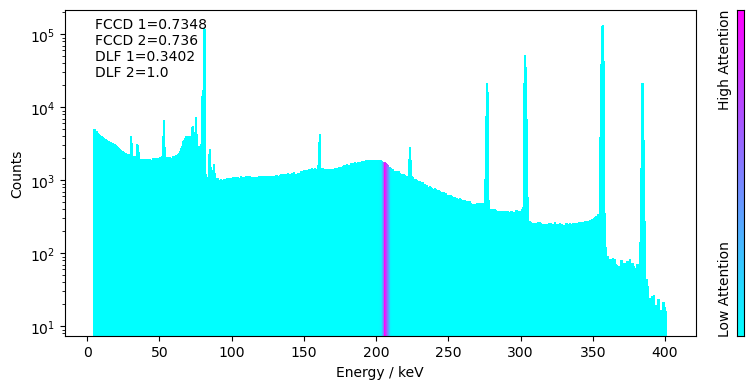

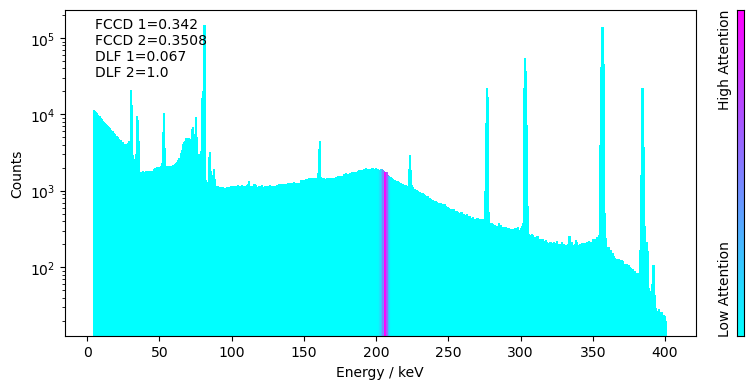

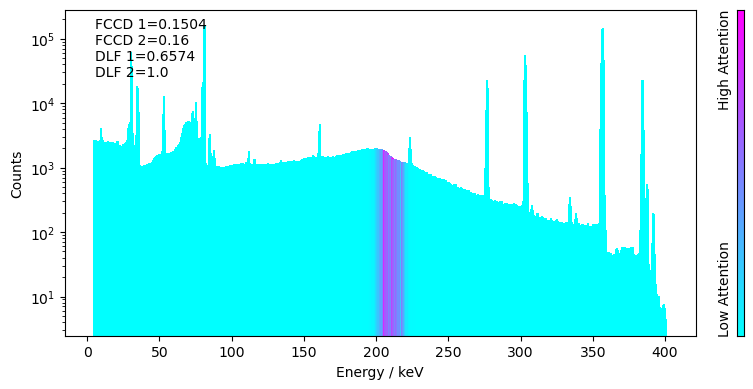

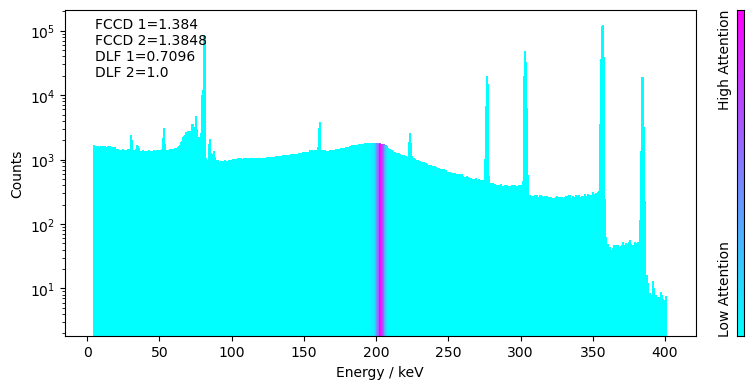

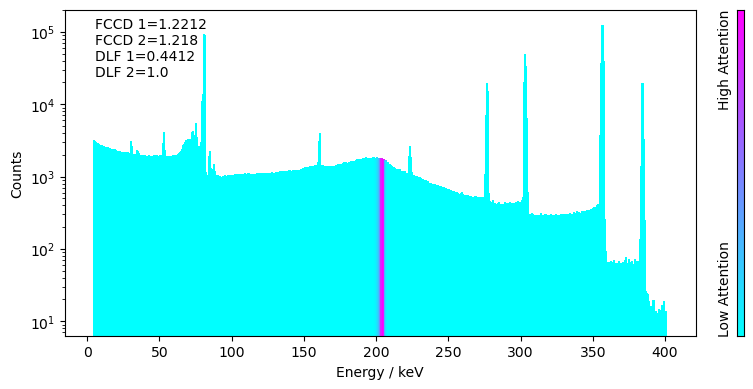

In [60]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, maxE=400)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:06<00:00, 11.27it/s]


saved average attention to csv file


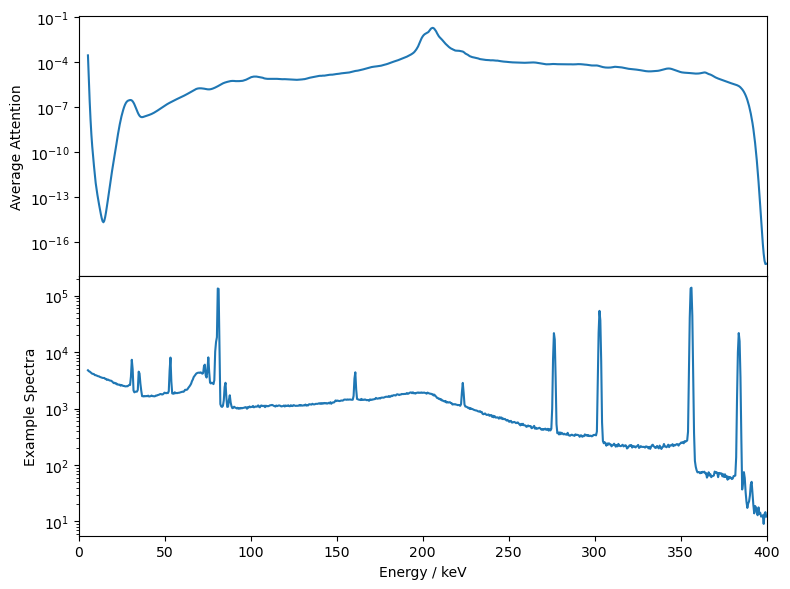

In [61]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True, maxE=400)

## Testing - on full dataset

In [62]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly, maxE=400)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 198.66it/s]

(4908, 790)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.60it/s]


FCCD accuracies: 
total:  3000
TP:  1210
FP:  678
TN:  852
FN:  260
accuracy:  0.6873333333333334
precision:  0.6408898305084746
recall:  0.8231292517006803

DLF accuracies: 
accuracy_DLF:  0.9223333333333333

roc auc FCCD:  0.7928787070383708

Total # misclassified trials FCCD:  938  / 3000
Total # misclassified trials DLF:  233  / 3000


{'accuracy_FCCD': 0.6873333333333334,
 'precision_FCCD': 0.6408898305084746,
 'recall_FCCD': 0.8231292517006803,
 'accuracy_DLF': 0.9223333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.7928787070383708,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.0864535021258157,
  'RMSE_DLFmisclassified_FCCD': 1.0745688010334686,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 938,
  'NoMisclassifiedDLF': 233}}

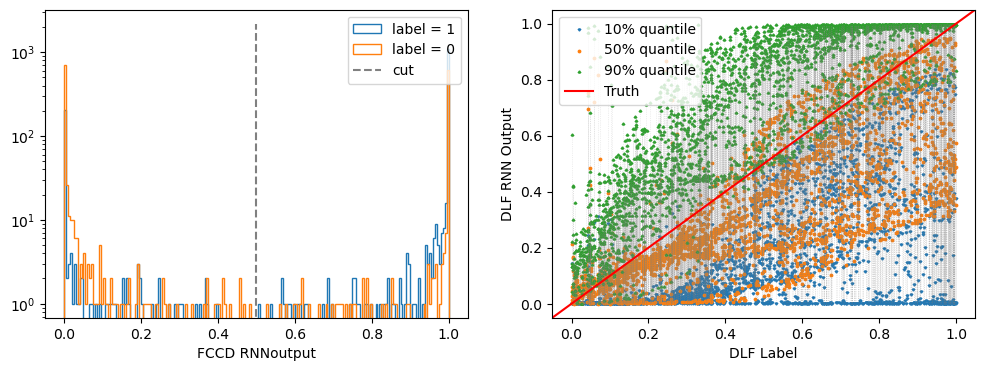

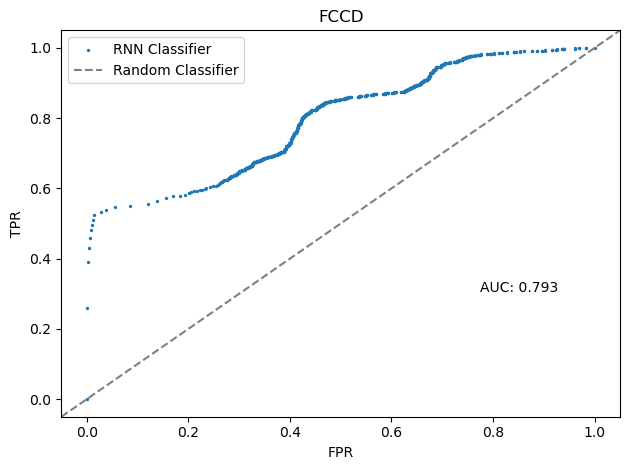

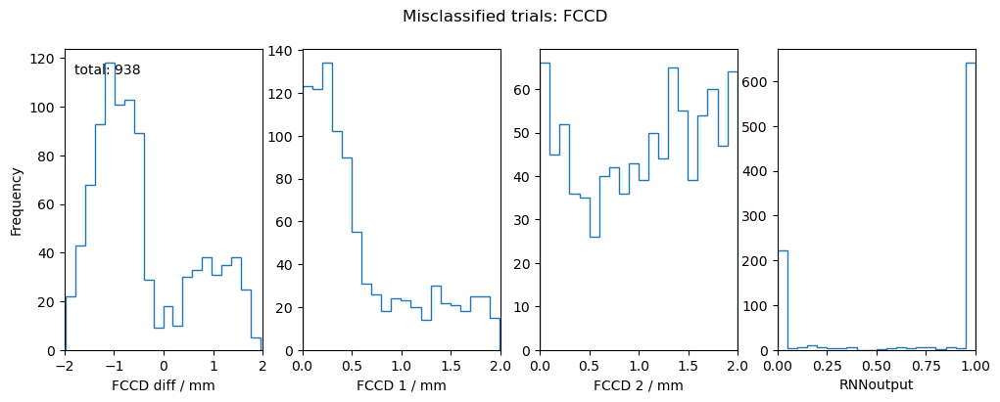

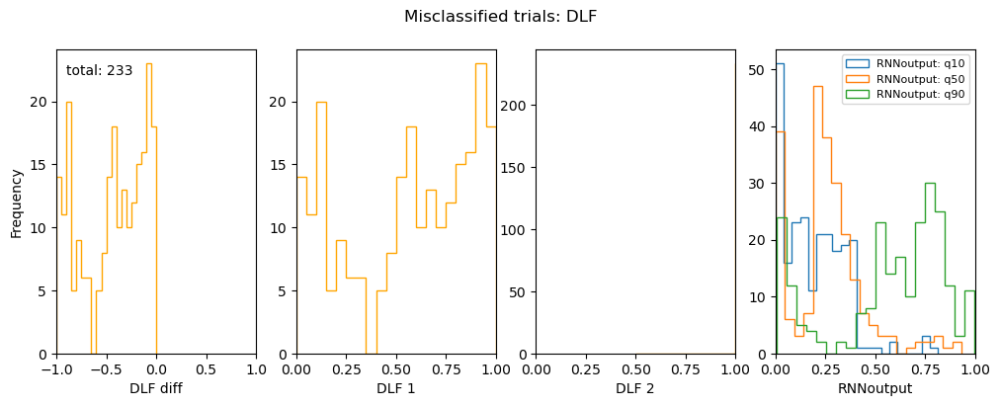

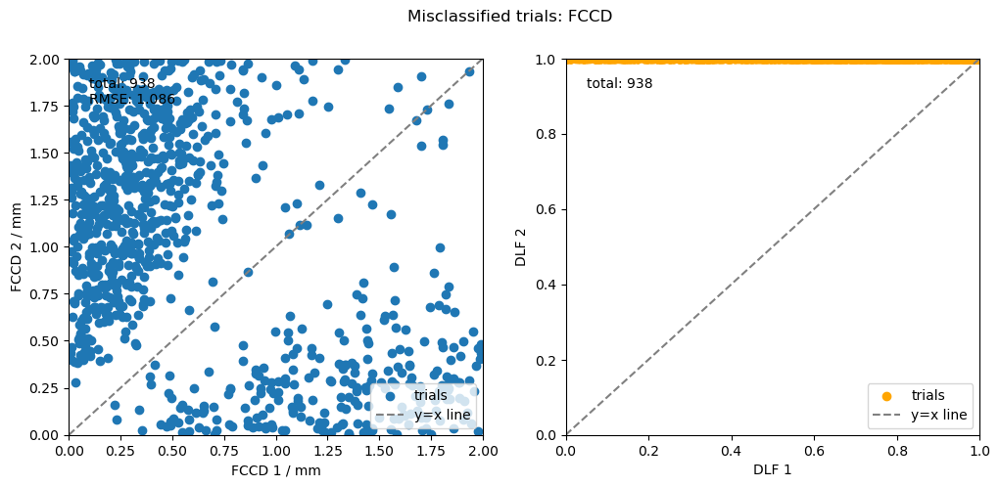

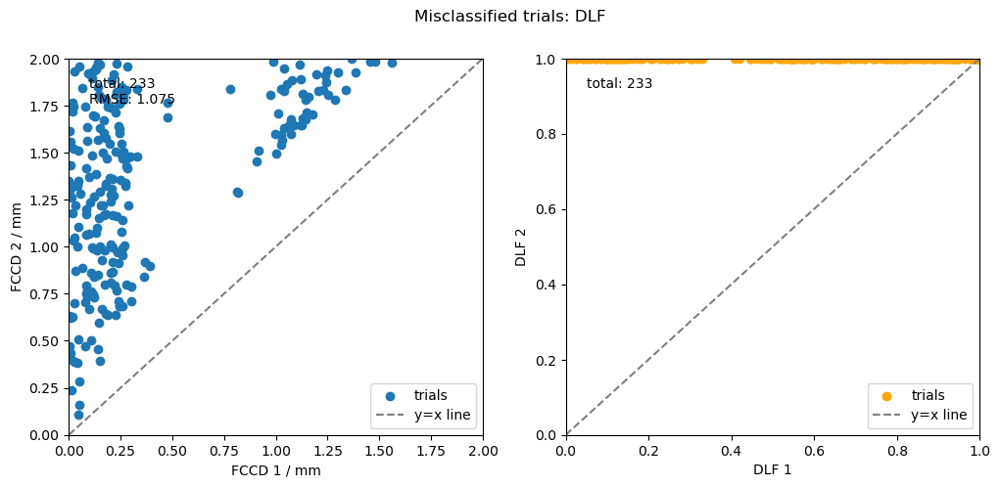

In [63]:
test_RNN(RNNclassifier_maxFCCDdiff0_01mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

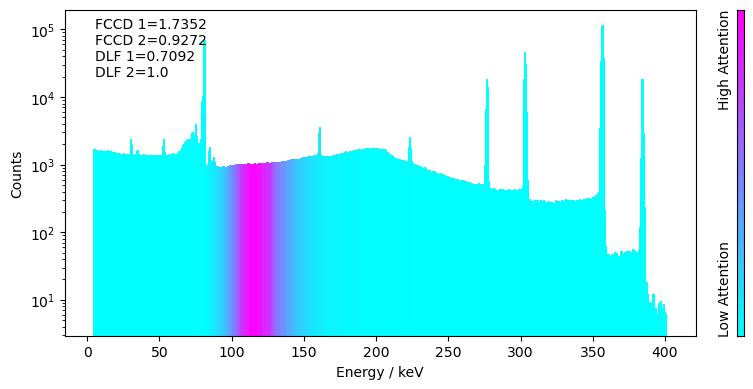

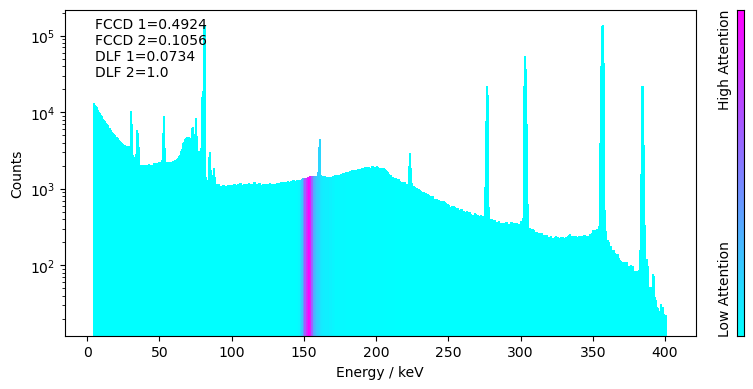

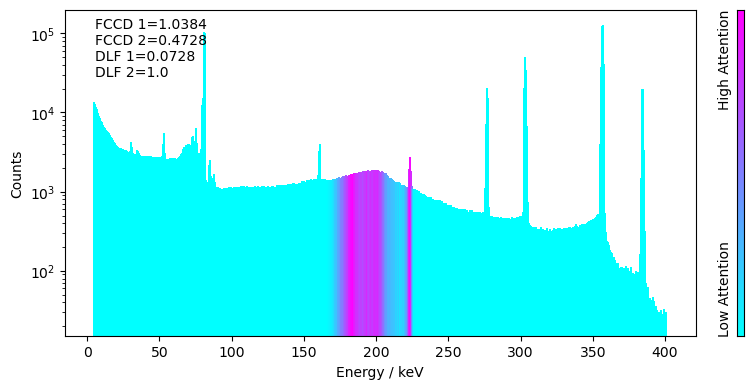

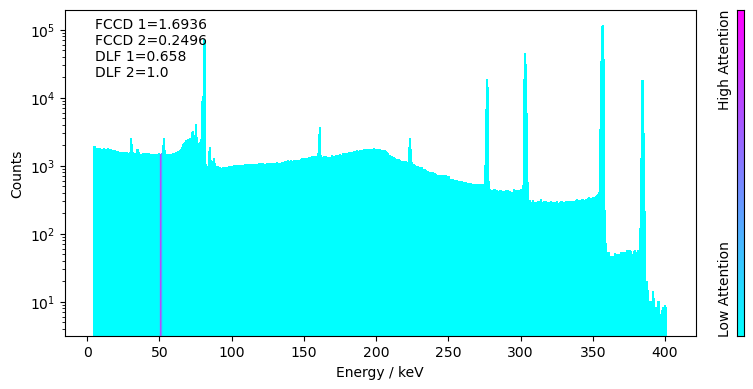

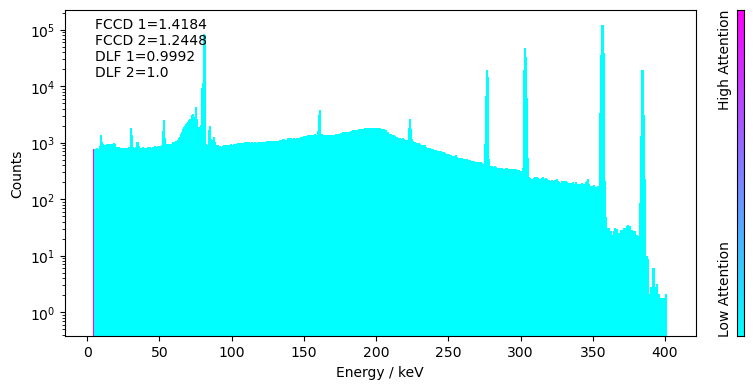

...

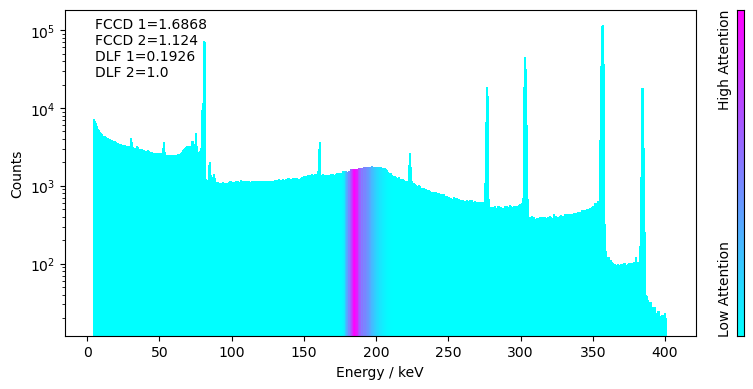

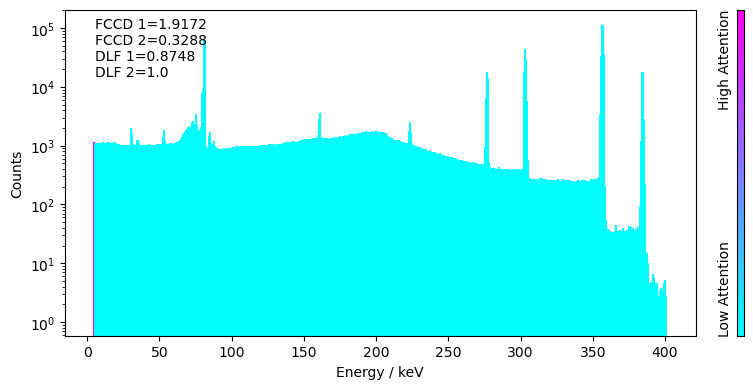

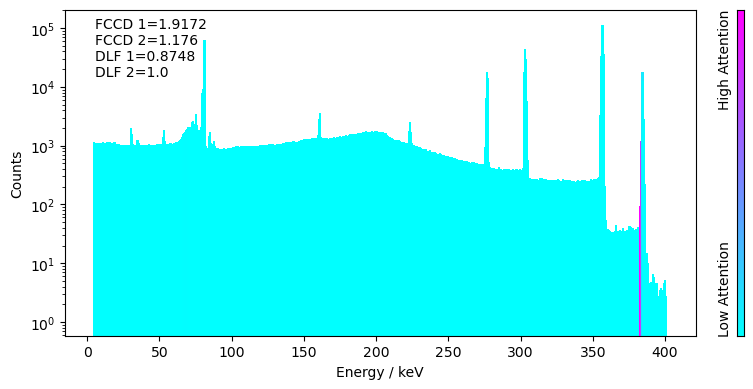

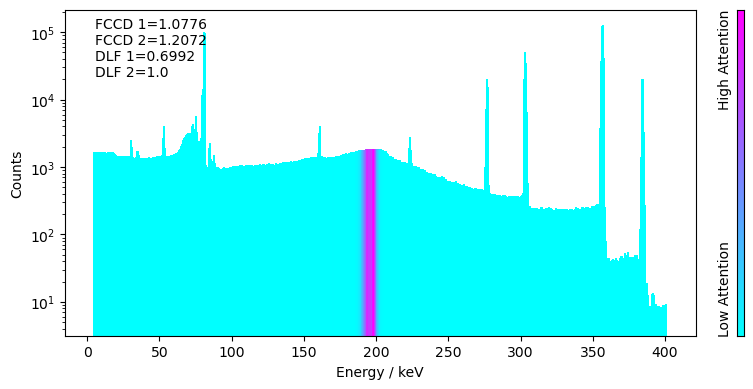

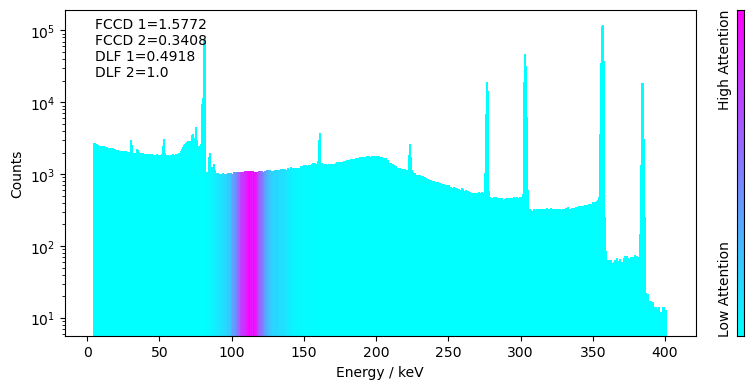

In [64]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True, maxE=400)
    

100%|████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:11<00:00, 10.44it/s]


saved average attention to csv file


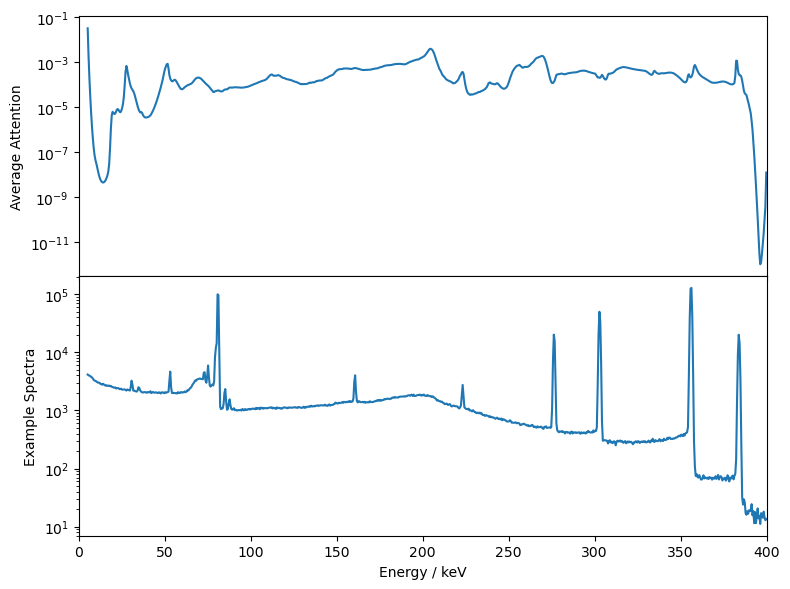

In [65]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True, maxE=400)